# SQL

In [1]:
from sqlalchemy import create_engine

engine = create_engine('postgresql://cs_user@pademopg:t4qwe123@pademopg.postgres.database.azure.com:5432/cs_db',connect_args={
    'sslmode':'require','options': '-csearch_path=case_study'})

In [2]:
engine.execute("SELECT * FROM employee").keys()

RMKeyView(['index', 'employee_id', 'gender', 'year_of_birth', 'employment_date', 'leave_date'])

In [3]:
engine.execute("SELECT * FROM employee_History").keys()

RMKeyView(['index', 'year', 'month', 'employee_id', 'marital_status', 'military_status', 'title', 'employment_type', 'department_code', 'first_manager_id', 'second_manager_id', 'location', 'education', 'number_of_children'])

In [4]:
engine.execute("SELECT * FROM bonus").keys()

RMKeyView(['index', 'employee_id', 'bonus_date', 'date_range_type', 'bonus_amount'])

In [5]:
engine.execute("SELECT * FROM timeoff").keys()

RMKeyView(['index', 'employee_id', 'timeoff_start_date', 'timeoff_end_date', 'timeoff_type'])

In [6]:
engine.execute("SELECT * FROM notice").keys()

RMKeyView(['index', 'employee_id', 'notice_date', 'date_range_type'])

In [7]:
print("Tabloların sahip olduğu eşsiz çalışan sayıları:")

Tabloların sahip olduğu eşsiz çalışan sayıları:


In [8]:
engine.execute("SELECT count(distinct employee_id) FROM employee").fetchall()

[(3125,)]

In [9]:
engine.execute("SELECT count(distinct employee_id) FROM employee_history").fetchall()

[(2916,)]

In [10]:
engine.execute("SELECT count(distinct employee_id) FROM bonus").fetchall()

[(1981,)]

In [11]:
engine.execute("SELECT count(distinct employee_id) FROM timeoff").fetchall()

[(1829,)]

In [12]:
engine.execute("SELECT count(distinct employee_id) FROM notice").fetchall()

[(267,)]

In [13]:
engine.execute("SELECT count(distinct employee.employee_id) FROM employee"
            " full join employee_history on employee.employee_id=employee_history.employee_id").fetchall()

[(3125,)]

# Python

**Gerekli Kütüphaneler**

In [14]:
import pandas as pd
pd.pandas.set_option('display.max_columns', None)

import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

from sklearn.preprocessing import LabelEncoder, OneHotEncoder
import math
import warnings
import re

from sklearn.preprocessing import MinMaxScaler
import hvplot.pandas

from scipy.stats import chi2_contingency, shapiro, mannwhitneyu, ttest_ind

from sklearn.model_selection import train_test_split, GridSearchCV, RandomizedSearchCV, cross_val_score
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from catboost import CatBoostClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
import xgboost as xgb

from sklearn.metrics import confusion_matrix, accuracy_score, roc_auc_score, roc_curve, precision_recall_curve, average_precision_score, auc

from sklearn.model_selection import StratifiedKFold
import xgboost
from sklearn.metrics import precision_score, recall_score, f1_score, brier_score_loss
from sklearn.metrics import classification_report
from sklearn.metrics import make_scorer

from statistics import mean

from sklearn.feature_selection import SelectFromModel

In [15]:
df_employee = pd.DataFrame(engine.execute("SELECT * FROM employee").fetchall())
df_employee_history = pd.DataFrame(engine.execute("SELECT * FROM employee_history").fetchall())
df_bonus = pd.DataFrame(engine.execute("SELECT * FROM bonus").fetchall())
df_timeoff = pd.DataFrame(engine.execute("SELECT * FROM timeoff").fetchall())
df_notice = pd.DataFrame(engine.execute("SELECT * FROM notice").fetchall())

In [16]:
df_employee

,index,employee_id,gender,year_of_birth,employment_date,leave_date
0,0,71429,ERKEK,1992.0,2019-07-16,NaT
1,1,71426,ERKEK,1994.0,2019-07-16,NaT
2,2,71423,KADIN,1997.0,2019-07-16,NaT
3,3,71420,ERKEK,1995.0,2019-07-16,NaT
4,4,71417,KADIN,1993.0,2019-07-16,NaT
...,...,...,...,...,...,...
3120,3120,88802,KADIN,1995.0,2017-10-18,2019-04-30
3121,3121,88799,KADIN,1997.0,2017-10-18,2017-11-24
3122,3122,88796,KADIN,1998.0,2017-10-18,2018-02-07
3123,3123,88793,KADIN,1998.0,2017-10-18,2019-01-30


In [17]:
df_employee_history = df_employee_history.drop(df_employee_history[(df_employee_history["year"]>2018) & (df_employee_history["month"]>5)].index)

In [18]:
df_employee_history.reset_index(inplace=True)

## Merging

In [19]:
df_employee_history.drop(columns=["index","level_0"], inplace=True)

In [20]:
df_merge = pd.merge(df_employee, df_employee_history, on='employee_id', how='outer')

df_merge

,index,employee_id,gender,year_of_birth,employment_date,leave_date,year,month,marital_status,military_status,title,employment_type,department_code,first_manager_id,second_manager_id,location,education,number_of_children
0,0,71429,ERKEK,1992.0,2019-07-16,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,1,71426,ERKEK,1994.0,2019-07-16,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2,71423,KADIN,1997.0,2019-07-16,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,3,71420,ERKEK,1995.0,2019-07-16,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,4,71417,KADIN,1993.0,2019-07-16,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41547,3124,88790,ERKEK,1994.0,2017-10-18,2018-06-12,2018.0,1.0,Bekar,Tecilli,Dis Kaynak ...,Dis Kaynak ...,TS,132068.0,132068.0,Istanbul,On Lisans,0.0
41548,3124,88790,ERKEK,1994.0,2017-10-18,2018-06-12,2018.0,2.0,Bekar,Tecilli,Dis Kaynak ...,Dis Kaynak ...,TS,132068.0,132068.0,Istanbul,On Lisans,0.0
41549,3124,88790,ERKEK,1994.0,2017-10-18,2018-06-12,2018.0,3.0,Bekar,Tecilli,Dis Kaynak ...,Dis Kaynak ...,TS,132068.0,132068.0,Istanbul,On Lisans,0.0
41550,3124,88790,ERKEK,1994.0,2017-10-18,2018-06-12,2018.0,4.0,Bekar,Tecilli,Dis Kaynak ...,Dis Kaynak ...,TS,132068.0,132068.0,Istanbul,On Lisans,0.0


In [21]:
index_ayrilanlar=df_merge[df_merge["leave_date"].notnull()].sort_values(['year', 'month'], ascending=False).groupby(['employee_id']).head(1).index

In [22]:
index_ayrilmayanlar=df_merge[df_merge["leave_date"].isna()].sort_values(['year', 'month'], ascending=True).groupby(['employee_id']).head(1).index

In [23]:
indexler = np.concatenate((index_ayrilanlar.values, index_ayrilmayanlar.values))

In [24]:
df_merge=df_merge.loc[indexler]

In [25]:
df_merge

,index,employee_id,gender,year_of_birth,employment_date,leave_date,year,month,marital_status,military_status,title,employment_type,department_code,first_manager_id,second_manager_id,location,education,number_of_children
4776,250,120977,KADIN,1987.0,2014-03-17,2019-08-09,2019.0,5.0,Evli,Tamamlamis,Uzman Yardimcisi ...,Kadrolu ...,IM ...,164330.0,164330.0,Istanbul,On Lisans,0.0
5191,267,118211,KADIN,1991.0,2014-07-17,2019-08-26,2019.0,5.0,Evli,Tamamlamis,Uzman ...,Kadrolu ...,IM ...,164330.0,164330.0,Istanbul,On Lisans,0.0
7681,373,110831,KADIN,1994.0,2015-09-16,2019-09-18,2019.0,5.0,Evli,Tecilli,Uzman ...,Kadrolu ...,IM ...,164330.0,164330.0,Istanbul,On Lisans,0.0
9882,473,108197,KADIN,1991.0,2016-02-22,2019-07-10,2019.0,5.0,Evli,Tamamlamis,Uzman Yardimcisi ...,Kadrolu ...,IM ...,137642.0,137642.0,Ankara,Lisans,0.0
10387,496,106940,KADIN,1988.0,2016-05-09,2019-09-04,2019.0,5.0,Evli,Tecilli,Uzman Yardimcisi ...,Kadrolu ...,IM ...,164330.0,164330.0,Istanbul,Lisans,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20215,1771,70430,KADIN,1994.0,2019-08-09,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
20217,1773,70424,KADIN,1997.0,2019-08-09,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
20218,1774,70421,KADIN,1994.0,2019-08-09,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
20219,1775,70418,KADIN,1997.0,2019-08-09,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [26]:
df_merge.drop(columns=['index'], inplace=True)

In [27]:
df_merge = pd.merge(df_merge, df_bonus, on='employee_id', how='outer')

df_merge

,employee_id,gender,year_of_birth,employment_date,leave_date,year,month,marital_status,military_status,title,employment_type,department_code,first_manager_id,second_manager_id,location,education,number_of_children,index,bonus_date,date_range_type,bonus_amount
0,120977,KADIN,1987.0,2014-03-17,2019-08-09,2019.0,5.0,Evli,Tamamlamis,Uzman Yardimcisi ...,Kadrolu ...,IM ...,164330.0,164330.0,Istanbul,On Lisans,0.0,3697.0,2019-05,MONTH,14366.00
1,120977,KADIN,1987.0,2014-03-17,2019-08-09,2019.0,5.0,Evli,Tamamlamis,Uzman Yardimcisi ...,Kadrolu ...,IM ...,164330.0,164330.0,Istanbul,On Lisans,0.0,4836.0,2019-04,MONTH,0.55
2,120977,KADIN,1987.0,2014-03-17,2019-08-09,2019.0,5.0,Evli,Tamamlamis,Uzman Yardimcisi ...,Kadrolu ...,IM ...,164330.0,164330.0,Istanbul,On Lisans,0.0,5757.0,2019-03,MONTH,21520.00
3,120977,KADIN,1987.0,2014-03-17,2019-08-09,2019.0,5.0,Evli,Tamamlamis,Uzman Yardimcisi ...,Kadrolu ...,IM ...,164330.0,164330.0,Istanbul,On Lisans,0.0,6617.0,2019-02,MONTH,250.85
4,120977,KADIN,1987.0,2014-03-17,2019-08-09,2019.0,5.0,Evli,Tamamlamis,Uzman Yardimcisi ...,Kadrolu ...,IM ...,164330.0,164330.0,Istanbul,On Lisans,0.0,7460.0,2019-01,MONTH,390.78
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
34614,70430,KADIN,1994.0,2019-08-09,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
34615,70424,KADIN,1997.0,2019-08-09,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
34616,70421,KADIN,1994.0,2019-08-09,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
34617,70418,KADIN,1997.0,2019-08-09,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [28]:
df_merge.drop(columns=['index'], inplace=True)

In [29]:
df_merge = pd.merge(df_merge, df_timeoff, on='employee_id', how='outer')

df_merge

,employee_id,gender,year_of_birth,employment_date,leave_date,year,month,marital_status,military_status,title,employment_type,department_code,first_manager_id,second_manager_id,location,education,number_of_children,bonus_date,date_range_type,bonus_amount,index,timeoff_start_date,timeoff_end_date,timeoff_type
0,120977,KADIN,1987.0,2014-03-17,2019-08-09,2019.0,5.0,Evli,Tamamlamis,Uzman Yardimcisi ...,Kadrolu ...,IM ...,164330.0,164330.0,Istanbul,On Lisans,0.0,2019-05,MONTH,14366.0,11482.0,2017-03-31,2017-04-06,Sağlık Raporu ...
1,120977,KADIN,1987.0,2014-03-17,2019-08-09,2019.0,5.0,Evli,Tamamlamis,Uzman Yardimcisi ...,Kadrolu ...,IM ...,164330.0,164330.0,Istanbul,On Lisans,0.0,2019-05,MONTH,14366.0,11496.0,2019-04-08,2019-04-19,Sağlık Raporu ...
2,120977,KADIN,1987.0,2014-03-17,2019-08-09,2019.0,5.0,Evli,Tamamlamis,Uzman Yardimcisi ...,Kadrolu ...,IM ...,164330.0,164330.0,Istanbul,On Lisans,0.0,2019-05,MONTH,14366.0,11789.0,2017-07-27,2018-04-12,Ücretsiz İzin
3,120977,KADIN,1987.0,2014-03-17,2019-08-09,2019.0,5.0,Evli,Tamamlamis,Uzman Yardimcisi ...,Kadrolu ...,IM ...,164330.0,164330.0,Istanbul,On Lisans,0.0,2019-05,MONTH,14366.0,11805.0,2019-01-09,2019-01-09,Sağlık Raporu ...
4,120977,KADIN,1987.0,2014-03-17,2019-08-09,2019.0,5.0,Evli,Tamamlamis,Uzman Yardimcisi ...,Kadrolu ...,IM ...,164330.0,164330.0,Istanbul,On Lisans,0.0,2019-05,MONTH,14366.0,11806.0,2019-02-02,2019-02-02,Sağlık Raporu ...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
771623,70430,KADIN,1994.0,2019-08-09,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN
771624,70424,KADIN,1997.0,2019-08-09,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN
771625,70421,KADIN,1994.0,2019-08-09,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN
771626,70418,KADIN,1997.0,2019-08-09,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN


In [30]:
df_merge.drop(columns=['index'], inplace=True)

In [31]:
df = pd.merge(df_merge, df_notice, on='employee_id', how='outer')

In [32]:
df

,employee_id,gender,year_of_birth,employment_date,leave_date,year,month,marital_status,military_status,title,employment_type,department_code,first_manager_id,second_manager_id,location,education,number_of_children,bonus_date,date_range_type_x,bonus_amount,timeoff_start_date,timeoff_end_date,timeoff_type,index,notice_date,date_range_type_y
0,120977,KADIN,1987.0,2014-03-17,2019-08-09,2019.0,5.0,Evli,Tamamlamis,Uzman Yardimcisi ...,Kadrolu ...,IM ...,164330.0,164330.0,Istanbul,On Lisans,0.0,2019-05,MONTH,14366.0,2017-03-31,2017-04-06,Sağlık Raporu ...,109.0,2018-09,MONTH
1,120977,KADIN,1987.0,2014-03-17,2019-08-09,2019.0,5.0,Evli,Tamamlamis,Uzman Yardimcisi ...,Kadrolu ...,IM ...,164330.0,164330.0,Istanbul,On Lisans,0.0,2019-05,MONTH,14366.0,2019-04-08,2019-04-19,Sağlık Raporu ...,109.0,2018-09,MONTH
2,120977,KADIN,1987.0,2014-03-17,2019-08-09,2019.0,5.0,Evli,Tamamlamis,Uzman Yardimcisi ...,Kadrolu ...,IM ...,164330.0,164330.0,Istanbul,On Lisans,0.0,2019-05,MONTH,14366.0,2017-07-27,2018-04-12,Ücretsiz İzin,109.0,2018-09,MONTH
3,120977,KADIN,1987.0,2014-03-17,2019-08-09,2019.0,5.0,Evli,Tamamlamis,Uzman Yardimcisi ...,Kadrolu ...,IM ...,164330.0,164330.0,Istanbul,On Lisans,0.0,2019-05,MONTH,14366.0,2019-01-09,2019-01-09,Sağlık Raporu ...,109.0,2018-09,MONTH
4,120977,KADIN,1987.0,2014-03-17,2019-08-09,2019.0,5.0,Evli,Tamamlamis,Uzman Yardimcisi ...,Kadrolu ...,IM ...,164330.0,164330.0,Istanbul,On Lisans,0.0,2019-05,MONTH,14366.0,2019-02-02,2019-02-02,Sağlık Raporu ...,109.0,2018-09,MONTH
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
890925,70430,KADIN,1994.0,2019-08-09,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN,NaN,NaN
890926,70424,KADIN,1997.0,2019-08-09,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN,NaN,NaN
890927,70421,KADIN,1994.0,2019-08-09,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN,NaN,NaN
890928,70418,KADIN,1997.0,2019-08-09,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN,NaN,NaN


In [33]:
df.drop(columns=['index', 'date_range_type_x', 'date_range_type_y'], inplace=True)

In [34]:
df

,employee_id,gender,year_of_birth,employment_date,leave_date,year,month,marital_status,military_status,title,employment_type,department_code,first_manager_id,second_manager_id,location,education,number_of_children,bonus_date,bonus_amount,timeoff_start_date,timeoff_end_date,timeoff_type,notice_date
0,120977,KADIN,1987.0,2014-03-17,2019-08-09,2019.0,5.0,Evli,Tamamlamis,Uzman Yardimcisi ...,Kadrolu ...,IM ...,164330.0,164330.0,Istanbul,On Lisans,0.0,2019-05,14366.0,2017-03-31,2017-04-06,Sağlık Raporu ...,2018-09
1,120977,KADIN,1987.0,2014-03-17,2019-08-09,2019.0,5.0,Evli,Tamamlamis,Uzman Yardimcisi ...,Kadrolu ...,IM ...,164330.0,164330.0,Istanbul,On Lisans,0.0,2019-05,14366.0,2019-04-08,2019-04-19,Sağlık Raporu ...,2018-09
2,120977,KADIN,1987.0,2014-03-17,2019-08-09,2019.0,5.0,Evli,Tamamlamis,Uzman Yardimcisi ...,Kadrolu ...,IM ...,164330.0,164330.0,Istanbul,On Lisans,0.0,2019-05,14366.0,2017-07-27,2018-04-12,Ücretsiz İzin,2018-09
3,120977,KADIN,1987.0,2014-03-17,2019-08-09,2019.0,5.0,Evli,Tamamlamis,Uzman Yardimcisi ...,Kadrolu ...,IM ...,164330.0,164330.0,Istanbul,On Lisans,0.0,2019-05,14366.0,2019-01-09,2019-01-09,Sağlık Raporu ...,2018-09
4,120977,KADIN,1987.0,2014-03-17,2019-08-09,2019.0,5.0,Evli,Tamamlamis,Uzman Yardimcisi ...,Kadrolu ...,IM ...,164330.0,164330.0,Istanbul,On Lisans,0.0,2019-05,14366.0,2019-02-02,2019-02-02,Sağlık Raporu ...,2018-09
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
890925,70430,KADIN,1994.0,2019-08-09,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN
890926,70424,KADIN,1997.0,2019-08-09,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN
890927,70421,KADIN,1994.0,2019-08-09,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN
890928,70418,KADIN,1997.0,2019-08-09,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN


In [35]:
df.duplicated().sum()

2891

In [36]:
df.drop_duplicates(inplace=True)

In [37]:
df.duplicated().sum()

0

In [38]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 888039 entries, 0 to 890929
Data columns (total 23 columns):
 #   Column              Non-Null Count   Dtype         
---  ------              --------------   -----         
 0   employee_id         888039 non-null  int64         
 1   gender              888034 non-null  object        
 2   year_of_birth       888034 non-null  float64       
 3   employment_date     888039 non-null  datetime64[ns]
 4   leave_date          425199 non-null  datetime64[ns]
 5   year                887672 non-null  float64       
 6   month               887672 non-null  float64       
 7   marital_status      887672 non-null  object        
 8   military_status     887672 non-null  object        
 9   title               887672 non-null  object        
 10  employment_type     887672 non-null  object        
 11  department_code     887672 non-null  object        
 12  first_manager_id    887641 non-null  float64       
 13  second_manager_id   887641 no

In [39]:
df.reset_index(inplace=True)

In [40]:
df.drop(columns='index',inplace=True)

In [41]:
df.sample(5)

,employee_id,gender,year_of_birth,employment_date,leave_date,year,month,marital_status,military_status,title,employment_type,department_code,first_manager_id,second_manager_id,location,education,number_of_children,bonus_date,bonus_amount,timeoff_start_date,timeoff_end_date,timeoff_type,notice_date
709932,101252,KADIN,1994.0,2015-12-14,NaT,2016.0,1.0,Bekar,Tecilli,Dis Kaynak ...,Dis Kaynak ...,TS,137642.0,137642.0,Istanbul,Lise,0.0,2019-08,1601.73,2018-06-28,2018-06-28,Sağlık Raporu ...,NaN
392476,105878,ERKEK,1996.0,2016-07-01,2017-10-16,2017.0,9.0,Bekar,Tecilli,Uzman Yardimcisi ...,Kadrolu ...,TS,130145.0,130145.0,Istanbul,Lise,0.0,2016-06,994.12,2017-03-02,2017-03-02,Yıllık Ücretli İzin ...,2017-09
6301,110831,KADIN,1994.0,2015-09-16,2019-09-18,2019.0,5.0,Evli,Tecilli,Uzman ...,Kadrolu ...,IM ...,164330.0,164330.0,Istanbul,On Lisans,0.0,2016-07,637.46,2019-06-03,2019-06-03,Sağlık Raporu ...,NaN
112954,141500,ERKEK,1986.0,2012-05-15,2019-04-22,2019.0,3.0,Bekar,Muaf,Uzman ...,Kadrolu ...,TS,184667.0,184667.0,Istanbul,Lisans,0.0,2019-03,994.54,2017-02-06,2017-02-06,1. Derece Akrabanın Ağır Hastalığı Veya Vefatı...,2019-01
378396,116024,ERKEK,1988.0,2014-12-09,2017-11-06,2017.0,10.0,Bekar,Tamamlamis,Uzman Yardimcisi ...,Kadrolu ...,TS,130766.0,130766.0,Istanbul,On Lisans,0.0,2016-03,2656.10,2017-04-04,2017-04-05,Sağlık Raporu ...,2017-06


In [42]:
df["target"]=1

In [43]:
df["target"].loc[df[df["leave_date"].isna()].index]=0

C:\Users\Mehmet\AppData\Local\Temp\ipykernel_19120\500723925.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["target"].loc[df[df["leave_date"].isna()].index]=0


In [44]:
df.reset_index(inplace=True)

In [45]:
df.drop(columns='index', inplace=True)

C:\Users\Mehmet\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='year', ylabel='count'>

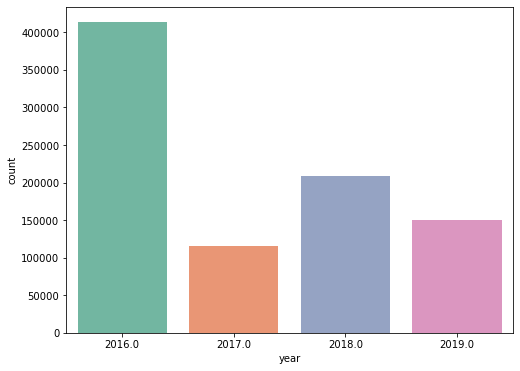

In [46]:
plt.figure(figsize=(8,6))
sns.countplot(df['year'], palette='Set2')

## Feature Engineering

<AxesSubplot:xlabel='count', ylabel='year'>

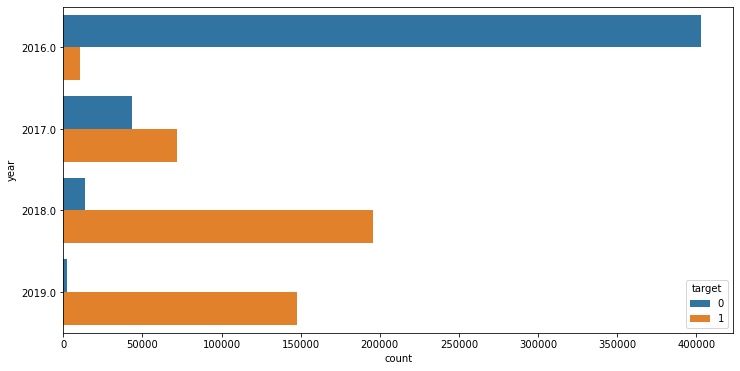

In [47]:
plt.subplots(figsize=(12, 6))
sns.countplot(y="year", hue='target', data=df)

In [48]:
df

,employee_id,gender,year_of_birth,employment_date,leave_date,year,month,marital_status,military_status,title,employment_type,department_code,first_manager_id,second_manager_id,location,education,number_of_children,bonus_date,bonus_amount,timeoff_start_date,timeoff_end_date,timeoff_type,notice_date,target
0,120977,KADIN,1987.0,2014-03-17,2019-08-09,2019.0,5.0,Evli,Tamamlamis,Uzman Yardimcisi ...,Kadrolu ...,IM ...,164330.0,164330.0,Istanbul,On Lisans,0.0,2019-05,14366.0,2017-03-31,2017-04-06,Sağlık Raporu ...,2018-09,1
1,120977,KADIN,1987.0,2014-03-17,2019-08-09,2019.0,5.0,Evli,Tamamlamis,Uzman Yardimcisi ...,Kadrolu ...,IM ...,164330.0,164330.0,Istanbul,On Lisans,0.0,2019-05,14366.0,2019-04-08,2019-04-19,Sağlık Raporu ...,2018-09,1
2,120977,KADIN,1987.0,2014-03-17,2019-08-09,2019.0,5.0,Evli,Tamamlamis,Uzman Yardimcisi ...,Kadrolu ...,IM ...,164330.0,164330.0,Istanbul,On Lisans,0.0,2019-05,14366.0,2017-07-27,2018-04-12,Ücretsiz İzin,2018-09,1
3,120977,KADIN,1987.0,2014-03-17,2019-08-09,2019.0,5.0,Evli,Tamamlamis,Uzman Yardimcisi ...,Kadrolu ...,IM ...,164330.0,164330.0,Istanbul,On Lisans,0.0,2019-05,14366.0,2019-01-09,2019-01-09,Sağlık Raporu ...,2018-09,1
4,120977,KADIN,1987.0,2014-03-17,2019-08-09,2019.0,5.0,Evli,Tamamlamis,Uzman Yardimcisi ...,Kadrolu ...,IM ...,164330.0,164330.0,Istanbul,On Lisans,0.0,2019-05,14366.0,2019-02-02,2019-02-02,Sağlık Raporu ...,2018-09,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
888034,70430,KADIN,1994.0,2019-08-09,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN,0
888035,70424,KADIN,1997.0,2019-08-09,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN,0
888036,70421,KADIN,1994.0,2019-08-09,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN,0
888037,70418,KADIN,1997.0,2019-08-09,NaT,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaT,NaT,NaN,NaN,0


In [49]:
# Hepsinin ilk halini alırsam validasyon için çok az data kalıyor
# son hallerini alırsam train-test için 0 target kalmıyor
# ayrılmayanların son halini alıp, ayrılanların ilk halini alırsam train-test için 0 target kalmıyor
# ayrılanların son halini alıp ayrılmayanların ilk halini alırsam validasyon datasında çok az target 0 kalıyor

In [50]:
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
import math
import warnings
import re

In [51]:
df.isnull().sum()

employee_id                0
gender                     5
year_of_birth              5
employment_date            0
leave_date            462840
year                     367
month                    367
marital_status           367
military_status          367
title                    367
employment_type          367
department_code          367
first_manager_id         398
second_manager_id        398
location                 367
education                367
number_of_children       367
bonus_date              2622
bonus_amount            2622
timeoff_start_date      2184
timeoff_end_date        2184
timeoff_type            2184
notice_date           558398
target                     0
dtype: int64

In [52]:
df.dropna(subset=['gender','year_of_birth'], inplace=True)

In [53]:
df.drop(columns='leave_date', inplace=True)

In [54]:
df.dropna(subset=['year','month', 'marital_status', 'military_status', 'title', 'employment_type','department_code','first_manager_id',
                 'second_manager_id', 'location','education','number_of_children'], inplace=True)

In [55]:
df.bonus_amount.fillna(value=0, inplace=True)

In [56]:
df.bonus_date.fillna(value='0', inplace=True)

In [57]:
df['total_notice']=df['notice_date']

In [58]:
df.total_notice.fillna(value=0, inplace=True)

In [59]:
for i in df.employee_id.unique():
    
    if (df[df["employee_id"]==i].total_notice == 0).any():
        df.loc[df[df["employee_id"]==i].index, 'total_notice']=0
    
    
        
    else:
        df.loc[df[df["employee_id"]==i].index, 'total_notice']=df[df["employee_id"]==i].notice_date.nunique()


In [60]:
df.total_notice.unique()

array([1, 0, 2, 3, 4], dtype=object)

In [61]:
df.drop(columns='notice_date', inplace=True)

In [62]:
df["age"]=df["year"]-df["year_of_birth"]

In [63]:
df.drop(columns='year_of_birth', inplace=True)

In [64]:
df["year_month"]=pd.to_datetime(df['year'].astype(int).astype(str) + '-' + df['month'].astype(int).astype(str), format='%Y-%m')

In [65]:
df["working_months"]=(df['year_month'].dt.year - df['employment_date'].dt.year) * 12 + \
                (df['year_month'].dt.month - df['employment_date'].dt.month)

In [66]:
df.gender.unique()

array(['KADIN', 'ERKEK'], dtype=object)

In [67]:
label_encoder = LabelEncoder()
  
df['gender']= label_encoder.fit_transform(df['gender'])

In [68]:
df.gender.unique()

array([1, 0])

In [69]:
df.marital_status.unique()

array(['Evli', 'Bekar'], dtype=object)

In [70]:
df['marital_status']= label_encoder.fit_transform(df['marital_status'])

In [71]:
df.marital_status.unique()

array([1, 0])

In [72]:
df.military_status.value_counts()

Tecilli       427448
Tamamlamis    396640
Muaf           62909
--               635
Yapmamis           2
Name: military_status, dtype: int64

In [73]:
df.military_status.value_counts().index[3]

'--        '

In [74]:
df.military_status.value_counts().index[0]

'Tecilli   '

In [75]:
df.loc[df['military_status'] == df.military_status.value_counts().index[3], 'military_status'] = df.military_status.value_counts().index[0]

In [76]:
df.loc[df['military_status'] == df.military_status.value_counts().index[3], 'military_status'] = df.military_status.value_counts().index[0]

In [77]:
df.military_status.value_counts()

Tecilli       428085
Tamamlamis    396640
Muaf           62909
Name: military_status, dtype: int64

In [78]:
one_hot = pd.get_dummies(df['military_status'])

In [79]:
df = pd.concat([df, one_hot], axis=1)

In [80]:
df.drop(df[df['title'] == df.title.value_counts().index[8]].index, inplace=True)
df.drop(df[df['title'] == df.title.value_counts().index[8]].index, inplace=True)

In [81]:
df.title.value_counts()

Uzman Yardimcisi                                                                    347180
Uzman                                                                               282949
Asistan                                                                             176303
Dis Kaynak                                                                           29768
Yetkili                                                                              27572
Kursiyer                                                                             13186
Yonetmen                                                                              7353
Yan Hizmetli                                                                          3283
Name: title, dtype: int64

In [82]:
one_hot_title = pd.get_dummies(df['title'])

In [83]:
df = pd.concat([df, one_hot_title], axis=1)

In [84]:
df.employment_type.value_counts()

Kadrolu                                               821435
Is-Kur                                                 36454
Part-Time Kadrolu                                      21973
Dis Kaynak                                              6500
Belirli Sureli Sozlesmeli                               1232
Name: employment_type, dtype: int64

In [85]:
one_hot_emp = pd.get_dummies(df['employment_type'])

In [86]:
df = pd.concat([df, one_hot_emp], axis=1)

In [87]:
df.department_code.value_counts()

TS                                                                    516705
IM                                                                    367846
MS                                                                      3037
OS                                                                         6
Name: department_code, dtype: int64

In [88]:
df.drop(df[df['department_code'] == df.department_code.value_counts().index[3]].index, inplace=True)

In [89]:
df.department_code.value_counts()

TS                                                                    516705
IM                                                                    367846
MS                                                                      3037
Name: department_code, dtype: int64

In [90]:
one_hot_dep = pd.get_dummies(df['department_code'])

In [91]:
df = pd.concat([df, one_hot_dep], axis=1)

In [92]:
df.first_manager_id.unique()

array([164330., 137642., 170900., 174833., 129104., 130145., 114152.,
       126299., 184667., 186845., 116027., 131702., 132068., 107045.,
       130544., 111122., 140093., 130358., 186881., 130949., 130745.,
       131600., 196544., 138746., 196550., 130766.,  84668., 131468.,
       169463., 131729., 194924., 131186., 131516., 181745., 153800.,
       131537., 131945., 131852., 138770., 189551., 132059., 127952.])

In [93]:
df.second_manager_id.unique()

array([164330., 137642., 170900., 174833., 129104., 130145., 114152.,
       126299., 184667., 186845., 116027., 131702., 132068., 107045.,
       130544., 111122., 140093., 130358., 186881., 130949., 130745.,
       131600., 196544., 138746., 196550., 130766.,  84668., 131468.,
       169463., 131729., 194924., 131186., 131516., 181745., 153800.,
       131537., 131945., 131852., 138770., 189551., 132059., 127952.])

In [94]:
frequency_map = df['first_manager_id'].value_counts(normalize=True)

In [95]:
df['first_manager_id'] = df['first_manager_id'].map(frequency_map)

In [96]:
frequency_map_second = df['second_manager_id'].value_counts(normalize=True)

In [97]:
df['second_manager_id'] = df['second_manager_id'].map(frequency_map_second)

In [98]:
df.location.value_counts()

Istanbul    850905
Ankara       35861
Izmir          820
Bursa            2
Name: location, dtype: int64

In [99]:
df.drop(df[df['location'] == df.location.value_counts().index[3]].index, inplace=True)

In [100]:
one_hot_loc = pd.get_dummies(df['location'])

In [101]:
df = pd.concat([df, one_hot_loc], axis=1)

In [102]:
df.education.value_counts()

Lisans           372705
On Lisans        299186
Lise             210490
Yuksek Lisans      5100
BELIRSIZ            104
Ilkogretim            1
Name: education, dtype: int64

In [103]:
df.drop(df[df['education'] == df.education.value_counts().index[5]].index, inplace=True)

In [104]:
df.loc[df['education'] == df.education.value_counts().index[0], 'education_values'] = 3
df.loc[df['education'] == df.education.value_counts().index[1], 'education_values'] = 2
df.loc[df['education'] == df.education.value_counts().index[2], 'education_values'] = 1
df.loc[df['education'] == df.education.value_counts().index[3], 'education_values'] = 4
df.loc[df['education'] == df.education.value_counts().index[4], 'education_values'] = 0

In [105]:
df.drop_duplicates(inplace=True)

In [106]:
df.reset_index(inplace=True)

In [107]:
df.drop(columns='index', inplace=True)

In [108]:
for i in df.employee_id.unique():
    
       df.loc[df[df["employee_id"]==i].index, 'hmt_bonus']=df[df["employee_id"]==i].bonus_date.nunique()

In [109]:
df.sample(5)

,employee_id,gender,employment_date,year,month,marital_status,military_status,title,employment_type,department_code,first_manager_id,second_manager_id,location,education,number_of_children,bonus_date,bonus_amount,timeoff_start_date,timeoff_end_date,timeoff_type,target,total_notice,age,year_month,working_months,Muaf,Tamamlamis,Tecilli,Asistan,Dis Kaynak,Kursiyer,Uzman,Uzman Yardimcisi,Yan Hizmetli,Yetkili,Yonetmen,Belirli Sureli Sozlesmeli,Dis Kaynak,Is-Kur,Kadrolu,Part-Time Kadrolu,IM,MS,TS,Ankara,Istanbul,Izmir,education_values,hmt_bonus
556478,130805,0,2013-07-01,2016.0,1.0,1,Tamamlamis,Uzman ...,Kadrolu ...,TS,0.026906,0.026906,Istanbul,Lisans,0.0,2017-01,1908.13,2019-03-11,2019-03-11,Sağlık Raporu ...,0,0,36.0,2016-01-01,30,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,3.0,44.0
120082,107030,1,2016-05-02,2018.0,11.0,1,Tamamlamis,Uzman Yardimcisi ...,Kadrolu ...,TS,0.040311,0.040311,Istanbul,On Lisans,0.0,2016-11,856.55,2016-09-22,2016-09-26,Yıllık Ücretli İzin ...,1,0,25.0,2018-11-01,30,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,1,0,2.0,29.0
757013,85337,1,2018-03-19,2018.0,3.0,0,Tamamlamis,Kursiyer ...,Is-Kur ...,IM ...,0.143944,0.143944,Ankara,On Lisans,0.0,2019-05,722.00,2018-12-28,2018-12-28,Sağlık Raporu ...,0,1,21.0,2018-03-01,0,0,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,1,0,0,1,0,0,2.0,14.0
527459,130886,0,2013-07-01,2016.0,1.0,1,Tamamlamis,Uzman ...,Kadrolu ...,TS,0.007712,0.007712,Istanbul,Lisans,0.0,2018-05,1216.23,2019-03-26,2019-03-26,Yıllık Ücretli İzin ...,0,0,38.0,2016-01-01,30,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,3.0,44.0
621563,107993,1,2016-03-03,2016.0,3.0,0,Tecilli,Asistan ...,Kadrolu ...,TS,0.063220,0.063220,Istanbul,Lisans,0.0,2019-03,474.04,2019-02-25,2019-02-22,Diğer,0,0,24.0,2016-03-01,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,3.0,36.0


In [110]:
for i in df.employee_id.unique():
    
       df.loc[df[df["employee_id"]==i].index, 'total_bonus']=df[df["employee_id"]==i].bonus_amount.unique().sum()

In [111]:
df.drop(columns=['bonus_date','bonus_amount'], inplace=True)

In [112]:
df.duplicated().sum()

741654

In [113]:
df.drop_duplicates(inplace=True)

In [114]:
df.reset_index(inplace=True)

In [115]:
df.drop(columns='index', inplace=True)

In [116]:
df["hmt_timeoff"]=df["timeoff_start_date"]

In [117]:
df.timeoff_start_date.fillna(value='1997-11-17', inplace=True)
df.timeoff_end_date.fillna(value='1997-11-17', inplace=True)

In [118]:
df['hmt_timeoff'] = pd.to_numeric(pd.to_datetime(df['hmt_timeoff']))

In [119]:
df.loc[df[df["timeoff_start_date"]=='1997-11-17'].index, ['hmt_timeoff']] = 0

In [120]:
for i in df.employee_id.unique():
    
    if df.loc[df[df["employee_id"]==i].index, 'hmt_timeoff'].any()==0:
        df.loc[df[df["employee_id"]==i].index, 'hmt_timeoff']=0
        
    else:
        
        df.loc[df[df["employee_id"]==i].index, 'hmt_timeoff']=df[df["employee_id"]==i].timeoff_start_date.nunique()

In [121]:
df.timeoff_type.fillna(value='izin_yok', inplace=True)

In [122]:
df["total_holiday_day"]=df["timeoff_end_date"]-df["timeoff_start_date"]
df['total_holiday_day'] = df['total_holiday_day'].apply(lambda x: str(x))
df['total_holiday_day'] = df['total_holiday_day'].apply(lambda x: int(re.findall(r'\d+', x)[0]))
df['total_holiday_day']=df['total_holiday_day']+1

In [123]:
df.loc[df[df["hmt_timeoff"]==0].index, ['total_holiday_day']] = 0

In [124]:
df.timeoff_type.value_counts()

Sağlık Raporu                                                             16485
Yıllık Ücretli İzin                                                        8043
Diğer                                                                      1248
Doğum İzni                                                                 1129
izin_yok                                                                    938
1. Derece Akrabanın Ağır Hastalığı Veya Vefatı                              587
İdari İzin                                                                  304
Evlilik İzni                                                                195
Ücretsiz İzin                                                               137
Name: timeoff_type, dtype: int64

In [125]:
one_hot_timeoff = pd.get_dummies(df['timeoff_type'])
df = pd.concat([df, one_hot_timeoff], axis=1)

In [126]:
for i in df.employee_id.unique():
    
    df.loc[df[df["employee_id"]==i].index, 'total_timeoff_day']=df[df["employee_id"]==i].total_holiday_day.sum()

In [127]:
df.drop(columns=['timeoff_start_date','timeoff_end_date', 'total_holiday_day', 'timeoff_type'], inplace=True)

In [128]:
df.duplicated().sum()

23826

In [129]:
df.drop_duplicates(inplace=True)
df.reset_index(inplace=True)
df.drop(columns='index', inplace=True)

In [130]:
df.drop(columns=['employment_date','year_month'], inplace=True)

In [131]:
for i in df.employee_id.unique():
    
    if df.loc[df[df["employee_id"]==i].index, df.columns[44]].any()==1:
        df.loc[df[df["employee_id"]==i].index, df.columns[44]]=1
        
    if df.loc[df[df["employee_id"]==i].index, df.columns[45]].any()==1:
        df.loc[df[df["employee_id"]==i].index, df.columns[45]]=1
        
    if df.loc[df[df["employee_id"]==i].index, df.columns[46]].any()==1:
        df.loc[df[df["employee_id"]==i].index, df.columns[46]]=1
        
    if df.loc[df[df["employee_id"]==i].index, df.columns[47]].any()==1:
        df.loc[df[df["employee_id"]==i].index, df.columns[47]]=1
        
    if df.loc[df[df["employee_id"]==i].index, df.columns[48]].any()==1:
        df.loc[df[df["employee_id"]==i].index, df.columns[48]]=1
        
    if df.loc[df[df["employee_id"]==i].index, df.columns[49]].any()==1:
        df.loc[df[df["employee_id"]==i].index, df.columns[49]]=1
        
    if df.loc[df[df["employee_id"]==i].index, df.columns[50]].any()==1:
        df.loc[df[df["employee_id"]==i].index, df.columns[50]]=1
        
    if df.loc[df[df["employee_id"]==i].index, df.columns[51]].any()==1:
        df.loc[df[df["employee_id"]==i].index, df.columns[51]]=1
        
    if df.loc[df[df["employee_id"]==i].index, df.columns[52]].any()==1:
        df.loc[df[df["employee_id"]==i].index, df.columns[52]]=1

In [132]:
df.duplicated().sum()

2489

In [133]:
df.drop_duplicates(inplace=True)
df.reset_index(inplace=True)
df.drop(columns='index', inplace=True)

In [134]:
scaler = MinMaxScaler()
df['age_normalized'] = scaler.fit_transform(df[['age']])

In [135]:
df['working_months_normalized'] = scaler.fit_transform(df[['working_months']])

In [136]:
df.loc[df[df["total_bonus"]==0].index, ['hmt_bonus']] = 0

In [137]:
df['hmt_bonus_normalized'] = scaler.fit_transform(df[['hmt_bonus']])
df['total_bonus_normalized'] = scaler.fit_transform(df[['total_bonus']])

In [138]:
df['hmt_timeoff_normalized'] = scaler.fit_transform(df[['hmt_timeoff']])

In [139]:
df['total_timeoff_day_normalized'] = scaler.fit_transform(df[['total_timeoff_day']])

In [140]:
df_train = df[df["year"]<2019]
df_valid = df[df["year"]>2018]

In [141]:
df_train.sample(5)

,employee_id,gender,year,month,marital_status,military_status,title,employment_type,department_code,first_manager_id,second_manager_id,location,education,number_of_children,target,total_notice,age,working_months,Muaf,Tamamlamis,Tecilli,Asistan,Dis Kaynak,Kursiyer,Uzman,Uzman Yardimcisi,Yan Hizmetli,Yetkili,Yonetmen,Belirli Sureli Sozlesmeli,Dis Kaynak,Is-Kur,Kadrolu,Part-Time Kadrolu,IM,MS,TS,Ankara,Istanbul,Izmir,education_values,hmt_bonus,total_bonus,hmt_timeoff,1. Derece Akrabanın Ağır Hastalığı Veya Vefatı,Diğer,Doğum İzni,Evlilik İzni,Sağlık Raporu,Yıllık Ücretli İzin,izin_yok,Ücretsiz İzin,İdari İzin,total_timeoff_day,age_normalized,working_months_normalized,hmt_bonus_normalized,total_bonus_normalized,hmt_timeoff_normalized,total_timeoff_day_normalized
1849,134573,1,2016.0,1.0,0,Tamamlamis,Uzman ...,Kadrolu ...,TS,0.143944,0.143944,Istanbul,Lisans,0.0,0,0,27.0,33,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,3.0,0.0,0.00,12,0,0,0,0,1,1,0,0,0,99.0,0.236842,0.176471,0.000000,0.000000,0.055814,0.102062
1269,106937,0,2017.0,9.0,0,Tecilli,Uzman Yardimcisi ...,Kadrolu ...,IM ...,0.141598,0.141598,Istanbul,On Lisans,2.0,1,0,25.0,16,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,1,0,2.0,18.0,9425.06,8,0,0,0,0,1,1,0,0,0,23.0,0.184211,0.085561,0.409091,0.066886,0.037209,0.023711
1896,129026,1,2016.0,1.0,0,Tamamlamis,Uzman ...,Kadrolu ...,TS,0.002355,0.002355,Istanbul,Lisans,0.0,0,0,28.0,30,0,1,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,3.0,1.0,1506.20,14,0,0,0,0,0,1,0,0,1,78.0,0.263158,0.160428,0.022727,0.010689,0.065116,0.080412
1358,130928,1,2017.0,7.0,1,Tamamlamis,Yetkili ...,Kadrolu ...,TS,0.007712,0.007712,Istanbul,Yuksek Lisans,0.0,1,0,36.0,48,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,0,0,1,0,1,0,4.0,0.0,0.00,13,0,1,1,1,1,1,0,0,0,199.0,0.473684,0.256684,0.000000,0.000000,0.060465,0.205155
2195,88223,1,2017.0,11.0,0,Tecilli,Kursiyer ...,Is-Kur ...,TS,0.054463,0.054463,Istanbul,On Lisans,0.0,0,0,24.0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,1,0,1,0,2.0,21.0,16002.44,9,0,1,0,0,1,1,0,0,0,20.0,0.157895,0.000000,0.477273,0.113563,0.041860,0.020619


In [142]:
df_valid.sample(5)

,employee_id,gender,year,month,marital_status,military_status,title,employment_type,department_code,first_manager_id,second_manager_id,location,education,number_of_children,target,total_notice,age,working_months,Muaf,Tamamlamis,Tecilli,Asistan,Dis Kaynak,Kursiyer,Uzman,Uzman Yardimcisi,Yan Hizmetli,Yetkili,Yonetmen,Belirli Sureli Sozlesmeli,Dis Kaynak,Is-Kur,Kadrolu,Part-Time Kadrolu,IM,MS,TS,Ankara,Istanbul,Izmir,education_values,hmt_bonus,total_bonus,hmt_timeoff,1. Derece Akrabanın Ağır Hastalığı Veya Vefatı,Diğer,Doğum İzni,Evlilik İzni,Sağlık Raporu,Yıllık Ücretli İzin,izin_yok,Ücretsiz İzin,İdari İzin,total_timeoff_day,age_normalized,working_months_normalized,hmt_bonus_normalized,total_bonus_normalized,hmt_timeoff_normalized,total_timeoff_day_normalized
99,106091,1,2019.0,5.0,1,Tecilli,Uzman Yardimcisi ...,Kadrolu ...,TS,0.026906,0.026906,Istanbul,On Lisans,0.0,1,1,26.0,35,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,1,0,1,0,2.0,38.0,46793.17,19,1,1,0,1,1,1,0,0,0,74.0,0.210526,0.187166,0.863636,0.332074,0.088372,0.076289
2507,74939,1,2019.0,3.0,0,Tecilli,Asistan ...,Kadrolu ...,IM ...,0.143944,0.143944,Istanbul,Lisans,0.0,0,0,25.0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,1,0,1,0,0,0,1,0,3.0,6.0,1573.91,1,0,0,0,0,1,0,0,0,0,1.0,0.184211,0.000000,0.136364,0.011169,0.004651,0.001031
298,82907,1,2019.0,4.0,0,Muaf,Dis Kaynak ...,Dis Kaynak ...,TS,0.010957,0.010957,Istanbul,On Lisans,0.0,1,0,23.0,11,1,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,2.0,0.0,0.00,0,0,0,0,0,0,0,1,0,0,0.0,0.131579,0.058824,0.000000,0.000000,0.000000,0.000000
254,75236,1,2019.0,4.0,0,Tecilli,Dis Kaynak ...,Dis Kaynak ...,TS,0.010957,0.010957,Istanbul,On Lisans,0.0,1,0,25.0,2,0,0,1,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,2.0,0.0,0.00,0,0,0,0,0,0,0,1,0,0,0.0,0.184211,0.010695,0.000000,0.000000,0.000000,0.000000
350,94586,1,2019.0,3.0,0,Tamamlamis,Dis Kaynak ...,Dis Kaynak ...,TS,0.010957,0.010957,Istanbul,BELIRSIZ,0.0,1,0,24.0,23,0,1,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0.0,0.0,0.00,0,0,0,0,0,0,0,1,0,0,0.0,0.157895,0.122995,0.000000,0.000000,0.000000,0.000000


## Visualization

In [143]:
df_train.describe().T

,count,mean,std,min,25%,50%,75%,max
employee_id,1939.0,102662.549252,19666.647091,76400.000000,87681.500000,102107.000000,114182.000000,189287.000000
gender,1939.0,0.727179,0.445525,0.000000,0.000000,1.000000,1.000000,1.000000
year,1939.0,2017.131511,0.855826,2016.000000,2016.000000,2017.000000,2018.000000,2018.000000
month,1939.0,6.411037,3.809946,1.000000,3.000000,7.000000,10.000000,12.000000
marital_status,1939.0,0.175348,0.380363,0.000000,0.000000,0.000000,0.000000,1.000000
first_manager_id,1939.0,0.078534,0.057448,0.000001,0.011392,0.077828,0.143944,0.143944
second_manager_id,1939.0,0.078534,0.057448,0.000001,0.011392,0.077828,0.143944,0.143944
number_of_children,1939.0,0.055699,0.398646,0.000000,0.000000,0.000000,0.000000,5.000000
target,1939.0,0.595668,0.490889,0.000000,0.000000,1.000000,1.000000,1.000000
age,1939.0,25.579165,4.096526,18.000000,23.000000,25.000000,27.000000,56.000000


**TARGET**

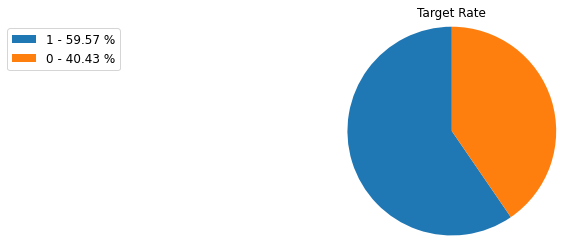

In [144]:
plt.title("Target Rate")
x = np.array(list(df_train["target"].value_counts().index))
y = np.array(df_train["target"].value_counts())
percent = 100.*y/y.sum()

patches, texts = plt.pie(y,startangle=90, radius=1.2)
labels = ['{0} - {1:1.2f} %'.format(i,j) for i,j in zip(x, percent)]

sort_legend = True
if sort_legend:
    patches, labels, dummy =  zip(*sorted(zip(patches, labels, y),
                                          key=lambda x: x[2],
                                          reverse=True))

plt.legend(patches, labels, loc='upper right', bbox_to_anchor=(-1, 1.),
           fontsize=12)
plt.show()

**Year**

<AxesSubplot:xlabel='count', ylabel='year'>

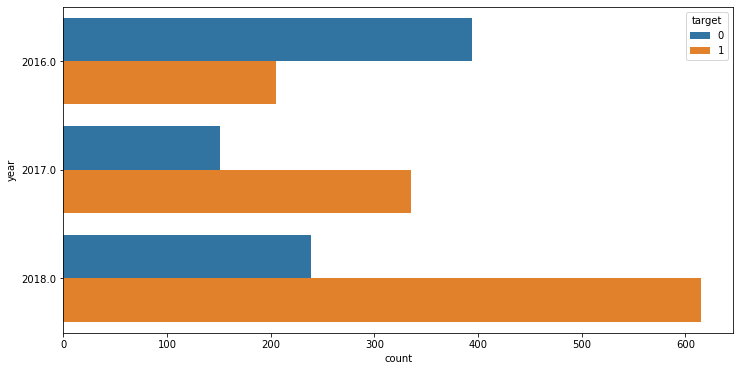

In [145]:
plt.subplots(figsize=(12, 6))
sns.countplot(y="year", hue='target', data=df_train)

**Gender and Age**

**Genç kişiler ayrılmaya daha mı meyillidir?**

In [146]:
df_train.hvplot.scatter(
               x="age",
               y="gender",
               by="target",
               width=800, height=400,
               size=50, alpha=0.5,
               xlabel="Age",
               ylabel="Gender",
               title="Yaş ve Cinsiyete Göre Ayrılma Durumu")

C:\Users\Mehmet\anaconda3\lib\site-packages\holoviews\core\data\pandas.py:222: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  data = [(k, group_type(v, **group_kwargs)) for k, v in


:NdOverlay   [target]
   :Scatter   [age]   (gender)

**Marital Status**

Text(0.5, 1.0, 'Medeni Durum ve Ayrılma Dağılımı')

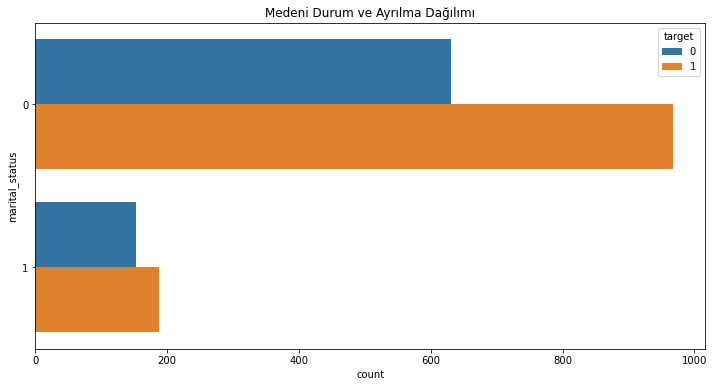

In [147]:
plt.subplots(figsize=(12, 6))
sns.countplot(y="marital_status", hue='target', data=df_train).set_title("Medeni Durum ve Ayrılma Dağılımı")

**Military Status**

Text(0.5, 1.0, 'Askerlik Durumu ve Ayrılma Dağılımı')

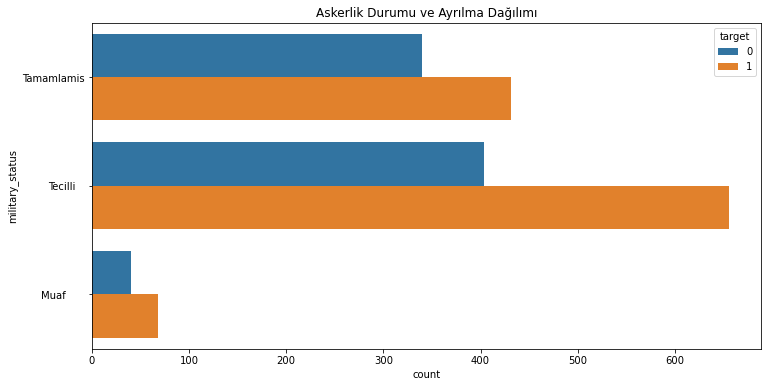

In [148]:
plt.subplots(figsize=(12, 6))
sns.countplot(y="military_status", hue='target', data=df_train).set_title('Askerlik Durumu ve Ayrılma Dağılımı')

**Title**

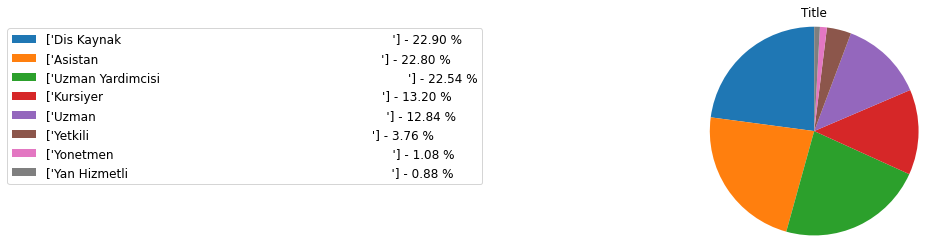

In [149]:
plt.title("Title")
x = np.array(list(df_train[['title']].value_counts().index))
y = np.array(list(df_train[['title']].value_counts()))
percent = 100.*y/y.sum()

patches, texts = plt.pie(y,startangle=90, radius=1.2)
labels = ['{0} - {1:1.2f} %'.format(i,j) for i,j in zip(x, percent)]

sort_legend = True
if sort_legend:
    patches, labels, dummy =  zip(*sorted(zip(patches, labels, y),
                                          key=lambda x: x[2],
                                          reverse=True))

plt.legend(patches, labels, loc='upper right', bbox_to_anchor=(-1, 1.),
           fontsize=12)
plt.show()

**Uzman, uzman yardımcısı ve dış kaynak rolünde çalışan kişiler ayrılmaya daha mı meyillidir?**

Text(0.5, 1.0, 'Çalışan Rolü ve Ayrılma Dağılımı')

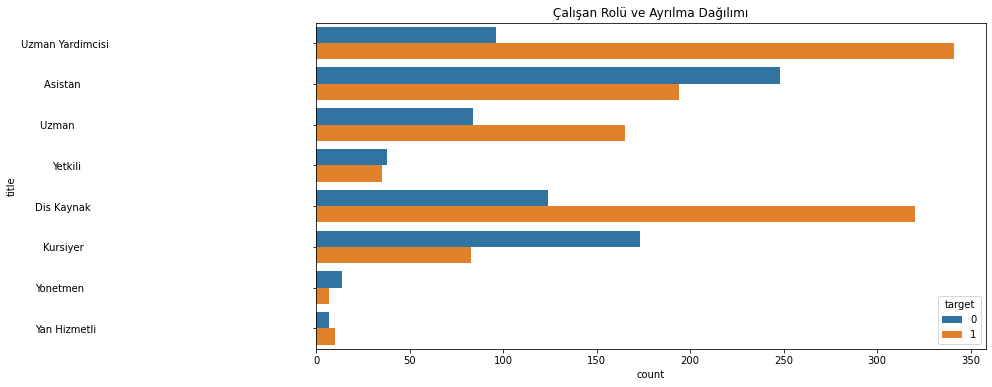

In [150]:
plt.subplots(figsize=(12, 6))
sns.countplot(y="title", hue='target', data=df_train).set_title('Çalışan Rolü ve Ayrılma Dağılımı')

**Employment Type**

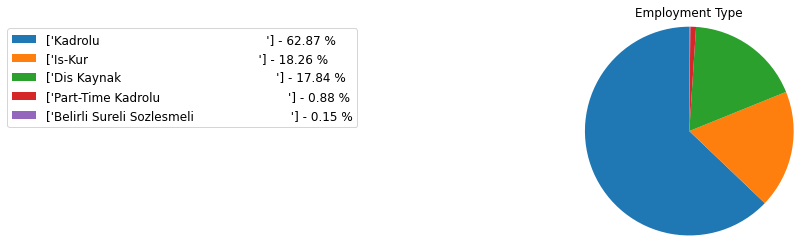

In [151]:
plt.title("Employment Type")
x = np.array(list(df_train[['employment_type']].value_counts().index))
y = np.array(list(df_train[['employment_type']].value_counts()))
percent = 100.*y/y.sum()

patches, texts = plt.pie(y,startangle=90, radius=1.2)
labels = ['{0} - {1:1.2f} %'.format(i,j) for i,j in zip(x, percent)]

sort_legend = True
if sort_legend:
    patches, labels, dummy =  zip(*sorted(zip(patches, labels, y),
                                          key=lambda x: x[2],
                                          reverse=True))

plt.legend(patches, labels, loc='upper right', bbox_to_anchor=(-1, 1.),
           fontsize=12)
plt.show()

**İstihdam tipi dış kaynak olan kişiler ayrılmaya daha mı meyillidir?**

Text(0.5, 1.0, 'İstihdam Tipi ve Ayrılma Dağılımı')

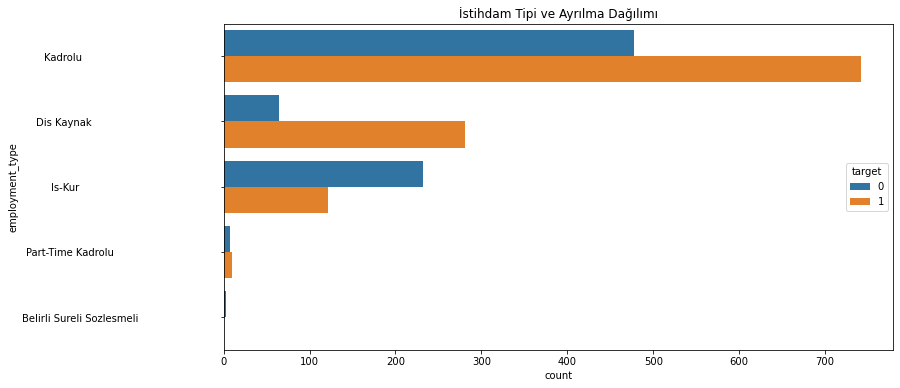

In [152]:
plt.subplots(figsize=(12, 6))
sns.countplot(y="employment_type", hue='target', data=df_train).set_title('İstihdam Tipi ve Ayrılma Dağılımı')

**Department**

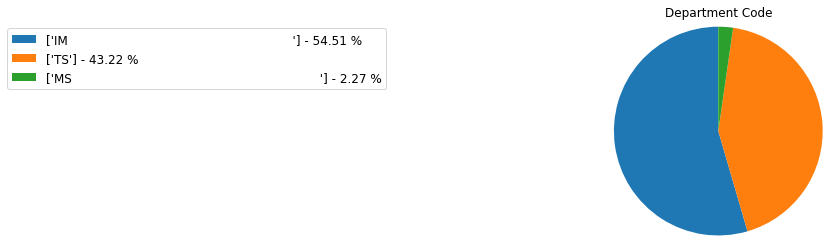

In [153]:
plt.title("Department Code")
x = np.array(list(df_train[['department_code']].value_counts().index))
y = np.array(list(df_train[['department_code']].value_counts()))
percent = 100.*y/y.sum()

patches, texts = plt.pie(y,startangle=90, radius=1.2)
labels = ['{0} - {1:1.2f} %'.format(i,j) for i,j in zip(x, percent)]

sort_legend = True
if sort_legend:
    patches, labels, dummy =  zip(*sorted(zip(patches, labels, y),
                                          key=lambda x: x[2],
                                          reverse=True))

plt.legend(patches, labels, loc='upper right', bbox_to_anchor=(-1, 1.),
           fontsize=12)
plt.show()

**MS kodlu departmanda çalışan kişiler ayrılmaya daha mı meyillidir?**

Text(0.5, 1.0, 'Departman Türüne Göre ve Ayrılma Dağılımı')

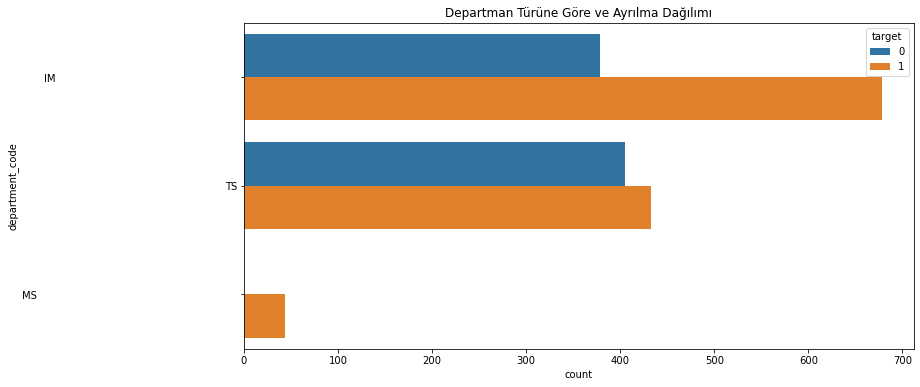

In [154]:
plt.subplots(figsize=(12, 6))
sns.countplot(y="department_code", hue='target', data=df_train).set_title('Departman Türüne Göre ve Ayrılma Dağılımı')

**Location**

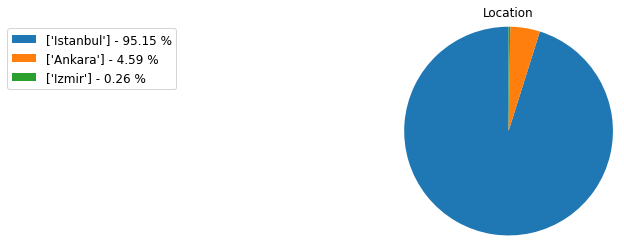

In [155]:
plt.title("Location")
x = np.array(list(df_train[['location']].value_counts().index))
y = np.array(list(df_train[['location']].value_counts()))
percent = 100.*y/y.sum()

patches, texts = plt.pie(y,startangle=90, radius=1.2)
labels = ['{0} - {1:1.2f} %'.format(i,j) for i,j in zip(x, percent)]

sort_legend = True
if sort_legend:
    patches, labels, dummy =  zip(*sorted(zip(patches, labels, y),
                                          key=lambda x: x[2],
                                          reverse=True))

plt.legend(patches, labels, loc='upper right', bbox_to_anchor=(-1, 1.),
           fontsize=12)
plt.show()

Text(0.5, 1.0, 'Şehire Göre Ayrılma Dağılımı')

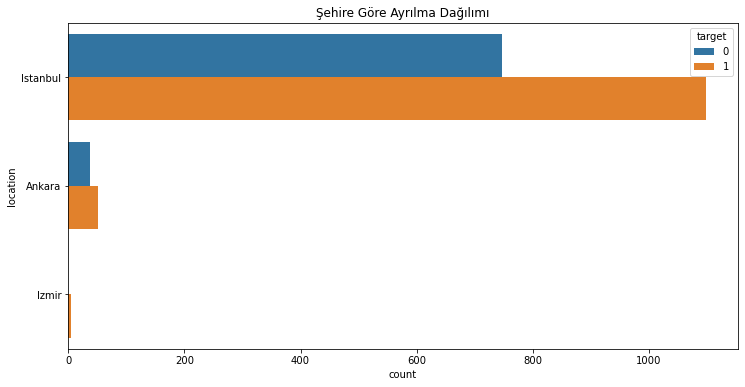

In [156]:
plt.subplots(figsize=(12, 6))
sns.countplot(y="location", hue='target', data=df_train).set_title('Şehire Göre Ayrılma Dağılımı')

**Education**

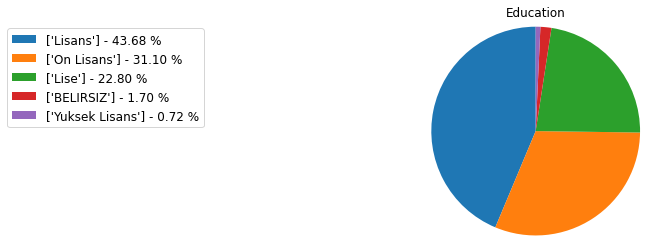

In [157]:
plt.title("Education")
x = np.array(list(df_train[['education']].value_counts().index))
y = np.array(list(df_train[['education']].value_counts()))
percent = 100.*y/y.sum()

patches, texts = plt.pie(y,startangle=90, radius=1.2)
labels = ['{0} - {1:1.2f} %'.format(i,j) for i,j in zip(x, percent)]

sort_legend = True
if sort_legend:
    patches, labels, dummy =  zip(*sorted(zip(patches, labels, y),
                                          key=lambda x: x[2],
                                          reverse=True))

plt.legend(patches, labels, loc='upper right', bbox_to_anchor=(-1, 1.),
           fontsize=12)
plt.show()

Text(0.5, 1.0, 'Eğitim Seviyesine Göre Ayrılma Dağılımı')

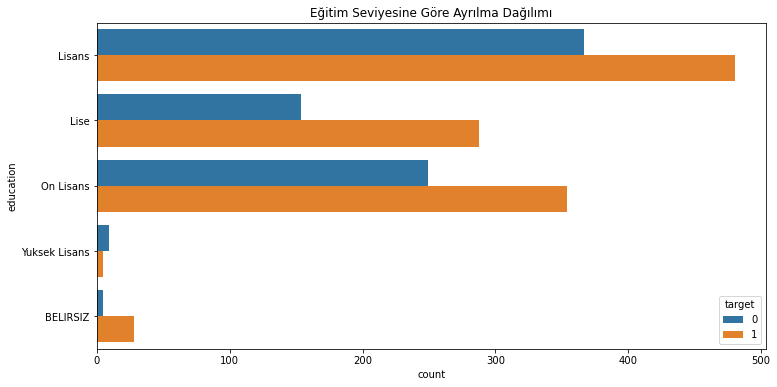

In [158]:
plt.subplots(figsize=(12, 6))
sns.countplot(y="education", hue='target', data=df_train).set_title('Eğitim Seviyesine Göre Ayrılma Dağılımı')

**Children**

Text(0.5, 1.0, 'Çocuk Sayısına Göre Ayrılma Dağılımı')

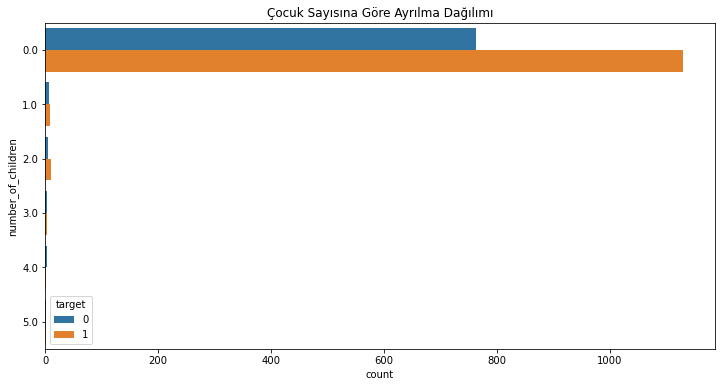

In [159]:
plt.subplots(figsize=(12, 6))
sns.countplot(y="number_of_children", hue='target', data=df_train).set_title('Çocuk Sayısına Göre Ayrılma Dağılımı')

**Notice**

Text(0.5, 1.0, 'Uyarı Sayısı ve Ayrılma Dağılımı')

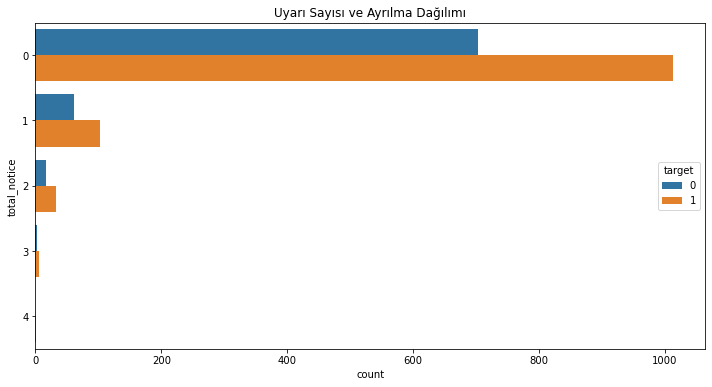

In [160]:
plt.subplots(figsize=(12, 6))
sns.countplot(y="total_notice", hue='target', data=df_train).set_title('Uyarı Sayısı ve Ayrılma Dağılımı')

**Working Months**

**Mevcut işinde deneyim süresi fazla olan kişiler ayrılmaya daha mı meyillidir?**

In [161]:
df_train.hvplot.scatter(
               x="working_months",
               y="gender",
               by="target",
               width=800, height=400,
               size=50, alpha=0.5,
               xlabel="Working Months",
               ylabel="Gender",
               title="Deneyim ve Cinsiyete Göre Ayrılma Durumu")

C:\Users\Mehmet\anaconda3\lib\site-packages\holoviews\core\data\pandas.py:222: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  data = [(k, group_type(v, **group_kwargs)) for k, v in


:NdOverlay   [target]
   :Scatter   [working_months]   (gender)

**Bonus**

**Aldığı bonus sayısı veya miktarı az olan kişiler ayrılmaya daha mı meyillidir?**

In [162]:
df_train.hvplot.scatter(
               x="hmt_bonus",
               y="gender",
               by="target",
               width=800, height=400,
               size=50, alpha=0.5,
               xlabel="Bonus Number",
               ylabel="Gender",
               title="Bonus Sayısı ve Cinsiyete Göre Ayrılma Durumu")

C:\Users\Mehmet\anaconda3\lib\site-packages\holoviews\core\data\pandas.py:222: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  data = [(k, group_type(v, **group_kwargs)) for k, v in


:NdOverlay   [target]
   :Scatter   [hmt_bonus]   (gender)

In [163]:
df_train.hvplot.scatter(
               x="total_bonus",
               y="gender",
               by="target",
               width=800, height=400,
               size=50, alpha=0.5,
               xlabel="Total Bonus",
               ylabel="Gender",
               title="Toplam Bonus ve Cinsiyete Göre Ayrılma Durumu")

C:\Users\Mehmet\anaconda3\lib\site-packages\holoviews\core\data\pandas.py:222: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  data = [(k, group_type(v, **group_kwargs)) for k, v in


:NdOverlay   [target]
   :Scatter   [total_bonus]   (gender)

**Timeoff**

**İzin sayısı veya günü az olan kişiler ayrılmaya daha mı meyillidir?**

In [164]:
df_train.hvplot.scatter(
               x="hmt_timeoff",
               y="gender",
               by="target",
               width=800, height=400,
               size=50, alpha=0.5,
               xlabel="Timeoff Number",
               ylabel="Gender",
               title="İzin Sayısı ve Cinsiyete Göre Ayrılma Durumu")

C:\Users\Mehmet\anaconda3\lib\site-packages\holoviews\core\data\pandas.py:222: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  data = [(k, group_type(v, **group_kwargs)) for k, v in


:NdOverlay   [target]
   :Scatter   [hmt_timeoff]   (gender)

In [165]:
df_train.hvplot.scatter(
               x="total_timeoff_day",
               y="gender",
               by="target",
               width=800, height=400,
               size=50, alpha=0.5,
               xlabel="Timeoff Day",
               ylabel="Gender",
               title="İzin Günü ve Cinsiyete Göre Ayrılma Durumu")

C:\Users\Mehmet\anaconda3\lib\site-packages\holoviews\core\data\pandas.py:222: FutureWarning: In a future version of pandas, a length 1 tuple will be returned when iterating over a groupby with a grouper equal to a list of length 1. Don't supply a list with a single grouper to avoid this warning.
  data = [(k, group_type(v, **group_kwargs)) for k, v in


:NdOverlay   [target]
   :Scatter   [total_timeoff_day]   (gender)

## Statistical Analysis

***İstatistikte Ki-Kare testi kategorik değişkenler arasındaki ilişkiyi test etmek için kullanılır. <br> T testi ise iki grup ortalaması arasındaki farkın istatistiksel anlamlılığını test etmek için kullanılır.***

***İki grup t testini uygulamamız için 2 varsayımın sağlanması gerekiyor. Birincisi grupların normal dağılması ikincisi ise grupların varyanslarının eşit olması. Normallik için Shapiro-Wilk, varyans için Levene testi uygulanabilir.***

***Varsayımların sağlanmadığı İki Grup T testinin non-parametrik karşılığı olan Mann-Whitney U testini kullanabiliriz.***

**SORULAR** <br>
1-)  Genç kişiler ayrılmaya daha mı meyillidir? <br>
2-)  Uzman, uzman yardımcısı ve dış kaynak rolünde çalışan kişiler ayrılmaya daha mı meyillidir? <br>
3-)  İstihdam tipi dış kaynak olan kişiler ayrılmaya daha mı meyillidir? <br>
4-)  MS kodlu departmanda çalışan kişiler ayrılmaya daha mı meyillidir? <br>
5-)  Mevcut işinde deneyim süresi fazla olan kişiler ayrılmaya daha mı meyillidir? <br>
6-)  Aldığı bonus sayısı veya miktarı az olan kişiler ayrılmaya daha mı meyillidir? <br>
7-)  İzin sayısı veya günü az olan kişiler ayrılmaya daha mı meyillidir? <br>

***Testlerimizi 0.05 anlamlılık düzeyinde gerçekleştireceğiz.***

In [166]:
alpha=0.05

***1.SORU***

In [167]:
df_train.groupby("target").mean()

C:\Users\Mehmet\AppData\Local\Temp\ipykernel_19120\625644793.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_train.groupby("target").mean()


,employee_id,gender,year,month,marital_status,first_manager_id,second_manager_id,number_of_children,age,working_months,Muaf,Tamamlamis,Tecilli,Asistan,Dis Kaynak,Kursiyer,Uzman,Uzman Yardimcisi,Yan Hizmetli,Yetkili,Yonetmen,Belirli Sureli Sozlesmeli,Dis Kaynak,Is-Kur,Kadrolu,Part-Time Kadrolu,IM,MS,TS,Ankara,Istanbul,Izmir,education_values,hmt_bonus,total_bonus,hmt_timeoff,1. Derece Akrabanın Ağır Hastalığı Veya Vefatı,Diğer,Doğum İzni,Evlilik İzni,Sağlık Raporu,Yıllık Ücretli İzin,izin_yok,Ücretsiz İzin,İdari İzin,total_timeoff_day,age_normalized,working_months_normalized,hmt_bonus_normalized,total_bonus_normalized,hmt_timeoff_normalized,total_timeoff_day_normalized
target,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,102453.105867,0.744898,2016.802296,5.256378,0.195153,0.078285,0.078285,0.066327,25.397959,9.271684,0.051020,0.433673,0.515306,0.316327,0.158163,0.220663,0.107143,0.122449,0.008929,0.048469,0.017857,0.003827,0.082908,0.295918,0.608418,0.008929,0.483418,0.000000,0.516582,0.047194,0.952806,0.000000,2.281888,23.987245,25021.524783,17.228316,0.225765,0.205357,0.085459,0.096939,0.860969,0.808673,0.065051,0.099490,0.151786,93.988520,0.194683,0.049581,0.545165,0.177569,0.080132,0.096895
1,102804.716883,0.715152,2017.354978,7.194805,0.161905,0.078702,0.078702,0.048485,25.702165,17.987879,0.058874,0.373160,0.567965,0.167965,0.277056,0.071861,0.142857,0.295238,0.008658,0.030303,0.006061,0.000000,0.243290,0.105628,0.642424,0.008658,0.587013,0.038095,0.374892,0.045022,0.950649,0.004329,2.126407,8.949784,7969.544320,9.484848,0.099567,0.114286,0.033766,0.077922,0.560173,0.450216,0.400000,0.036364,0.047619,39.724675,0.202689,0.096192,0.203404,0.056557,0.044116,0.040953


In [168]:
G1 = df_train[df_train["target"]==1].age
G0 = df_train[df_train["target"]==0].age

<d><i>G1</i>: İşten ayrılanların yaşları. <br>
<d><i>G0</i>: İşten ayrılmayanların yaşları.

**Hipotez:**

<d><i>H</i>:  <d><i>G1</i>'in dağılımı ile normal dağılım arasında fark yoktur.<br>
<d><i>H</i>:  <d><i>G1</i>'in dağılımı ile normal dağılım arasında fark vardır.

In [169]:
name = ['normality test', 'p-value']
test = shapiro(G1)
 
print(test, "\n") 
 
if test[1] < alpha:
    print("Sıfır hipotezini reddederiz. G1'in normal dağılmadığını söylemek için elimizde yeterli kanıt vardır.")
 
else:
    print("Sıfır hipotezini reddedemeyiz. G1'in normal dağılmadığını söylemek için elimizde yeterli kanıt yoktur.")

ShapiroResult(statistic=0.8956699371337891, pvalue=2.7955420106884934e-27) 

Sıfır hipotezini reddederiz. G1'in normal dağılmadığını söylemek için elimizde yeterli kanıt vardır.


In [170]:
G11 = df[df["target"]==1].age
G00 = df[df["target"]==0].age

<d><i>μ</i><sub>0</sub>: <d><i>işten ayrılmayan kişilerin yaşları</i> <br>
<d><i>μ</i><sub>1</sub>: <d><i>işten ayrılan kişilerin yaşları</i>

**Hipotez:** <br>
<d><i>H</i><sub>0</sub>: <d><i>μ</i><sub>0</sub>=<d><i>μ</i><sub>1</sub> <br>
<d><i>H</i><sub>1</sub>: <d><i>μ</i><sub>0</sub>><d><i>μ</i><sub>1</sub>

In [171]:
name = ['Mann Whitney-U', 'p-value']
test = mannwhitneyu(G11, G00)
 
print("p-value: %.3f" % test[1], "\n") 
 
if test[1] < alpha:
    print("Sıfır hipotezini reddederiz. μo ve μ1'in eşit olduğunu söylemek için elimizde yeterli kanıt yoktur. İşten ayrılan kişilerin yaşlarının "
           "ortalaması ile işten ayrılmayan kişilerin yaşlarının ortalaması arasında anlamlı bir fark vardır. Genç olan kişiler işten ayrılmaya "
          "daha meyillidir")
 
else:
    print("Sıfır hipotezini reddedemeyiz. μo ve μ1'in eşit olduğunu söylemek için elimizde yeterli kanıt vadır. İşten ayrılan kişilerin yaşlarının "
           "ortalaması ile işten ayrılmayan kişilerin yaşlarının ortalaması arasında anlamlı bir farklılık yoktur")

p-value: 0.001 

Sıfır hipotezini reddederiz. μo ve μ1'in eşit olduğunu söylemek için elimizde yeterli kanıt yoktur. İşten ayrılan kişilerin yaşlarının ortalaması ile işten ayrılmayan kişilerin yaşlarının ortalaması arasında anlamlı bir fark vardır. Genç olan kişiler işten ayrılmaya daha meyillidir


***2.SORU***

In [172]:
ki_test = df_train.copy()

In [173]:
for i in ki_test.employee_id.unique():
    
    ki_test.loc[ki_test[(ki_test["employee_id"]==i) & (ki_test["title"]==df_train.title.value_counts().index[0])].index, 'title_test']='A'
    ki_test.loc[ki_test[(ki_test["employee_id"]==i) & (ki_test["title"]==df_train.title.value_counts().index[2])].index, 'title_test']='A'
    ki_test.loc[ki_test[(ki_test["employee_id"]==i) & (ki_test["title"]==df_train.title.value_counts().index[4])].index, 'title_test']='A'
    ki_test.loc[ki_test[(ki_test["employee_id"]==i) & (ki_test["title"]==df_train.title.value_counts().index[1])].index, 'title_test']='B'
    ki_test.loc[ki_test[(ki_test["employee_id"]==i) & (ki_test["title"]==df_train.title.value_counts().index[3])].index, 'title_test']='B'
    ki_test.loc[ki_test[(ki_test["employee_id"]==i) & (ki_test["title"]==df_train.title.value_counts().index[5])].index, 'title_test']='B'
    ki_test.loc[ki_test[(ki_test["employee_id"]==i) & (ki_test["title"]==df_train.title.value_counts().index[6])].index, 'title_test']='B'
    ki_test.loc[ki_test[(ki_test["employee_id"]==i) & (ki_test["title"]==df_train.title.value_counts().index[7])].index, 'title_test']='B'
        

In [174]:
ki_test.groupby("title_test").mean()

C:\Users\Mehmet\AppData\Local\Temp\ipykernel_19120\1752049932.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  ki_test.groupby("title_test").mean()


,employee_id,gender,year,month,marital_status,first_manager_id,second_manager_id,number_of_children,target,age,working_months,Muaf,Tamamlamis,Tecilli,Asistan,Dis Kaynak,Kursiyer,Uzman,Uzman Yardimcisi,Yan Hizmetli,Yetkili,Yonetmen,Belirli Sureli Sozlesmeli,Dis Kaynak,Is-Kur,Kadrolu,Part-Time Kadrolu,IM,MS,TS,Ankara,Istanbul,Izmir,education_values,hmt_bonus,total_bonus,hmt_timeoff,1. Derece Akrabanın Ağır Hastalığı Veya Vefatı,Diğer,Doğum İzni,Evlilik İzni,Sağlık Raporu,Yıllık Ücretli İzin,izin_yok,Ücretsiz İzin,İdari İzin,total_timeoff_day,age_normalized,working_months_normalized,hmt_bonus_normalized,total_bonus_normalized,hmt_timeoff_normalized,total_timeoff_day_normalized
title_test,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
A,105981.311504,0.747788,2017.135398,6.011504,0.204425,0.064725,0.064725,0.048673,0.730973,25.945133,18.183186,0.056637,0.423009,0.520354,0.000000,0.39292,0.00000,0.220354,0.386726,0.000000,0.000000,0.000000,0.000000,0.306195,0.086726,0.607080,0.000000,0.485841,0.027434,0.486726,0.034513,0.961062,0.004425,2.071681,15.023894,15152.923496,14.663717,0.173451,0.162832,0.065487,0.100000,0.640708,0.621239,0.316814,0.076106,0.096460,71.995575,0.209082,0.097236,0.341452,0.107535,0.068203,0.074222
B,98026.948084,0.698393,2017.126082,6.969098,0.134734,0.097822,0.097822,0.065513,0.406675,25.067985,9.268232,0.054388,0.362176,0.583436,0.546354,0.00000,0.31644,0.000000,0.000000,0.021014,0.090235,0.025958,0.003708,0.000000,0.316440,0.658838,0.021014,0.627936,0.016069,0.355995,0.061805,0.938195,0.000000,2.353523,15.038319,14460.933956,9.755253,0.118665,0.134734,0.039555,0.065513,0.739184,0.558714,0.191595,0.042027,0.080346,47.236094,0.186000,0.049563,0.341780,0.102624,0.045373,0.048697


In [175]:
observed=pd.crosstab(index=ki_test["target"], columns=ki_test["title_test"])
test_result, p_value_title, ser_der, expected=chi2_contingency(observed)

In [176]:
if p_value_title<alpha:
    print("p-value:", p_value_title,"\n\nSıfır hipotezini reddederiz.  Uzman, uzman yardımcısı ve dış kaynak rolündeki kişiler diğer kişilere göre \
    ayrılmaya daha meyillidirler.")
else:
    print("Sıfır hipotezini reddedemeyiz. Title işten ayrılmada önemli bir faktör değildir.")

p-value: 2.147311476053445e-46 

Sıfır hipotezini reddederiz.  Uzman, uzman yardımcısı ve dış kaynak rolündeki kişiler diğer kişilere göre     ayrılmaya daha meyillidirler.


***3.SORU***

In [177]:
for i in ki_test.employee_id.unique():
    
    ki_test.loc[ki_test[(ki_test["employee_id"]==i) & (ki_test["employment_type"]==df_train.employment_type.value_counts().index[2])].index, 'test']='A'
    ki_test.loc[ki_test[(ki_test["employee_id"]==i) & (ki_test["employment_type"]==df_train.employment_type.value_counts().index[0])].index, 'test']='B'
    ki_test.loc[ki_test[(ki_test["employee_id"]==i) & (ki_test["employment_type"]==df_train.employment_type.value_counts().index[1])].index, 'test']='B'
    ki_test.loc[ki_test[(ki_test["employee_id"]==i) & (ki_test["employment_type"]==df_train.employment_type.value_counts().index[3])].index, 'test']='B'
    
        

In [178]:
observed=pd.crosstab(index=ki_test["target"], columns=ki_test["test"])
test_result, p_value_emp, ser_der, expected=chi2_contingency(observed)

In [179]:
if p_value_emp<alpha:
    print("p-value:", p_value_emp,"\n\nSıfır hipotezini reddederiz.  İstihdam tipi dış kaynak olan kişiler diğer kişilere göre \
    ayrılmaya daha meyillidirler.")
else:
    print("Sıfır hipotezini reddedemeyiz. İstihdam tipi işten ayrılmada önemli bir faktör değildir.")

p-value: 3.3110563556240905e-19 

Sıfır hipotezini reddederiz.  İstihdam tipi dış kaynak olan kişiler diğer kişilere göre     ayrılmaya daha meyillidirler.


***4.SORU***

In [180]:
for i in ki_test.employee_id.unique():
    
    ki_test.loc[ki_test[(ki_test["employee_id"]==i) & (ki_test["department_code"]==df_train.department_code.value_counts().index[2])].index, 'test']='A'
    ki_test.loc[ki_test[(ki_test["employee_id"]==i) & (ki_test["department_code"]==df_train.department_code.value_counts().index[0])].index, 'test']='B'
    ki_test.loc[ki_test[(ki_test["employee_id"]==i) & (ki_test["department_code"]==df_train.department_code.value_counts().index[1])].index, 'test']='B'
    
    
        

In [181]:
observed=pd.crosstab(index=ki_test["target"], columns=ki_test["test"])
test_result, p_value_dep, ser_der, expected=chi2_contingency(observed)

In [182]:
if p_value_dep<alpha:
    print("p-value:", p_value_dep,"\n\nSıfır hipotezini reddederiz.  Ms kodlu departmanda çalışankişiler diğer kişilere göre \
    ayrılmaya daha meyillidirler.")
else:
    print("Sıfır hipotezini reddedemeyiz. Departman işten ayrılmada önemli bir faktör değildir.")

p-value: 7.754203716224062e-08 

Sıfır hipotezini reddederiz.  Ms kodlu departmanda çalışankişiler diğer kişilere göre     ayrılmaya daha meyillidirler.


***5.SORU***

In [183]:
df_train.groupby("target").mean()

C:\Users\Mehmet\AppData\Local\Temp\ipykernel_19120\625644793.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_train.groupby("target").mean()


,employee_id,gender,year,month,marital_status,first_manager_id,second_manager_id,number_of_children,age,working_months,Muaf,Tamamlamis,Tecilli,Asistan,Dis Kaynak,Kursiyer,Uzman,Uzman Yardimcisi,Yan Hizmetli,Yetkili,Yonetmen,Belirli Sureli Sozlesmeli,Dis Kaynak,Is-Kur,Kadrolu,Part-Time Kadrolu,IM,MS,TS,Ankara,Istanbul,Izmir,education_values,hmt_bonus,total_bonus,hmt_timeoff,1. Derece Akrabanın Ağır Hastalığı Veya Vefatı,Diğer,Doğum İzni,Evlilik İzni,Sağlık Raporu,Yıllık Ücretli İzin,izin_yok,Ücretsiz İzin,İdari İzin,total_timeoff_day,age_normalized,working_months_normalized,hmt_bonus_normalized,total_bonus_normalized,hmt_timeoff_normalized,total_timeoff_day_normalized
target,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,102453.105867,0.744898,2016.802296,5.256378,0.195153,0.078285,0.078285,0.066327,25.397959,9.271684,0.051020,0.433673,0.515306,0.316327,0.158163,0.220663,0.107143,0.122449,0.008929,0.048469,0.017857,0.003827,0.082908,0.295918,0.608418,0.008929,0.483418,0.000000,0.516582,0.047194,0.952806,0.000000,2.281888,23.987245,25021.524783,17.228316,0.225765,0.205357,0.085459,0.096939,0.860969,0.808673,0.065051,0.099490,0.151786,93.988520,0.194683,0.049581,0.545165,0.177569,0.080132,0.096895
1,102804.716883,0.715152,2017.354978,7.194805,0.161905,0.078702,0.078702,0.048485,25.702165,17.987879,0.058874,0.373160,0.567965,0.167965,0.277056,0.071861,0.142857,0.295238,0.008658,0.030303,0.006061,0.000000,0.243290,0.105628,0.642424,0.008658,0.587013,0.038095,0.374892,0.045022,0.950649,0.004329,2.126407,8.949784,7969.544320,9.484848,0.099567,0.114286,0.033766,0.077922,0.560173,0.450216,0.400000,0.036364,0.047619,39.724675,0.202689,0.096192,0.203404,0.056557,0.044116,0.040953


In [184]:
G1 = df_train[df_train["target"]==1].working_months
G0 = df_train[df_train["target"]==0].working_months

<d><i>G1</i>: İşten ayrılanların deneyimleri. <br>
<d><i>G0</i>: İşten ayrılmayanların deneyimleri.

**Hipotez:**

<d><i>H</i>:  <d><i>G1</i>'in dağılımı ile normal dağılım arasında fark yoktur.<br>
<d><i>H</i>:  <d><i>G1</i>'in dağılımı ile normal dağılım arasında fark vardır.

In [185]:
name = ['normality test', 'p-value']
test = shapiro(G1)
 
print(test, "\n") 
 
if test[1] < alpha:
    print("Sıfır hipotezini reddederiz. G1'in normal dağılmadığını söylemek için elimizde yeterli kanıt vardır.")
 
else:
    print("Sıfır hipotezini reddedemeyiz. G1'in normal dağılmadığını söylemek için elimizde yeterli kanıt yoktur.")

ShapiroResult(statistic=0.7093877792358398, pvalue=1.052627380431516e-40) 

Sıfır hipotezini reddederiz. G1'in normal dağılmadığını söylemek için elimizde yeterli kanıt vardır.


In [186]:
G11 = df[df["target"]==1].working_months
G00 = df[df["target"]==0].working_months

<d><i>μ</i><sub>0</sub>: <d><i>işten ayrılmayan kişilerin deneyimleri</i> <br>
<d><i>μ</i><sub>1</sub>: <d><i>işten ayrılan kişilerin deneyimleri</i>

**Hipotez:** <br>
<d><i>H</i><sub>0</sub>: <d><i>μ</i><sub>0</sub>=<d><i>μ</i><sub>1</sub> <br>
<d><i>H</i><sub>1</sub>: <d><i>μ</i><sub>0</sub><<d><i>μ</i><sub>1</sub>

In [187]:
name = ['Mann Whitney-U', 'p-value']
test = mannwhitneyu(G11, G00)
 
print("p-value: %.3f" % test[1], "\n") 
 
if test[1] < alpha:
    print("Sıfır hipotezini reddederiz. μo ve μ1'in eşit olduğunu söylemek için elimizde yeterli kanıt yoktur. İşten ayrılan kişilerin deneyimlerinin "
           "ortalaması ile işten ayrılmayan kişilerin deneyimlerinin ortalaması arasında anlamlı bir fark vardır. Deneyimi fazla kişiler işten ayrılmaya "
          "daha meyillidir")
 
else:
    print("Sıfır hipotezini reddedemeyiz. μo ve μ1'in eşit olduğunu söylemek için elimizde yeterli kanıt vadır. İşten ayrılan kişilerin deneyimlerinin "
           "ortalaması ile işten ayrılmayan kişilerin deneyimlerinin ortalaması arasında anlamlı bir farklılık yoktur")

p-value: 0.000 

Sıfır hipotezini reddederiz. μo ve μ1'in eşit olduğunu söylemek için elimizde yeterli kanıt yoktur. İşten ayrılan kişilerin deneyimlerinin ortalaması ile işten ayrılmayan kişilerin deneyimlerinin ortalaması arasında anlamlı bir fark vardır. Deneyimi fazla kişiler işten ayrılmaya daha meyillidir


***6.SORU***

In [188]:
df_train.groupby("target").mean()

C:\Users\Mehmet\AppData\Local\Temp\ipykernel_19120\625644793.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_train.groupby("target").mean()


,employee_id,gender,year,month,marital_status,first_manager_id,second_manager_id,number_of_children,age,working_months,Muaf,Tamamlamis,Tecilli,Asistan,Dis Kaynak,Kursiyer,Uzman,Uzman Yardimcisi,Yan Hizmetli,Yetkili,Yonetmen,Belirli Sureli Sozlesmeli,Dis Kaynak,Is-Kur,Kadrolu,Part-Time Kadrolu,IM,MS,TS,Ankara,Istanbul,Izmir,education_values,hmt_bonus,total_bonus,hmt_timeoff,1. Derece Akrabanın Ağır Hastalığı Veya Vefatı,Diğer,Doğum İzni,Evlilik İzni,Sağlık Raporu,Yıllık Ücretli İzin,izin_yok,Ücretsiz İzin,İdari İzin,total_timeoff_day,age_normalized,working_months_normalized,hmt_bonus_normalized,total_bonus_normalized,hmt_timeoff_normalized,total_timeoff_day_normalized
target,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
0,102453.105867,0.744898,2016.802296,5.256378,0.195153,0.078285,0.078285,0.066327,25.397959,9.271684,0.051020,0.433673,0.515306,0.316327,0.158163,0.220663,0.107143,0.122449,0.008929,0.048469,0.017857,0.003827,0.082908,0.295918,0.608418,0.008929,0.483418,0.000000,0.516582,0.047194,0.952806,0.000000,2.281888,23.987245,25021.524783,17.228316,0.225765,0.205357,0.085459,0.096939,0.860969,0.808673,0.065051,0.099490,0.151786,93.988520,0.194683,0.049581,0.545165,0.177569,0.080132,0.096895
1,102804.716883,0.715152,2017.354978,7.194805,0.161905,0.078702,0.078702,0.048485,25.702165,17.987879,0.058874,0.373160,0.567965,0.167965,0.277056,0.071861,0.142857,0.295238,0.008658,0.030303,0.006061,0.000000,0.243290,0.105628,0.642424,0.008658,0.587013,0.038095,0.374892,0.045022,0.950649,0.004329,2.126407,8.949784,7969.544320,9.484848,0.099567,0.114286,0.033766,0.077922,0.560173,0.450216,0.400000,0.036364,0.047619,39.724675,0.202689,0.096192,0.203404,0.056557,0.044116,0.040953


In [189]:
G1 = df_train[df_train["target"]==1].hmt_bonus
G0 = df_train[df_train["target"]==0].hmt_bonus

<d><i>G1</i>: İşten ayrılanların bonusları. <br>
<d><i>G0</i>: İşten ayrılmayanların bonusları.

**Hipotez:**

<d><i>H</i>:  <d><i>G1</i>'in dağılımı ile normal dağılım arasında fark yoktur.<br>
<d><i>H</i>:  <d><i>G1</i>'in dağılımı ile normal dağılım arasında fark vardır.

In [190]:
name = ['normality test', 'p-value']
test = shapiro(G1)
 
print(test, "\n") 
 
if test[1] < alpha:
    print("Sıfır hipotezini reddederiz. G1'in normal dağılmadığını söylemek için elimizde yeterli kanıt vardır.")
 
else:
    print("Sıfır hipotezini reddedemeyiz. G1'in normal dağılmadığını söylemek için elimizde yeterli kanıt yoktur.")

ShapiroResult(statistic=0.7990134954452515, pvalue=1.5067247529564145e-35) 

Sıfır hipotezini reddederiz. G1'in normal dağılmadığını söylemek için elimizde yeterli kanıt vardır.


In [191]:
G11 = df[df["target"]==1].hmt_bonus
G00 = df[df["target"]==0].hmt_bonus

<d><i>μ</i><sub>0</sub>: <d><i>işten ayrılmayan kişilerin bonusları</i> <br>
<d><i>μ</i><sub>1</sub>: <d><i>işten ayrılan kişilerin bonusları</i>

**Hipotez:** <br>
<d><i>H</i><sub>0</sub>: <d><i>μ</i><sub>0</sub>=<d><i>μ</i><sub>1</sub> <br>
<d><i>H</i><sub>1</sub>: <d><i>μ</i><sub>0</sub>><d><i>μ</i><sub>1</sub>

In [192]:
name = ['Mann Whitney-U', 'p-value']
test = mannwhitneyu(G11, G00)
 
print("p-value: %.3f" % test[1], "\n") 
 
if test[1] < alpha:
    print("Sıfır hipotezini reddederiz. μo ve μ1'in eşit olduğunu söylemek için elimizde yeterli kanıt yoktur. İşten ayrılan kişilerin bonuslarının "
           "ortalaması ile işten ayrılmayan kişilerin bonuslarının ortalaması arasında anlamlı bir fark vardır. Bonusu az kişiler işten ayrılmaya "
          "daha meyillidir")
 
else:
    print("Sıfır hipotezini reddedemeyiz. μo ve μ1'in eşit olduğunu söylemek için elimizde yeterli kanıt vadır. İşten ayrılan kişilerin bonuslarının "
           "ortalaması ile işten ayrılmayan kişilerin bonuslarının ortalaması arasında anlamlı bir farklılık yoktur")

p-value: 0.000 

Sıfır hipotezini reddederiz. μo ve μ1'in eşit olduğunu söylemek için elimizde yeterli kanıt yoktur. İşten ayrılan kişilerin bonuslarının ortalaması ile işten ayrılmayan kişilerin bonuslarının ortalaması arasında anlamlı bir fark vardır. Bonusu az kişiler işten ayrılmaya daha meyillidir


***7.SORU***

In [193]:
G1 = df_train[df_train["target"]==1].hmt_timeoff
G0 = df_train[df_train["target"]==0].hmt_timeoff

<d><i>G1</i>: İşten ayrılanların izinleri. <br>
<d><i>G0</i>: İşten ayrılmayanların izinleri.

**Hipotez:**

<d><i>H</i>:  <d><i>G1</i>'in dağılımı ile normal dağılım arasında fark yoktur.<br>
<d><i>H</i>:  <d><i>G1</i>'in dağılımı ile normal dağılım arasında fark vardır.

In [194]:
name = ['normality test', 'p-value']
test = shapiro(G1)
 
print(test, "\n") 
 
if test[1] < alpha:
    print("Sıfır hipotezini reddederiz. G1'in normal dağılmadığını söylemek için elimizde yeterli kanıt vardır.")
 
else:
    print("Sıfır hipotezini reddedemeyiz. G1'in normal dağılmadığını söylemek için elimizde yeterli kanıt yoktur.")

ShapiroResult(statistic=0.6713758707046509, pvalue=1.668946471010857e-42) 

Sıfır hipotezini reddederiz. G1'in normal dağılmadığını söylemek için elimizde yeterli kanıt vardır.


In [195]:
G11 = df[df["target"]==1].hmt_timeoff
G00 = df[df["target"]==0].hmt_timeoff

<d><i>μ</i><sub>0</sub>: <d><i>işten ayrılmayan kişilerin izinleri</i> <br>
<d><i>μ</i><sub>1</sub>: <d><i>işten ayrılan kişilerin izinleri</i>

**Hipotez:** <br>
<d><i>H</i><sub>0</sub>: <d><i>μ</i><sub>0</sub>=<d><i>μ</i><sub>1</sub> <br>
<d><i>H</i><sub>1</sub>: <d><i>μ</i><sub>0</sub>><d><i>μ</i><sub>1</sub>

In [196]:
name = ['Mann Whitney-U', 'p-value']
test = mannwhitneyu(G11, G00)
 
print("p-value: %.3f" % test[1], "\n") 
 
if test[1] < alpha:
    print("Sıfır hipotezini reddederiz. μo ve μ1'in eşit olduğunu söylemek için elimizde yeterli kanıt yoktur. İşten ayrılan kişilerin izinlerinin "
           "ortalaması ile işten ayrılmayan kişilerin izinlerinin ortalaması arasında anlamlı bir fark vardır. İzni az kişiler işten ayrılmaya "
          "daha meyillidir")
 
else:
    print("Sıfır hipotezini reddedemeyiz. μo ve μ1'in eşit olduğunu söylemek için elimizde yeterli kanıt vadır. İşten ayrılan kişilerin izinlerinin "
           "ortalaması ile işten ayrılmayan kişilerin izinlerinin ortalaması arasında anlamlı bir farklılık yoktur")

p-value: 0.000 

Sıfır hipotezini reddederiz. μo ve μ1'in eşit olduğunu söylemek için elimizde yeterli kanıt yoktur. İşten ayrılan kişilerin izinlerinin ortalaması ile işten ayrılmayan kişilerin izinlerinin ortalaması arasında anlamlı bir fark vardır. İzni az kişiler işten ayrılmaya daha meyillidir


### Results

**Genç olan kişiler işten ayrılmaya daha meyillidir**

**Uzman, uzman yardımcısı ve dış kaynak rolündeki kişiler diğer kişilere göre ayrılmaya daha meyillidirler.**

**İstihdam tipi dış kaynak olan kişiler diğer kişilere göre ayrılmaya daha meyillidirler.**

**MS kodlu departmanda çalışankişiler diğer kişilere göre ayrılmaya daha meyillidirler.**

**Mevcut işinde deneyimi fazla kişiler işten ayrılmaya daha meyillidir.**

**Bonusu az kişiler işten ayrılmaya daha meyillidir..**

**İzni az kişiler işten ayrılmaya daha meyillidir.**

C:\Users\Mehmet\AppData\Local\Temp\ipykernel_19120\1028923590.py:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(df_train.corr(), annot=True, cmap='hot').set(title='Correlation Matrix')


[Text(0.5, 1.0, 'Correlation Matrix')]

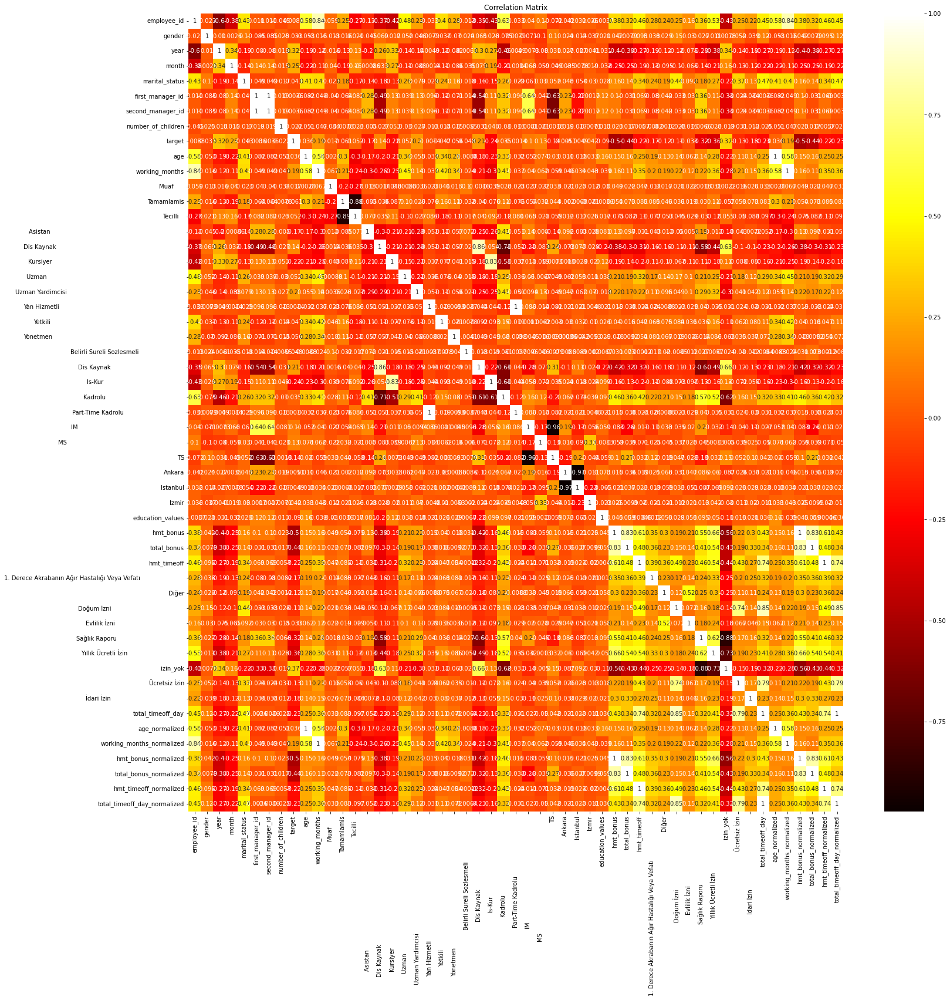

In [197]:
plt.figure(figsize=(25,25))
sns.heatmap(df_train.corr(), annot=True, cmap='hot').set(title='Correlation Matrix')

## Model

In [198]:
df.columns[26]

'Yan Hizmetli                                                                    '

In [199]:
df_train.drop(columns=["second_manager_id",df.columns[26]], inplace=True)

C:\Users\Mehmet\AppData\Local\Temp\ipykernel_19120\1096177933.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_train.drop(columns=["second_manager_id",df.columns[26]], inplace=True)


In [200]:
df_valid.drop(columns=["second_manager_id",df.columns[26]], inplace=True)

C:\Users\Mehmet\AppData\Local\Temp\ipykernel_19120\2445173649.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_valid.drop(columns=["second_manager_id",df.columns[26]], inplace=True)


In [201]:
df_train

,employee_id,gender,year,month,marital_status,military_status,title,employment_type,department_code,first_manager_id,location,education,number_of_children,target,total_notice,age,working_months,Muaf,Tamamlamis,Tecilli,Asistan,Dis Kaynak,Kursiyer,Uzman,Uzman Yardimcisi,Yetkili,Yonetmen,Belirli Sureli Sozlesmeli,Dis Kaynak,Is-Kur,Kadrolu,Part-Time Kadrolu,IM,MS,TS,Ankara,Istanbul,Izmir,education_values,hmt_bonus,total_bonus,hmt_timeoff,1. Derece Akrabanın Ağır Hastalığı Veya Vefatı,Diğer,Doğum İzni,Evlilik İzni,Sağlık Raporu,Yıllık Ücretli İzin,izin_yok,Ücretsiz İzin,İdari İzin,total_timeoff_day,age_normalized,working_months_normalized,hmt_bonus_normalized,total_bonus_normalized,hmt_timeoff_normalized,total_timeoff_day_normalized
508,104813,0,2018.0,12.0,0,Tamamlamis,Uzman Yardimcisi ...,Kadrolu ...,IM ...,0.106600,Istanbul,Lisans,0.0,1,0,28.0,28,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,1,0,3.0,29.0,18700.48,28,0,0,0,0,1,1,0,0,0,84.0,0.263158,0.149733,0.659091,0.132710,0.130233,0.086598
509,97379,0,2018.0,12.0,0,Tecilli,Uzman Yardimcisi ...,Kadrolu ...,IM ...,0.143944,Istanbul,Lise,0.0,1,0,26.0,23,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,1,0,1.0,24.0,13879.21,13,0,1,0,0,1,1,0,0,0,29.0,0.210526,0.122995,0.545455,0.098496,0.060465,0.029897
510,92720,1,2018.0,12.0,0,Tecilli,Uzman Yardimcisi ...,Kadrolu ...,IM ...,0.143944,Istanbul,On Lisans,0.0,1,0,25.0,19,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,1,0,2.0,17.0,10115.17,28,0,1,0,0,1,1,0,0,0,86.0,0.184211,0.101604,0.386364,0.071784,0.130233,0.088660
511,88355,0,2018.0,12.0,0,Tecilli,Uzman Yardimcisi ...,Kadrolu ...,IM ...,0.143944,Istanbul,Lisans,0.0,1,0,25.0,13,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,1,0,3.0,13.0,6368.88,3,0,0,0,0,1,0,0,0,0,6.0,0.184211,0.069519,0.295455,0.045198,0.013953,0.006186
512,88334,1,2018.0,12.0,0,Tecilli,Uzman Yardimcisi ...,Kadrolu ...,IM ...,0.143944,Istanbul,Lisans,0.0,1,0,23.0,13,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,1,0,3.0,13.0,7764.89,2,0,1,0,0,1,0,0,0,0,2.0,0.131579,0.069519,0.295455,0.055105,0.009302,0.002062
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2442,76520,1,2018.0,12.0,0,Tamamlamis,Kursiyer ...,Is-Kur ...,IM ...,0.143944,Istanbul,Lisans,0.0,0,1,26.0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,3.0,8.0,6350.27,5,0,0,0,0,1,0,0,0,0,5.0,0.210526,0.000000,0.181818,0.045066,0.023256,0.005155
2443,76514,1,2018.0,12.0,0,Tecilli,Kursiyer ...,Is-Kur ...,IM ...,0.143944,Istanbul,Lise,0.0,0,0,23.0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,1.0,8.0,1753.89,7,0,0,0,0,1,0,0,0,0,9.0,0.131579,0.000000,0.181818,0.012447,0.032558,0.009278
2444,76511,1,2018.0,12.0,0,Tecilli,Kursiyer ...,Is-Kur ...,IM ...,0.143944,Istanbul,On Lisans,0.0,0,0,21.0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,2.0,8.0,2302.35,0,0,0,0,0,0,0,1,0,0,0.0,0.078947,0.000000,0.181818,0.016339,0.000000,0.000000
2445,76490,0,2018.0,12.0,0,Tecilli,Kursiyer ...,Is-Kur ...,IM ...,0.143944,Istanbul,On Lisans,0.0,0,0,21.0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,2.0,8.0,4844.58,0,0,0,0,0,0,0,1,0,0,0.0,0.078947,0.000000,0.181818,0.034380,0.000000,0.000000


In [202]:
df_train['total_notice'] = df_train['total_notice'].astype(int)

C:\Users\Mehmet\AppData\Local\Temp\ipykernel_19120\601664633.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_train['total_notice'] = df_train['total_notice'].astype(int)


In [203]:
'''x = df_train.drop(["target", "employee_id",'year', 'month','military_status','title','employment_type','department_code', 'location',"education",
                  "age","working_months","hmt_bonus","total_bonus","hmt_timeoff","total_timeoff_day", 'first_manager_id',df.columns[26],
                  df.columns[33],'Ankara','Istanbul'], axis=1)'''

'''x = df_train.drop(["target", "employee_id",'year', 'month','military_status','title','employment_type','department_code', 'location',"education",
                  "age","working_months","hmt_bonus","total_bonus","hmt_timeoff","total_timeoff_day"], axis=1)'''

x = df_train.drop(["target", "employee_id",'year', 'month','military_status','title','employment_type','department_code', 'location',"education",
                  "age","working_months","hmt_bonus","total_bonus","hmt_timeoff","total_timeoff_day"], axis=1)

y = df_train["target"]

In [204]:
x

,gender,marital_status,first_manager_id,number_of_children,total_notice,Muaf,Tamamlamis,Tecilli,Asistan,Dis Kaynak,Kursiyer,Uzman,Uzman Yardimcisi,Yetkili,Yonetmen,Belirli Sureli Sozlesmeli,Dis Kaynak,Is-Kur,Kadrolu,Part-Time Kadrolu,IM,MS,TS,Ankara,Istanbul,Izmir,education_values,1. Derece Akrabanın Ağır Hastalığı Veya Vefatı,Diğer,Doğum İzni,Evlilik İzni,Sağlık Raporu,Yıllık Ücretli İzin,izin_yok,Ücretsiz İzin,İdari İzin,age_normalized,working_months_normalized,hmt_bonus_normalized,total_bonus_normalized,hmt_timeoff_normalized,total_timeoff_day_normalized
508,0,0,0.106600,0.0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,1,0,3.0,0,0,0,0,1,1,0,0,0,0.263158,0.149733,0.659091,0.132710,0.130233,0.086598
509,0,0,0.143944,0.0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,1,0,1.0,0,1,0,0,1,1,0,0,0,0.210526,0.122995,0.545455,0.098496,0.060465,0.029897
510,1,0,0.143944,0.0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,1,0,2.0,0,1,0,0,1,1,0,0,0,0.184211,0.101604,0.386364,0.071784,0.130233,0.088660
511,0,0,0.143944,0.0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,1,0,3.0,0,0,0,0,1,0,0,0,0,0.184211,0.069519,0.295455,0.045198,0.013953,0.006186
512,1,0,0.143944,0.0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,1,0,3.0,0,1,0,0,1,0,0,0,0,0.131579,0.069519,0.295455,0.055105,0.009302,0.002062
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2442,1,0,0.143944,0.0,1,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,3.0,0,0,0,0,1,0,0,0,0,0.210526,0.000000,0.181818,0.045066,0.023256,0.005155
2443,1,0,0.143944,0.0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,1.0,0,0,0,0,1,0,0,0,0,0.131579,0.000000,0.181818,0.012447,0.032558,0.009278
2444,1,0,0.143944,0.0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,2.0,0,0,0,0,0,0,1,0,0,0.078947,0.000000,0.181818,0.016339,0.000000,0.000000
2445,0,0,0.143944,0.0,0,0,0,1,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,2.0,0,0,0,0,0,0,1,0,0,0.078947,0.000000,0.181818,0.034380,0.000000,0.000000


In [205]:
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.33, random_state=3)

In [206]:
df_train.corr()["target"]

C:\Users\Mehmet\AppData\Local\Temp\ipykernel_19120\3868583722.py:1: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  df_train.corr()["target"]


employee_id                                                                         0.008776
gender                                                                             -0.032775
year                                                                                0.317010
month                                                                               0.249755
marital_status                                                                     -0.042910
first_manager_id                                                                    0.003566
number_of_children                                                                 -0.021970
target                                                                              1.000000
total_notice                                                                        0.033769
age                                                                                 0.036453
working_months                                                        

### Random Forest

In [207]:
rf= RandomForestClassifier()
#sfm = SelectFromModel(rf, threshold=0.15) 
#sfm.fit(x_train, y_train)
#x_train_new = sfm.transform(x_train)
#x_test_new = sfm.transform(x_test)

rf.fit(x_train, y_train)

#selected_features = x_train.columns[(sfm.get_support())]
#print(selected_features)

RandomForestClassifier()

In [208]:
rf_predicts= rf.predict(x_test)

In [209]:
rf_cm= confusion_matrix(y_test, rf_predicts)
print("\nRandom Forest Confusion Matrix:\n")
print(rf_cm)


Random Forest Confusion Matrix:

[[244  11]
 [  8 377]]


In [210]:
target_names = ['0', '1']
print(classification_report(y_test, rf_predicts, target_names=target_names))

              precision    recall  f1-score   support

           0       0.97      0.96      0.96       255
           1       0.97      0.98      0.98       385

    accuracy                           0.97       640
   macro avg       0.97      0.97      0.97       640
weighted avg       0.97      0.97      0.97       640



In [211]:
cv=5

In [212]:
#cross_val_score(rf, np.concatenate((x_train_new, x_test_new)), np.concatenate((y_train, y_test)), cv=cv, scoring='accuracy').mean()

In [213]:
# Eğitim ve test setlerindeki doğrulukları karşılaştırma
train_acc = rf.score(x_train, y_train)
test_acc = rf.score(x_test, y_test)

print(f"Eğitim seti doğruluğu: {train_acc}")
print(f"Test seti doğruluğu: {test_acc}")

Eğitim seti doğruluğu: 0.9992301770592764
Test seti doğruluğu: 0.9703125


In [214]:
scores = []
for i in range(1,3):
    scores.append(cross_val_score(rf, x, y, cv=cv, scoring='f1'))


scor = []
for i in range (len(scores)):
    scor.append(scores[i].mean())
rf_f1 = mean(scor)
print("Random Forest doğrulanmış f1 skoru:", rf_f1)

Random Forest doğrulanmış f1 skoru: 0.9480248786918559


In [215]:
scores = []
for i in range(1,3):
    scores.append(cross_val_score(rf, x, y, cv=cv, scoring='accuracy'))


scor = []
for i in range (len(scores)):
    scor.append(scores[i].mean())
rf_accuracy = mean(scor)
print("Random Forest doğrulanmış accuracy skoru:", rf_accuracy)

Random Forest doğrulanmış accuracy skoru: 0.9278190681691042


In [216]:
scores = []
for i in range(1,3):
    scores.append(cross_val_score(rf, x, y, cv=cv, scoring='neg_brier_score'))


scor = []
for i in range (len(scores)):
    scor.append(scores[i].mean())
rf_brier = -1*mean(scor)
print("Random Forest doğrulanmış brier skoru:", rf_brier)

Random Forest doğrulanmış brier skoru: 0.05686825811254028


In [217]:
scores = []
for i in range(1,3):
    
    scores.append(cross_val_score(rf, x, y, cv=cv, scoring=make_scorer(roc_auc_score, greater_is_better=True)))

scor = -1*[]
for i in range (len(scores)):
    scor.append(scores[i].mean())
rf_roc_auc = mean(scor)
print("Random Forest doğrulanmış roc-auc skoru:", rf_roc_auc)

Random Forest doğrulanmış roc-auc skoru: 0.9110173266224221


In [218]:
rf_class1_probs = rf.predict_proba(x_test)[:, 1]

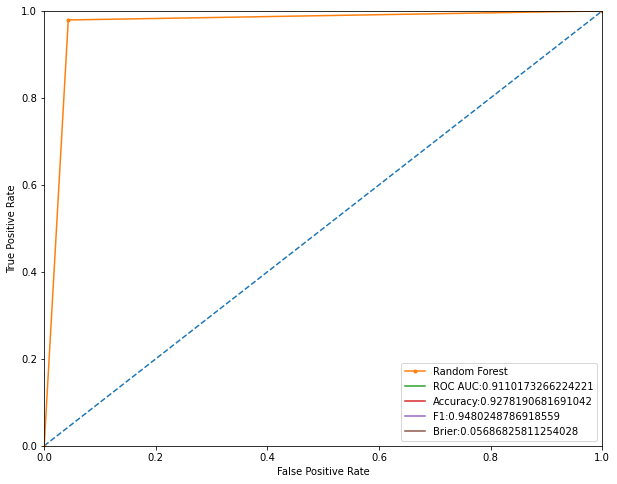

In [219]:
n_probs = [0 for _ in range(len(y_test))]
n_fpr, n_tpr, thresholds = roc_curve(y_test, n_probs)
plt.figure(figsize=(10,8))
fpr, tpr, thresholds = roc_curve(y_test, rf_predicts)
plt.plot(n_fpr, n_tpr, linestyle='--')
plt.plot(fpr, tpr, marker='.', label='Random Forest')
plt.plot(0, label = 'ROC AUC:'+str(rf_roc_auc))
plt.plot(0, label = 'Accuracy:'+str(rf_accuracy))
plt.plot(0, label = 'F1:'+str(rf_f1))
plt.plot(0, label = 'Brier:'+str(rf_brier))
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.ylim([0.0, 1.0])
plt.xlim([0.0, 1.0])
plt.legend(loc=4)
plt.show()

<AxesSubplot:>

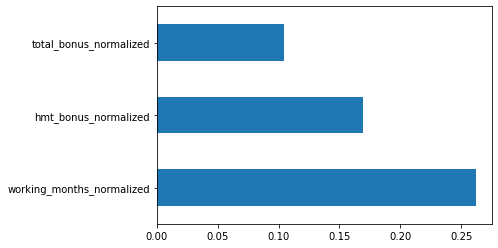

In [220]:
importances = pd.Series(rf.feature_importances_, index=x.columns)
importances.nlargest(3).plot(kind='barh')

#### Hyperparameter Tuning

In [221]:

rf_params = {
    'n_estimators': [5,6,7,15],
    'max_depth': [3,4,5,8],
    'min_samples_split': [9,10,12],
    'min_samples_leaf': [10,12],
    
}




In [222]:
rf_tuned = GridSearchCV(rf, 
                           rf_params, 
                           cv = cv,
                           
                           scoring = 'accuracy',
                           n_jobs = -1, 
                           verbose = 2) 

In [223]:
rf_tuned.fit(x_train, y_train)

Fitting 5 folds for each of 96 candidates, totalling 480 fits


GridSearchCV(cv=5, estimator=RandomForestClassifier(), n_jobs=-1,
             param_grid={'max_depth': [3, 4, 5, 8],
                         'min_samples_leaf': [10, 12],
                         'min_samples_split': [9, 10, 12],
                         'n_estimators': [5, 6, 7, 15]},
             scoring='accuracy', verbose=2)

In [224]:
print("En iyi parametreler: " + str(rf_tuned.best_params_))

En iyi parametreler: {'max_depth': 8, 'min_samples_leaf': 10, 'min_samples_split': 10, 'n_estimators': 15}


In [225]:
rf_tuned= RandomForestClassifier(**rf_tuned.best_params_)

In [226]:
rf_tuned.fit(x_train, y_train)

rf_tuned_predicts= rf_tuned.predict(x_test)

rf_tuned_class1_probs =rf_tuned.predict_proba(x_test)[:, 1]

In [227]:
rf_tuned_cm= confusion_matrix(y_test, rf_tuned_predicts)
print("\nRandom Forest Confusion Matrix:\n")
print(rf_tuned_cm)


Random Forest Confusion Matrix:

[[226  29]
 [  3 382]]


In [228]:
# Eğitim ve test setlerindeki doğrulukları karşılaştırma
train_acc = rf_tuned.score(x_train, y_train)
test_acc = rf_tuned.score(x_test, y_test)

print(f"Eğitim seti doğruluğu: {train_acc}")
print(f"Test seti doğruluğu: {test_acc}")

Eğitim seti doğruluğu: 0.9653579676674365
Test seti doğruluğu: 0.95


In [229]:
print(classification_report(y_test, rf_tuned_predicts, target_names=target_names))

              precision    recall  f1-score   support

           0       0.99      0.89      0.93       255
           1       0.93      0.99      0.96       385

    accuracy                           0.95       640
   macro avg       0.96      0.94      0.95       640
weighted avg       0.95      0.95      0.95       640



In [230]:
scores = []
for i in range(1,3):
    scores.append(cross_val_score(rf_tuned, x, y, cv=cv, scoring='f1'))


scor = []
for i in range (len(scores)):
    scor.append(scores[i].mean())
rf_tuned_f1 = -1*mean(scor)
print("Random Forest doğrulanmış brier skoru:", rf_brier)

Random Forest doğrulanmış brier skoru: 0.05686825811254028


In [231]:
scores = []
for i in range(1,3):
    scores.append(cross_val_score(rf_tuned, x, y, cv=cv, scoring='accuracy'))


scor = []
for i in range (len(scores)):
    scor.append(scores[i].mean())
rf_tuned_accuracy = mean(scor)
print("Random Forest doğrulanmış accuracy skoru:", rf_tuned_accuracy)

Random Forest doğrulanmış accuracy skoru: 0.8994439116652015


In [232]:
scores = []
for i in range(1,3):
    scores.append(cross_val_score(rf_tuned, x, y, cv=cv, scoring='neg_brier_score'))


scor = []
for i in range (len(scores)):
    scor.append(scores[i].mean())
rf_tuned_brier = -1*mean(scor)
print("Random Forest doğrulanmış brier skoru:", rf_tuned_brier)

Random Forest doğrulanmış brier skoru: 0.07373236765357158


In [233]:
scores = []
for i in range(1,3):
    scores.append(cross_val_score(rf_tuned, x, y, cv=cv, scoring=make_scorer(roc_auc_score, greater_is_better=True)))


scor = []
for i in range (len(scores)):
    scor.append(scores[i].mean())
rf_tuned_roc_auc = mean(scor)
print("Random Forest doğrulanmış roc-auc skoru:", rf_tuned_roc_auc)

Random Forest doğrulanmış roc-auc skoru: 0.8715179724733864


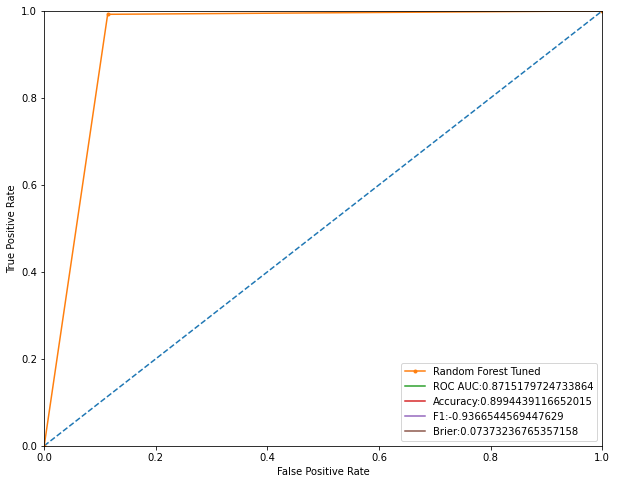

In [234]:
n_probs = [0 for _ in range(len(y_test))]
n_fpr, n_tpr, thresholds = roc_curve(y_test, n_probs)
plt.figure(figsize=(10,8))
fpr, tpr, thresholds = roc_curve(y_test, rf_tuned_predicts)
plt.plot(n_fpr, n_tpr, linestyle='--')
plt.plot(fpr, tpr, marker='.', label='Random Forest Tuned')
plt.plot(0, label = 'ROC AUC:'+str(rf_tuned_roc_auc))
plt.plot(0, label = 'Accuracy:'+str(rf_tuned_accuracy))
plt.plot(0, label = 'F1:'+str(rf_tuned_f1))
plt.plot(0, label = 'Brier:'+str(rf_tuned_brier))
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.ylim([0.0, 1.0])
plt.xlim([0.0, 1.0])
plt.legend(loc=4)
plt.show()

<AxesSubplot:>

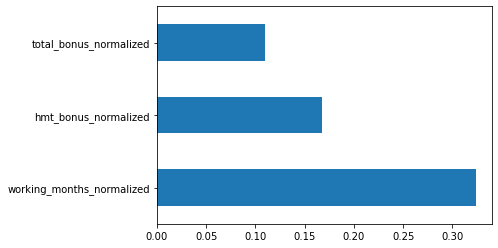

In [235]:
importances = pd.Series(rf_tuned.feature_importances_, index=x.columns)
importances.nlargest(3).plot(kind='barh')

### Gradient Boosting

In [236]:
gbc= GradientBoostingClassifier()
gbc.fit(x_train, y_train)

GradientBoostingClassifier()

In [237]:
gbc_predicts= gbc.predict(x_test)
gbc_cm= confusion_matrix(y_test, gbc_predicts)
print("\nGradient Boosting Confusion Matrix:\n")
print(gbc_cm)


Gradient Boosting Confusion Matrix:

[[241  14]
 [  6 379]]


In [238]:
print(classification_report(y_test, gbc_predicts, target_names=target_names))

              precision    recall  f1-score   support

           0       0.98      0.95      0.96       255
           1       0.96      0.98      0.97       385

    accuracy                           0.97       640
   macro avg       0.97      0.96      0.97       640
weighted avg       0.97      0.97      0.97       640



In [239]:
# Eğitim ve test setlerindeki doğrulukları karşılaştırma
train_acc = gbc.score(x_train, y_train)
test_acc = gbc.score(x_test, y_test)

print(f"Eğitim seti doğruluğu: {train_acc}")
print(f"Test seti doğruluğu: {test_acc}")

Eğitim seti doğruluğu: 0.9930715935334873
Test seti doğruluğu: 0.96875


In [240]:
gbc_class1_probs = gbc.predict_proba(x_test)[:,1]

In [241]:
gbc_f1 = cross_val_score(gbc, x, y, cv=cv, scoring='f1').mean()
print("Gradient Boosting doğrulanmış f1 skoru:", gbc_f1)

Gradient Boosting doğrulanmış f1 skoru: 0.9526787589746434


In [242]:
gbc_accuracy = cross_val_score(gbc, x, y, cv=cv, scoring='accuracy').mean()
print("Gradient Boosting doğrulanmış accuracy skoru:", gbc_accuracy)

Gradient Boosting doğrulanmış accuracy skoru: 0.9417392578385145


In [243]:
gbc_brier = -1*cross_val_score(gbc, x, y, cv=cv, scoring='neg_brier_score').mean()
print("Gradient Boosting doğrulanmış brier skoru:", gbc_brier)

Gradient Boosting doğrulanmış brier skoru: 0.04827759432469571


In [244]:
gbc_roc_auc = cross_val_score(gbc, x, y, cv=cv, scoring=make_scorer(roc_auc_score, greater_is_better=True)).mean()
print("Gradient Boosting doğrulanmış roc-auc skoru:", gbc_roc_auc)

Gradient Boosting doğrulanmış roc-auc skoru: 0.934713640923832


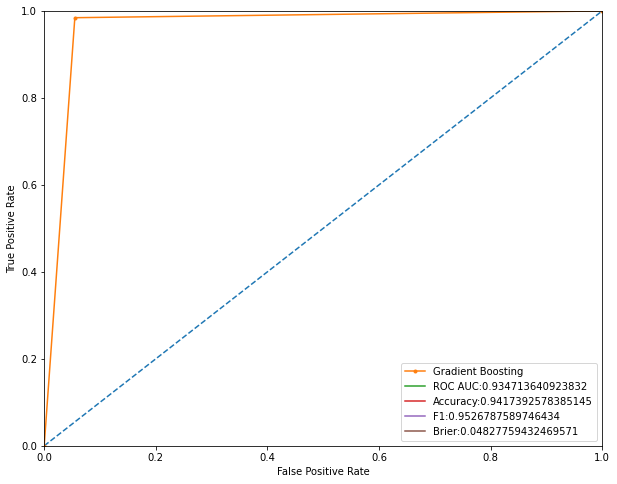

In [245]:
n_probs = [0 for _ in range(len(y_test))]
n_fpr, n_tpr, thresholds = roc_curve(y_test, n_probs)
plt.figure(figsize=(10,8))
fpr, tpr, thresholds = roc_curve(y_test, gbc_predicts)
plt.plot(n_fpr, n_tpr, linestyle='--')
plt.plot(fpr, tpr, marker='.', label='Gradient Boosting')
plt.plot(0, label = 'ROC AUC:'+str(gbc_roc_auc))
plt.plot(0, label = 'Accuracy:'+str(gbc_accuracy))
plt.plot(0, label = 'F1:'+str(gbc_f1))
plt.plot(0, label = 'Brier:'+str(gbc_brier))
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.ylim([0.0, 1.0])
plt.xlim([0.0, 1.0])
plt.legend(loc=4)
plt.show()

#### Hyperparameter Tuning

In [246]:
gbc_params = {
    'learning_rate': [0.001,0.01, 0.1],
    'n_estimators': [2,3,4],
    'max_depth': [3,4,5],
    'subsample': [0.5, 0.8, 1.0],
    'min_samples_split': [20,30],
    'min_samples_leaf': [15,20]
}

gbc_tuned = GridSearchCV(gbc, 
                           gbc_params, 
                           cv = cv,
                              
                           n_jobs = -1, 
                           verbose = 2,
                              scoring='accuracy') 

gbc_tuned.fit(x_train, y_train)

print("En iyi parametreler: " + str(gbc_tuned.best_params_))

Fitting 5 folds for each of 324 candidates, totalling 1620 fits
En iyi parametreler: {'learning_rate': 0.1, 'max_depth': 4, 'min_samples_leaf': 20, 'min_samples_split': 30, 'n_estimators': 4, 'subsample': 1.0}


In [247]:
# Eğitim ve test setlerindeki doğrulukları karşılaştırma
train_acc = gbc_tuned.score(x_train, y_train)
test_acc = gbc_tuned.score(x_test, y_test)

print(f"Eğitim seti doğruluğu: {train_acc}")
print(f"Test seti doğruluğu: {test_acc}")

Eğitim seti doğruluğu: 0.9599692070823711
Test seti doğruluğu: 0.953125


In [248]:
gbc_tuned= GradientBoostingClassifier(**gbc_tuned.best_params_)
gbc_tuned.fit(x_train, y_train)

gbc_tuned_predicts= gbc_tuned.predict(x_test)

gbc_tuned_class1_probs =gbc_tuned.predict_proba(x_test)[:, 1]

In [249]:
gbc_tuned_cm= confusion_matrix(y_test, gbc_tuned_predicts)
print("\nGradient Boosting Confusion Matrix:\n")
print(gbc_tuned_cm)


Gradient Boosting Confusion Matrix:

[[230  25]
 [  5 380]]


In [250]:
print(classification_report(y_test, gbc_tuned_predicts, target_names=target_names))

              precision    recall  f1-score   support

           0       0.98      0.90      0.94       255
           1       0.94      0.99      0.96       385

    accuracy                           0.95       640
   macro avg       0.96      0.94      0.95       640
weighted avg       0.95      0.95      0.95       640



In [251]:
scores = []
for i in range(1,3):
    scores.append(cross_val_score(gbc_tuned, x, y, cv=cv, scoring='f1'))


scor = []
for i in range (len(scores)):
    scor.append(scores[i].mean())
gbc_tuned_f1 = mean(scor)
print("Gradient Boosting doğrulanmış f1 skoru:", gbc_tuned_f1)

Gradient Boosting doğrulanmış f1 skoru: 0.9291450000696099


In [252]:
scores = []
for i in range(1,3):
    scores.append(cross_val_score(gbc_tuned, x, y, cv=cv, scoring='accuracy'))


scor = []
for i in range (len(scores)):
    scor.append(scores[i].mean())
gbc_tuned_accuracy = mean(scor)
print("Gradient Boosting doğrulanmış accuracy skoru:", gbc_tuned_accuracy)

Gradient Boosting doğrulanmış accuracy skoru: 0.9139028743440155


In [253]:
scores = []
for i in range(1,3):
    scores.append(cross_val_score(gbc_tuned, x, y, cv=cv, scoring='neg_brier_score'))


scor = []
for i in range (len(scores)):
    scor.append(scores[i].mean())
gbc_tuned_brier = -1*mean(scor)
print("Gradient Boosting doğrulanmış brier skoru:", gbc_tuned_brier)

Gradient Boosting doğrulanmış brier skoru: 0.13189401563030148


In [254]:
scores = []
for i in range(1,3):
    scores.append(cross_val_score(gbc_tuned, x, y, cv=cv, scoring=make_scorer(roc_auc_score, greater_is_better=True)))


scor = []
for i in range (len(scores)):
    scor.append(scores[i].mean())
gbc_tuned_roc_auc = mean(scor)
print("Gradient Boosting doğrulanmış roc-auc skoru:", gbc_tuned_roc_auc)

Gradient Boosting doğrulanmış roc-auc skoru: 0.9058486099887373


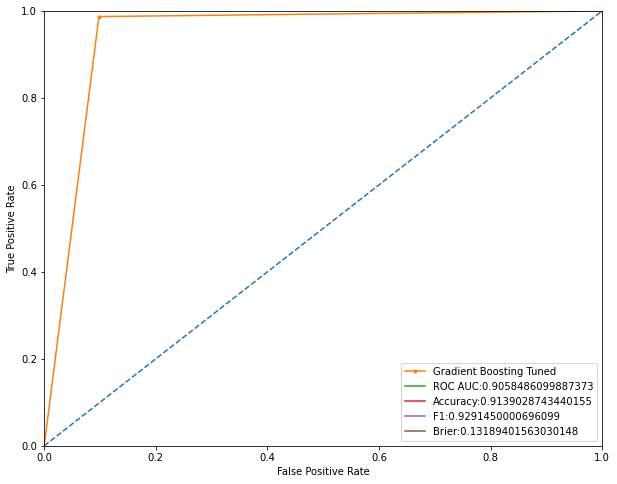

In [255]:
n_probs = [0 for _ in range(len(y_test))]
n_fpr, n_tpr, thresholds = roc_curve(y_test, n_probs)
plt.figure(figsize=(10,8))
fpr, tpr, thresholds = roc_curve(y_test, gbc_tuned_predicts)
plt.plot(n_fpr, n_tpr, linestyle='--')
plt.plot(fpr, tpr, marker='.', label='Gradient Boosting Tuned')
plt.plot(0, label = 'ROC AUC:'+str(gbc_tuned_roc_auc))
plt.plot(0, label = 'Accuracy:'+str(gbc_tuned_accuracy))
plt.plot(0, label = 'F1:'+str(gbc_tuned_f1))
plt.plot(0, label = 'Brier:'+str(gbc_tuned_brier))
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.ylim([0.0, 1.0])
plt.xlim([0.0, 1.0])
plt.legend(loc=4)
plt.show()

<AxesSubplot:>

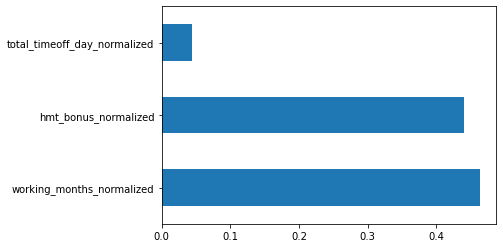

In [256]:
importances_gbc = pd.Series(gbc_tuned.feature_importances_, index=x.columns)
importances_gbc.nlargest(3).plot(kind='barh')

### Ada Boost

In [257]:
ada= AdaBoostClassifier()
ada.fit(x_train, y_train)

ada_predicts= ada.predict(x_test)
ada_cm= confusion_matrix(y_test, ada_predicts)
print("\nAda Boost Confusion Matrix:\n")
print(ada_cm)


Ada Boost Confusion Matrix:

[[234  21]
 [ 15 370]]


In [258]:
print(classification_report(y_test, ada_predicts, target_names=target_names))

              precision    recall  f1-score   support

           0       0.94      0.92      0.93       255
           1       0.95      0.96      0.95       385

    accuracy                           0.94       640
   macro avg       0.94      0.94      0.94       640
weighted avg       0.94      0.94      0.94       640



In [259]:
# Eğitim ve test setlerindeki doğrulukları karşılaştırma
train_acc = ada.score(x_train, y_train)
test_acc = ada.score(x_test, y_test)

print(f"Eğitim seti doğruluğu: {train_acc}")
print(f"Test seti doğruluğu: {test_acc}")

Eğitim seti doğruluğu: 0.9838337182448037
Test seti doğruluğu: 0.94375


In [260]:
ada_f1 = cross_val_score(ada, x, y, cv=cv, scoring='f1').mean()
print("Ada Boost doğrulanmış f1 skoru:", ada_f1)

Ada Boost doğrulanmış f1 skoru: 0.9318288767784478


In [261]:
ada_accuracy = cross_val_score(ada, x, y, cv=cv, scoring='accuracy').mean()
print("Ada Boost doğrulanmış accuracy skoru:", ada_accuracy)

Ada Boost doğrulanmış accuracy skoru: 0.9195556621114042


In [262]:
ada_brier = -1*cross_val_score(ada, x, y, cv=cv, scoring='neg_brier_score').mean()
print("Ada Boost doğrulanmış brier skoru:", ada_brier)

Ada Boost doğrulanmış brier skoru: 0.21065407906749356


In [263]:
ada_roc_auc = cross_val_score(ada, x, y, cv=cv, scoring=make_scorer(roc_auc_score, greater_is_better=True)).mean()
print("Ada Boost doğrulanmış roc-auc skoru:", ada_roc_auc)

Ada Boost doğrulanmış roc-auc skoru: 0.9133976957225366


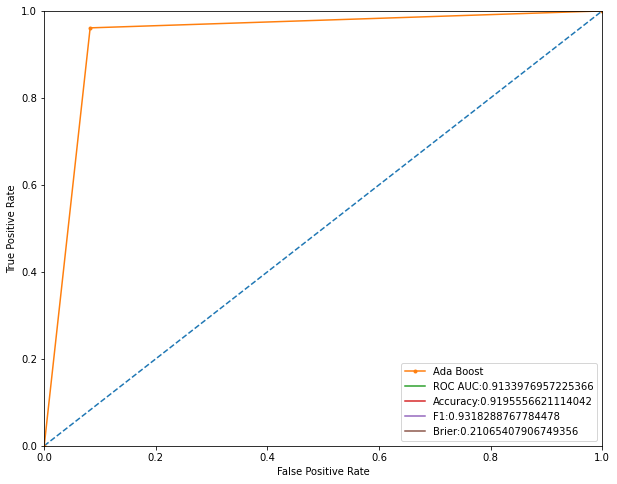

In [264]:
ada_class1_probs = ada.predict_proba(x_test)[:,1]

n_probs = [0 for _ in range(len(y_test))]
n_fpr, n_tpr, thresholds = roc_curve(y_test, n_probs)
plt.figure(figsize=(10,8))
fpr, tpr, thresholds = roc_curve(y_test, ada_predicts)
plt.plot(n_fpr, n_tpr, linestyle='--')
plt.plot(fpr, tpr, marker='.', label='Ada Boost')
plt.plot(0, label = 'ROC AUC:'+str(ada_roc_auc))
plt.plot(0, label = 'Accuracy:'+str(ada_accuracy))
plt.plot(0, label = 'F1:'+str(ada_f1))
plt.plot(0, label = 'Brier:'+str(ada_brier))
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.ylim([0.0, 1.0])
plt.xlim([0.0, 1.0])
plt.legend(loc=4)
plt.show()

#### Hyperparameter Tuning

In [265]:
ada_params = {"learning_rate" : [0.001, 0.01,0.05],
             "n_estimators": [3, 5, 10,15,20,25,50,100]
             
             }

ada_tuned = GridSearchCV(ada, 
                           ada_params, 
                           cv = cv, 
                           
                               scoring='accuracy',
                               
                           n_jobs = -1, 
                           verbose = 2) 

ada_tuned.fit(x_train, y_train)

print("En iyi parametreler: " + str(ada_tuned.best_params_))

ada_tuned= AdaBoostClassifier(**ada_tuned.best_params_)

ada_tuned.fit(x_train, y_train)

ada_tuned_predicts= ada_tuned.predict(x_test)

ada_tuned_class1_probs =ada_tuned.predict_proba(x_test)[:, 1]

Fitting 5 folds for each of 24 candidates, totalling 120 fits
En iyi parametreler: {'learning_rate': 0.05, 'n_estimators': 100}


In [266]:
# Eğitim ve test setlerindeki doğrulukları karşılaştırma
train_acc = ada_tuned.score(x_train, y_train)
test_acc = ada_tuned.score(x_test, y_test)

print(f"Eğitim seti doğruluğu: {train_acc}")
print(f"Test seti doğruluğu: {test_acc}")

Eğitim seti doğruluğu: 0.9091608929946112
Test seti doğruluğu: 0.875


In [267]:
ada_tuned_cm= confusion_matrix(y_test, ada_tuned_predicts)
print("\nAda Boost Confusion Matrix:\n")
print(ada_tuned_cm)

print(classification_report(y_test, ada_tuned_predicts, target_names=target_names))


Ada Boost Confusion Matrix:

[[225  30]
 [ 50 335]]
              precision    recall  f1-score   support

           0       0.82      0.88      0.85       255
           1       0.92      0.87      0.89       385

    accuracy                           0.88       640
   macro avg       0.87      0.88      0.87       640
weighted avg       0.88      0.88      0.88       640



In [268]:
ada_tuned_f1 = cross_val_score(ada_tuned, x, y, cv=cv, scoring='f1').mean()
print("Ada Boost doğrulanmış f1 skoru:", ada_tuned_f1)

Ada Boost doğrulanmış f1 skoru: 0.9135758160190518


In [269]:
ada_tuned_accuracy = cross_val_score(ada_tuned, x, y, cv=cv, scoring='accuracy').mean()
print("Ada Boost doğrulanmış accuracy skoru:", ada_tuned_accuracy)

Ada Boost doğrulanmış accuracy skoru: 0.8958216787873944


In [270]:
ada_tuned_brier = -1*cross_val_score(ada_tuned, x, y, cv=cv, scoring='neg_brier_score').mean()
print("Ada Boost doğrulanmış brier skoru:", ada_tuned_brier)

Ada Boost doğrulanmış brier skoru: 0.16803123141957302


In [271]:
ada_tuned_roc_auc = cross_val_score(ada_tuned, x, y, cv=cv, scoring=make_scorer(roc_auc_score, greater_is_better=True)).mean()
print("Ada Boost doğrulanmış roc-auc skoru:", ada_tuned_roc_auc)

Ada Boost doğrulanmış roc-auc skoru: 0.8840248392796163


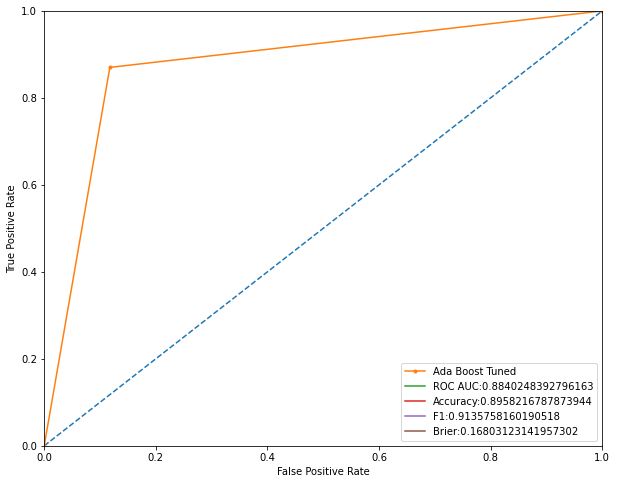

In [272]:
n_probs = [0 for _ in range(len(y_test))]
n_fpr, n_tpr, thresholds = roc_curve(y_test, n_probs)
plt.figure(figsize=(10,8))
fpr, tpr, thresholds = roc_curve(y_test, ada_tuned_predicts)
plt.plot(n_fpr, n_tpr, linestyle='--')
plt.plot(fpr, tpr, marker='.', label='Ada Boost Tuned')
plt.plot(0, label = 'ROC AUC:'+str(ada_tuned_roc_auc))
plt.plot(0, label = 'Accuracy:'+str(ada_tuned_accuracy))
plt.plot(0, label = 'F1:'+str(ada_tuned_f1))
plt.plot(0, label = 'Brier:'+str(ada_tuned_brier))
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.ylim([0.0, 1.0])
plt.xlim([0.0, 1.0])
plt.legend(loc=4)
plt.show()

<AxesSubplot:>

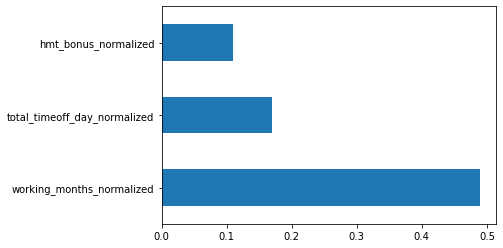

In [273]:
importances_ada = pd.Series(ada_tuned.feature_importances_, index=x.columns)
importances_ada.nlargest(3).plot(kind='barh')

### KNN

In [274]:
df.employee_id.nunique()

2751

In [275]:
knn= KNeighborsClassifier()
knn.fit(x_train, y_train)

knn_predicts= knn.predict(x_test)
knn_cm= confusion_matrix(y_test, knn_predicts)
print("\nKNN Confusion Matrix:\n")
print(knn_cm)

print(classification_report(y_test, knn_predicts, target_names=target_names))


KNN Confusion Matrix:

[[196  59]
 [ 31 354]]
              precision    recall  f1-score   support

           0       0.86      0.77      0.81       255
           1       0.86      0.92      0.89       385

    accuracy                           0.86       640
   macro avg       0.86      0.84      0.85       640
weighted avg       0.86      0.86      0.86       640



In [276]:
# Eğitim ve test setlerindeki doğrulukları karşılaştırma
train_acc = knn.score(x_train, y_train)
test_acc = knn.score(x_test, y_test)

print(f"Eğitim seti doğruluğu: {train_acc}")
print(f"Test seti doğruluğu: {test_acc}")

Eğitim seti doğruluğu: 0.9037721324095458
Test seti doğruluğu: 0.859375


In [277]:
scores = []
for i in range(1,3):
    scores.append(cross_val_score(knn, x, y, cv=cv, scoring='f1'))


scor = []
for i in range (len(scores)):
    scor.append(scores[i].mean())
knn_f1 = mean(scor)
print("KNN doğrulanmış f1 skoru:", knn_f1)

#---------------------------------

scores = []
for i in range(1,3):
    scores.append(cross_val_score(knn, x, y, cv=cv, scoring='accuracy'))


scor = []
for i in range (len(scores)):
    scor.append(scores[i].mean())
knn_accuracy = mean(scor)
print("\nKNN doğrulanmış accuracy skoru:", knn_accuracy)

#---------------------------------
scores = []
for i in range(1,3):
    scores.append(cross_val_score(knn, x, y, cv=cv, scoring='neg_brier_score'))


scor = []
for i in range (len(scores)):
    scor.append(scores[i].mean())
knn_brier = -1*mean(scor)
print("\nKNN doğrulanmış brier skoru:", knn_brier)

#---------------------------------

scores = []
for i in range(1,3):
    scores.append(cross_val_score(knn, x, y, cv=cv, scoring=make_scorer(roc_auc_score, greater_is_better=True)))


scor = []
for i in range (len(scores)):
    scor.append(scores[i].mean())
knn_roc_auc = mean(scor)
print("\nKNN doğrulanmış roc-auc skoru:", knn_roc_auc)

KNN doğrulanmış f1 skoru: 0.8340224295849122

KNN doğrulanmış accuracy skoru: 0.7849250113215589

KNN doğrulanmış brier skoru: 0.16267433868776474

KNN doğrulanmış roc-auc skoru: 0.7600632912734824


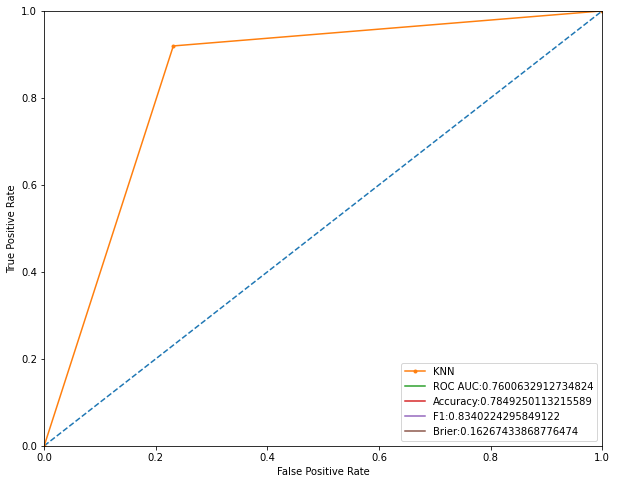

In [278]:
knn_class1_probs = knn.predict_proba(x_test)[:,1]

n_probs = [0 for _ in range(len(y_test))]
n_fpr, n_tpr, thresholds = roc_curve(y_test, n_probs)
plt.figure(figsize=(10,8))
fpr, tpr, thresholds = roc_curve(y_test, knn_predicts)
plt.plot(n_fpr, n_tpr, linestyle='--')
plt.plot(fpr, tpr, marker='.', label='KNN')
plt.plot(0, label = 'ROC AUC:'+str(knn_roc_auc))
plt.plot(0, label = 'Accuracy:'+str(knn_accuracy))
plt.plot(0, label = 'F1:'+str(knn_f1))
plt.plot(0, label = 'Brier:'+str(knn_brier))
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.ylim([0.0, 1.0])
plt.xlim([0.0, 1.0])
plt.legend(loc=4)
plt.show()

#### Hyperparameter Tuning

In [279]:
knn_params = {"n_neighbors": [3, 5,7],
             "weights" : ['uniform', 'distance']
    
    
             
             }

knn_tuned = GridSearchCV(knn, 
                           knn_params, 
                           cv = cv,
                            
                           scoring = 'f1',   
                           n_jobs = -1, 
                           verbose = 2) 

knn_tuned.fit(x_train, y_train)

print("En iyi parametreler: " + str(knn_tuned.best_params_))

knn_tuned= KNeighborsClassifier(**knn_tuned.best_params_)
                              

knn_tuned.fit(x_train, y_train)

knn_tuned_predicts= knn_tuned.predict(x_test)

knn_tuned_class1_probs =knn_tuned.predict_proba(x_test)[:, 1]

knn_tuned_cm= confusion_matrix(y_test, knn_tuned_predicts)
print("\nKNN Confusion Matrix:\n")
print(knn_tuned_cm)

print(classification_report(y_test, knn_tuned_predicts, target_names=target_names))

Fitting 5 folds for each of 6 candidates, totalling 30 fits
En iyi parametreler: {'n_neighbors': 3, 'weights': 'uniform'}

KNN Confusion Matrix:

[[195  60]
 [ 39 346]]
              precision    recall  f1-score   support

           0       0.83      0.76      0.80       255
           1       0.85      0.90      0.87       385

    accuracy                           0.85       640
   macro avg       0.84      0.83      0.84       640
weighted avg       0.84      0.85      0.84       640



In [280]:
# Eğitim ve test setlerindeki doğrulukları karşılaştırma
train_acc = knn_tuned.score(x_train, y_train)
test_acc = knn_tuned.score(x_test, y_test)

print(f"Eğitim seti doğruluğu: {train_acc}")
print(f"Test seti doğruluğu: {test_acc}")

Eğitim seti doğruluğu: 0.9268668206312548
Test seti doğruluğu: 0.8453125


In [281]:
scores = []
for i in range(1,3):
    scores.append(cross_val_score(knn_tuned, x, y, cv=cv, scoring='f1'))


scor = []
for i in range (len(scores)):
    scor.append(scores[i].mean())
knn_tuned_f1 = mean(scor)
print("KNN doğrulanmış f1 skoru:", knn_tuned_f1)

#---------------------------------

scores = []
for i in range(1,3):
    scores.append(cross_val_score(knn_tuned, x, y, cv=cv, scoring='accuracy'))


scor = []
for i in range (len(scores)):
    scor.append(scores[i].mean())
knn_tuned_accuracy = mean(scor)
print("\nKNN doğrulanmış accuracy skoru:", knn_tuned_accuracy)

#---------------------------------
scores = []
for i in range(1,3):
    scores.append(cross_val_score(knn_tuned, x, y, cv=cv, scoring='neg_brier_score'))


scor = []
for i in range (len(scores)):
    scor.append(scores[i].mean())
knn_tuned_brier = -1*mean(scor)
print("\nKNN doğrulanmış brier skoru:", knn_tuned_brier)

#---------------------------------

scores = []
for i in range(1,3):
    scores.append(cross_val_score(knn_tuned, x, y, cv=cv, scoring=make_scorer(roc_auc_score, greater_is_better=True)))


scor = []
for i in range (len(scores)):
    scor.append(scores[i].mean())
knn_tuned_roc_auc = mean(scor)
print("\nKNN doğrulanmış roc-auc skoru:", knn_tuned_roc_auc)

KNN doğrulanmış f1 skoru: 0.8351874094812072

KNN doğrulanmış accuracy skoru: 0.7885292628999173

KNN doğrulanmış brier skoru: 0.1746172129133849

KNN doğrulanmış roc-auc skoru: 0.7667786035620431


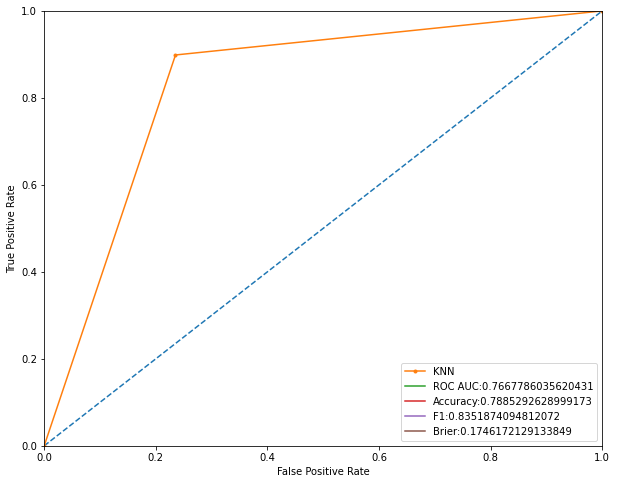

In [282]:
knn_tuned_class1_probs = knn_tuned.predict_proba(x_test)[:,1]

n_probs = [0 for _ in range(len(y_test))]
n_fpr, n_tpr, thresholds = roc_curve(y_test, n_probs)
plt.figure(figsize=(10,8))
fpr, tpr, thresholds = roc_curve(y_test, knn_tuned_predicts)
plt.plot(n_fpr, n_tpr, linestyle='--')
plt.plot(fpr, tpr, marker='.', label='KNN')
plt.plot(0, label = 'ROC AUC:'+str(knn_tuned_roc_auc))
plt.plot(0, label = 'Accuracy:'+str(knn_tuned_accuracy))
plt.plot(0, label = 'F1:'+str(knn_tuned_f1))
plt.plot(0, label = 'Brier:'+str(knn_tuned_brier))
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.ylim([0.0, 1.0])
plt.xlim([0.0, 1.0])
plt.legend(loc=4)
plt.show()

### XG Boost

In [283]:
xg= XGBClassifier()
xg.fit(x_train, y_train)

xg_predicts= xg.predict(x_test)
xg_cm= confusion_matrix(y_test, xg_predicts)
print("\nXG Boost Confusion Matrix:\n")
print(xg_cm)

print(classification_report(y_test, xg_predicts, target_names=target_names))


XG Boost Confusion Matrix:

[[243  12]
 [ 10 375]]
              precision    recall  f1-score   support

           0       0.96      0.95      0.96       255
           1       0.97      0.97      0.97       385

    accuracy                           0.97       640
   macro avg       0.96      0.96      0.96       640
weighted avg       0.97      0.97      0.97       640



In [284]:
# Eğitim ve test setlerindeki doğrulukları karşılaştırma
train_acc = xg.score(x_train, y_train)
test_acc = xg.score(x_test, y_test)

print(f"Eğitim seti doğruluğu: {train_acc}")
print(f"Test seti doğruluğu: {test_acc}")

Eğitim seti doğruluğu: 0.9992301770592764
Test seti doğruluğu: 0.965625


In [285]:
xg_f1 = cross_val_score(xg, x, y, cv=cv, scoring='f1').mean()
print("XG Boost doğrulanmış f1 skoru:", xg_f1)

#---------------------------------

xg_accuracy = cross_val_score(xg, x, y, cv=cv, scoring='accuracy').mean()
print("\nXG Boost doğrulanmış accuracy skoru:", xg_accuracy)

#---------------------------------

xg_brier = -1*cross_val_score(xg, x, y, cv=cv, scoring='neg_brier_score').mean()
print("\nXG Boost doğrulanmış brier skoru:", xg_brier)

#---------------------------------



xg_roc_auc = cross_val_score(xg, x, y, cv=cv, scoring=make_scorer(roc_auc_score, greater_is_better=True)).mean()
print("\nXG Boost doğrulanmış roc-auc skoru:", xg_roc_auc)

XG Boost doğrulanmış f1 skoru: 0.9424643908416728

XG Boost doğrulanmış accuracy skoru: 0.9314326433842138

XG Boost doğrulanmış brier skoru: 0.05526482520796072

XG Boost doğrulanmış roc-auc skoru: 0.9273047016677589


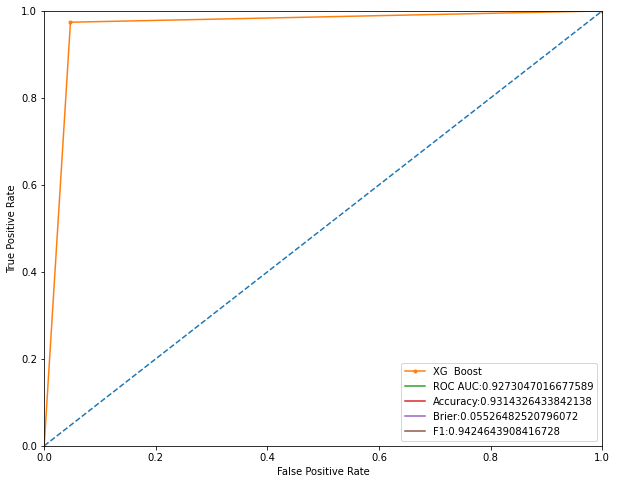

In [286]:
xg_class1_probs = xg.predict_proba(x_test)[:,1]
n_probs = [0 for _ in range(len(y_test))]
n_fpr, n_tpr, thresholds = roc_curve(y_test, n_probs)
plt.figure(figsize=(10,8))
fpr, tpr, thresholds = roc_curve(y_test, xg_predicts)
plt.plot(n_fpr, n_tpr, linestyle='--')
plt.plot(fpr, tpr, marker='.', label='XG  Boost')
plt.plot(0, label = 'ROC AUC:'+str(xg_roc_auc))
plt.plot(0, label = 'Accuracy:'+str(xg_accuracy))
plt.plot(0, label = 'Brier:'+str(xg_brier))
plt.plot(0, label = 'F1:'+str(xg_f1))

plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.ylim([0.0, 1.0])
plt.xlim([0.0, 1.0])
plt.legend(loc=4)
plt.show()

#### Hyperparameter Tuning

In [287]:


xgboost.set_config(verbosity=0)

xg_params = {
    'max_depth': [5,10,15],
    'learning_rate': [0.05,0.01, 0.1,],
    'n_estimators': [20,50,75],
    'subsample': [0.2,0.5, 0.7],
    'colsample_bytree': [0.5, 0.6, 0.8],
    "min_child_weight":[10,20,25]
}

    
    
             
            

xg_tuned = GridSearchCV(xg, 
                           xg_params, 
                           cv = cv,
                           
                           scoring = 'accuracy',   
                           n_jobs = -1, 
                           verbose = 2) 


xg_tuned.fit(x_train, y_train)
print("En iyi parametreler: " + str(xg_tuned.best_params_))

xg_tuned= XGBClassifier(**xg_tuned.best_params_
              
                     )
                              

xg_tuned.fit(x_train, y_train)

xg_tuned_predicts= xg_tuned.predict(x_test)

xg_tuned_class1_probs =xg_tuned.predict_proba(x_test)[:, 1]

xg_tuned_cm= confusion_matrix(y_test, xg_tuned_predicts)
print("\nXG Boost Confusion Matrix:\n")
print(xg_tuned_cm)

print(classification_report(y_test, xg_tuned_predicts, target_names=target_names))

Fitting 5 folds for each of 729 candidates, totalling 3645 fits
En iyi parametreler: {'colsample_bytree': 0.8, 'learning_rate': 0.1, 'max_depth': 10, 'min_child_weight': 10, 'n_estimators': 75, 'subsample': 0.7}

XG Boost Confusion Matrix:

[[233  22]
 [  4 381]]
              precision    recall  f1-score   support

           0       0.98      0.91      0.95       255
           1       0.95      0.99      0.97       385

    accuracy                           0.96       640
   macro avg       0.96      0.95      0.96       640
weighted avg       0.96      0.96      0.96       640



In [288]:
# Eğitim ve test setlerindeki doğrulukları karşılaştırma
train_acc = xg_tuned.score(x_train, y_train)
test_acc = xg_tuned.score(x_test, y_test)

print(f"Eğitim seti doğruluğu: {train_acc}")
print(f"Test seti doğruluğu: {test_acc}")

Eğitim seti doğruluğu: 0.9792147806004619
Test seti doğruluğu: 0.959375


In [289]:
xg_tuned_f1 = cross_val_score(xg_tuned, x, y, cv=cv, scoring='f1').mean()
print("XG Boost doğrulanmış f1 skoru:", xg_tuned_f1)

#---------------------------------


xg_tuned_accuracy = cross_val_score(xg_tuned, x, y, cv=cv, scoring='accuracy').mean()
print("\nXG Boost doğrulanmış accuracy skoru:", xg_tuned_accuracy)

#---------------------------------

xg_tuned_brier = -1*cross_val_score(xg_tuned, x, y, cv=cv, scoring='neg_brier_score').mean()
print("\nXG Boost doğrulanmış brier skoru:", xg_tuned_brier)

#---------------------------------


xg_tuned_roc_auc = cross_val_score(xg_tuned, x, y, cv=cv, scoring=make_scorer(roc_auc_score, greater_is_better=True)).mean()
print("\nXG Boost doğrulanmış roc-auc skoru:", xg_tuned_roc_auc)

XG Boost doğrulanmış f1 skoru: 0.9375992137609233

XG Boost doğrulanmış accuracy skoru: 0.9185460454460694

XG Boost doğrulanmış brier skoru: 0.06066302164113309

XG Boost doğrulanmış roc-auc skoru: 0.9056638690396651


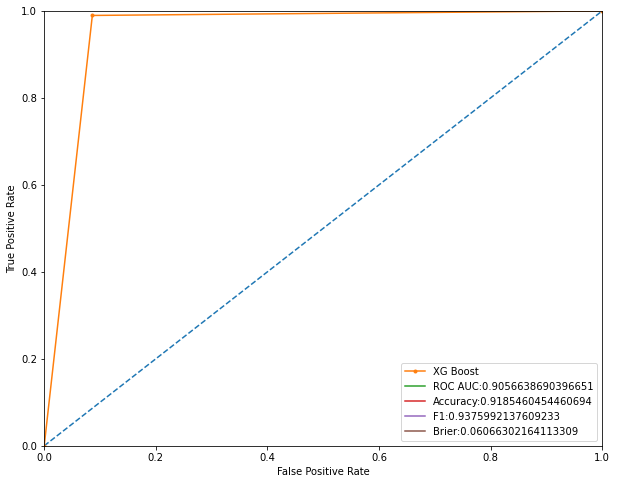

In [290]:
xg_tuned_class1_probs = xg_tuned.predict_proba(x_test)[:,1]

n_probs = [0 for _ in range(len(y_test))]
n_fpr, n_tpr, thresholds = roc_curve(y_test, n_probs)
plt.figure(figsize=(10,8))
fpr, tpr, thresholds = roc_curve(y_test, xg_tuned_predicts)
plt.plot(n_fpr, n_tpr, linestyle='--')
plt.plot(fpr, tpr, marker='.', label='XG Boost')
plt.plot(0, label = 'ROC AUC:'+str(xg_tuned_roc_auc))
plt.plot(0, label = 'Accuracy:'+str(xg_tuned_accuracy))
plt.plot(0, label = 'F1:'+str(xg_tuned_f1))
plt.plot(0, label = 'Brier:'+str(xg_tuned_brier))
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.ylim([0.0, 1.0])
plt.xlim([0.0, 1.0])
plt.legend(loc=4)
plt.show()

<AxesSubplot:>

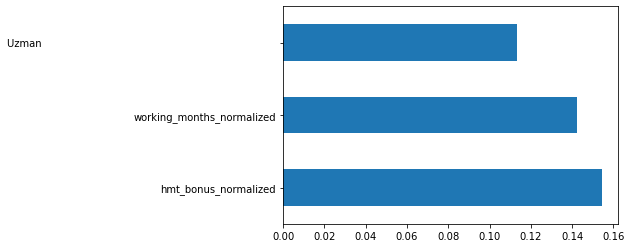

In [291]:
importances_xg = pd.Series(xg_tuned.feature_importances_, index=x.columns)
importances_xg.nlargest(3).plot(kind='barh')

### Cat Boost

In [292]:
cb= CatBoostClassifier(verbose=False)
cb.fit(x_train, y_train)

cb_predicts= cb.predict(x_test)
cb_cm= confusion_matrix(y_test, cb_predicts)
print("\nXG Boost Confusion Matrix:\n")
print(cb_cm)

print(classification_report(y_test, cb_predicts, target_names=target_names))

C:\Users\Mehmet\anaconda3\lib\site-packages\catboost\core.py:1419: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  self._init_pool(data, label, cat_features, text_features, embedding_features, embedding_features_data, pairs, weight,



XG Boost Confusion Matrix:

[[242  13]
 [  9 376]]
              precision    recall  f1-score   support

           0       0.96      0.95      0.96       255
           1       0.97      0.98      0.97       385

    accuracy                           0.97       640
   macro avg       0.97      0.96      0.96       640
weighted avg       0.97      0.97      0.97       640



In [293]:
# Eğitim ve test setlerindeki doğrulukları karşılaştırma
train_acc = cb.score(x_train, y_train)
test_acc = cb.score(x_test, y_test)

print(f"Eğitim seti doğruluğu: {train_acc}")
print(f"Test seti doğruluğu: {test_acc}")

Eğitim seti doğruluğu: 0.9976905311778291
Test seti doğruluğu: 0.965625


C:\Users\Mehmet\anaconda3\lib\site-packages\catboost\core.py:1419: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  self._init_pool(data, label, cat_features, text_features, embedding_features, embedding_features_data, pairs, weight,


In [294]:
cb_f1 = cross_val_score(cb, x, y, cv=cv, scoring='f1').mean()
print("Cat Boost doğrulanmış f1 skoru:", cb_f1)

#---------------------------------


cb_accuracy = cross_val_score(cb, x, y, cv=cv, scoring='accuracy').mean()
print("\nCat Boost doğrulanmış accuracy skoru:", cb_accuracy)

#---------------------------------

cb_brier = -1*cross_val_score(cb, x, y, cv=cv, scoring='neg_brier_score').mean()
print("\nCat Boost doğrulanmış brier skoru:", cb_brier)

#---------------------------------



cb_roc_auc = cross_val_score(xg_tuned, x, y, cv=cv, scoring=make_scorer(roc_auc_score, greater_is_better=True)).mean()
print("\nCat Boost doğrulanmış roc-auc skoru:", cb_roc_auc)

C:\Users\Mehmet\anaconda3\lib\site-packages\catboost\core.py:1419: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  self._init_pool(data, label, cat_features, text_features, embedding_features, embedding_features_data, pairs, weight,
C:\Users\Mehmet\anaconda3\lib\site-packages\catboost\core.py:1419: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  self._init_pool(data, label, cat_features, text_features, embedding_features, embedding_features_data, pairs, weight,
C:\Users\Mehmet\anaconda3\lib\site-packages\catboost\core.py:1419: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  self._init_pool(data, label, cat_features, text_features, embedding_features, embedding_features_data, pairs, weight,
C:\Users\Mehmet\anaconda3\lib\site-packages\catboost\core.py:1419: FutureWarning: iteritems is deprecated and will be removed in a future v

Cat Boost doğrulanmış f1 skoru: 0.9612175259796931


C:\Users\Mehmet\anaconda3\lib\site-packages\catboost\core.py:1419: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  self._init_pool(data, label, cat_features, text_features, embedding_features, embedding_features_data, pairs, weight,
C:\Users\Mehmet\anaconda3\lib\site-packages\catboost\core.py:1419: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  self._init_pool(data, label, cat_features, text_features, embedding_features, embedding_features_data, pairs, weight,
C:\Users\Mehmet\anaconda3\lib\site-packages\catboost\core.py:1419: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  self._init_pool(data, label, cat_features, text_features, embedding_features, embedding_features_data, pairs, weight,
C:\Users\Mehmet\anaconda3\lib\site-packages\catboost\core.py:1419: FutureWarning: iteritems is deprecated and will be removed in a future v


Cat Boost doğrulanmış accuracy skoru: 0.9510216041983004


C:\Users\Mehmet\anaconda3\lib\site-packages\catboost\core.py:1419: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  self._init_pool(data, label, cat_features, text_features, embedding_features, embedding_features_data, pairs, weight,
C:\Users\Mehmet\anaconda3\lib\site-packages\catboost\core.py:1419: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  self._init_pool(data, label, cat_features, text_features, embedding_features, embedding_features_data, pairs, weight,
C:\Users\Mehmet\anaconda3\lib\site-packages\catboost\core.py:1419: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  self._init_pool(data, label, cat_features, text_features, embedding_features, embedding_features_data, pairs, weight,
C:\Users\Mehmet\anaconda3\lib\site-packages\catboost\core.py:1419: FutureWarning: iteritems is deprecated and will be removed in a future v


Cat Boost doğrulanmış brier skoru: 0.03835417470795098

Cat Boost doğrulanmış roc-auc skoru: 0.9056638690396651


C:\Users\Mehmet\anaconda3\lib\site-packages\catboost\core.py:1419: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  self._init_pool(data, label, cat_features, text_features, embedding_features, embedding_features_data, pairs, weight,


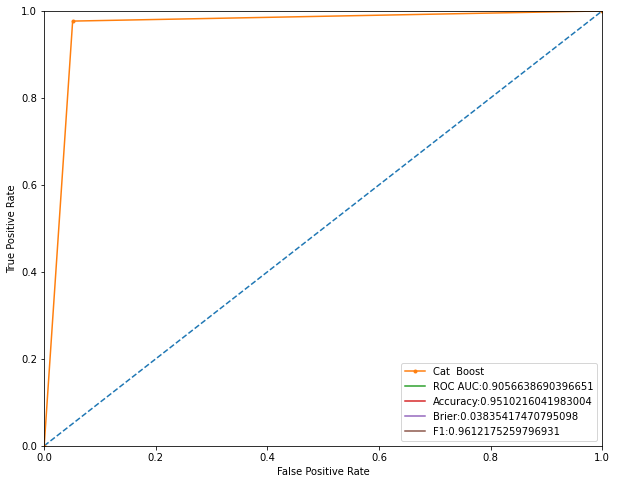

In [295]:
cb_class1_probs = cb.predict_proba(x_test)[:,1]
n_probs = [0 for _ in range(len(y_test))]
n_fpr, n_tpr, thresholds = roc_curve(y_test, n_probs)
plt.figure(figsize=(10,8))
fpr, tpr, thresholds = roc_curve(y_test, cb_predicts)
plt.plot(n_fpr, n_tpr, linestyle='--')
plt.plot(fpr, tpr, marker='.', label='Cat  Boost')
plt.plot(0, label = 'ROC AUC:'+str(cb_roc_auc))
plt.plot(0, label = 'Accuracy:'+str(cb_accuracy))
plt.plot(0, label = 'Brier:'+str(cb_brier))
plt.plot(0, label = 'F1:'+str(cb_f1))

plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.ylim([0.0, 1.0])
plt.xlim([0.0, 1.0])
plt.legend(loc=4)
plt.show()

#### Hyperparameter Tuning

In [296]:

cb_params = {
    
    'learning_rate': [0.01,0.05, 0.1],
    
"max_ctr_complexity":[3,4,5],
'n_estimators': [3,4,5],
"score_function" : ["L2", "Cosine"],
'subsample': [0.2,0.6, 0.8],
'max_depth': [4, 5,6],
"min_child_samples":[5,10]}




             
            

cb_tuned = GridSearchCV(cb, 
                           cb_params, 
                           cv = cv,
                           
                           scoring = 'accuracy',   
                           n_jobs = -1, 
                           verbose = 2) 


cb_tuned.fit(x_train, y_train)
print("En iyi parametreler: " + str(cb_tuned.best_params_))

cb_tuned= CatBoostClassifier(**cb_tuned.best_params_, verbose=False)
                              

cb_tuned.fit(x_train, y_train)

cb_tuned_predicts= cb_tuned.predict(x_test)

cb_tuned_class1_probs =cb_tuned.predict_proba(x_test)[:, 1]

cb_tuned_cm= confusion_matrix(y_test, cb_tuned_predicts)
print("\nCat Boost Confusion Matrix:\n")
print(cb_tuned_cm)

print(classification_report(y_test, cb_tuned_predicts, target_names=target_names))

Fitting 5 folds for each of 972 candidates, totalling 4860 fits
En iyi parametreler: {'learning_rate': 0.05, 'max_ctr_complexity': 3, 'max_depth': 6, 'min_child_samples': 5, 'n_estimators': 5, 'score_function': 'L2', 'subsample': 0.6}

Cat Boost Confusion Matrix:

[[231  24]
 [  6 379]]
              precision    recall  f1-score   support

           0       0.97      0.91      0.94       255
           1       0.94      0.98      0.96       385

    accuracy                           0.95       640
   macro avg       0.96      0.95      0.95       640
weighted avg       0.95      0.95      0.95       640



C:\Users\Mehmet\anaconda3\lib\site-packages\catboost\core.py:1419: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  self._init_pool(data, label, cat_features, text_features, embedding_features, embedding_features_data, pairs, weight,


In [297]:
# Eğitim ve test setlerindeki doğrulukları karşılaştırma
train_acc = cb_tuned.score(x_train, y_train)
test_acc = cb_tuned.score(x_test, y_test)

print(f"Eğitim seti doğruluğu: {train_acc}")
print(f"Test seti doğruluğu: {test_acc}")

Eğitim seti doğruluğu: 0.9722863741339491
Test seti doğruluğu: 0.953125


C:\Users\Mehmet\anaconda3\lib\site-packages\catboost\core.py:1419: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  self._init_pool(data, label, cat_features, text_features, embedding_features, embedding_features_data, pairs, weight,


In [298]:
cb_tuned_f1 = cross_val_score(cb_tuned, x, y, cv=cv, scoring='f1').mean()
print("Cat Boost doğrulanmış f1 skoru:", cb_tuned_f1)

#---------------------------------


cb_tuned_accuracy = cross_val_score(cb_tuned, x, y, cv=cv, scoring='accuracy').mean()
print("\nCat Boost doğrulanmış accuracy skoru:", cb_tuned_accuracy)

#---------------------------------

cb_tuned_brier = -1*cross_val_score(cb_tuned, x, y, cv=cv, scoring='neg_brier_score').mean()
print("\nCat Boost doğrulanmış brier skoru:", cb_tuned_brier)

#---------------------------------


cb_tuned_roc_auc = cross_val_score(cb_tuned, x, y, cv=cv, scoring=make_scorer(roc_auc_score, greater_is_better=True)).mean()
print("\nCat Boost doğrulanmış roc-auc skoru:", cb_tuned_roc_auc)

C:\Users\Mehmet\anaconda3\lib\site-packages\catboost\core.py:1419: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  self._init_pool(data, label, cat_features, text_features, embedding_features, embedding_features_data, pairs, weight,
C:\Users\Mehmet\anaconda3\lib\site-packages\catboost\core.py:1419: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  self._init_pool(data, label, cat_features, text_features, embedding_features, embedding_features_data, pairs, weight,
C:\Users\Mehmet\anaconda3\lib\site-packages\catboost\core.py:1419: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  self._init_pool(data, label, cat_features, text_features, embedding_features, embedding_features_data, pairs, weight,
C:\Users\Mehmet\anaconda3\lib\site-packages\catboost\core.py:1419: FutureWarning: iteritems is deprecated and will be removed in a future v

Cat Boost doğrulanmış f1 skoru: 0.9489809656882642


C:\Users\Mehmet\anaconda3\lib\site-packages\catboost\core.py:1419: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  self._init_pool(data, label, cat_features, text_features, embedding_features, embedding_features_data, pairs, weight,
C:\Users\Mehmet\anaconda3\lib\site-packages\catboost\core.py:1419: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  self._init_pool(data, label, cat_features, text_features, embedding_features, embedding_features_data, pairs, weight,
C:\Users\Mehmet\anaconda3\lib\site-packages\catboost\core.py:1419: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  self._init_pool(data, label, cat_features, text_features, embedding_features, embedding_features_data, pairs, weight,
C:\Users\Mehmet\anaconda3\lib\site-packages\catboost\core.py:1419: FutureWarning: iteritems is deprecated and will be removed in a future v


Cat Boost doğrulanmış accuracy skoru: 0.9401928660859372


C:\Users\Mehmet\anaconda3\lib\site-packages\catboost\core.py:1419: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  self._init_pool(data, label, cat_features, text_features, embedding_features, embedding_features_data, pairs, weight,
C:\Users\Mehmet\anaconda3\lib\site-packages\catboost\core.py:1419: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  self._init_pool(data, label, cat_features, text_features, embedding_features, embedding_features_data, pairs, weight,
C:\Users\Mehmet\anaconda3\lib\site-packages\catboost\core.py:1419: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  self._init_pool(data, label, cat_features, text_features, embedding_features, embedding_features_data, pairs, weight,
C:\Users\Mehmet\anaconda3\lib\site-packages\catboost\core.py:1419: FutureWarning: iteritems is deprecated and will be removed in a future v


Cat Boost doğrulanmış brier skoru: 0.09409273196523187

Cat Boost doğrulanmış roc-auc skoru: 0.936700348483788


C:\Users\Mehmet\anaconda3\lib\site-packages\catboost\core.py:1419: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  self._init_pool(data, label, cat_features, text_features, embedding_features, embedding_features_data, pairs, weight,


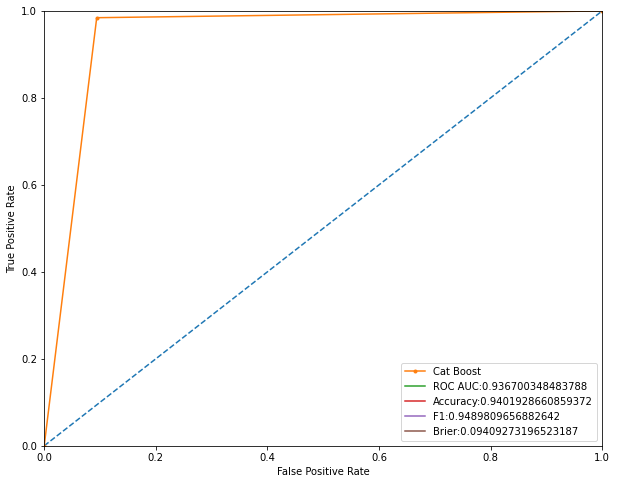

In [299]:
n_probs = [0 for _ in range(len(y_test))]
n_fpr, n_tpr, thresholds = roc_curve(y_test, n_probs)
plt.figure(figsize=(10,8))
fpr, tpr, thresholds = roc_curve(y_test, cb_tuned_predicts)
plt.plot(n_fpr, n_tpr, linestyle='--')
plt.plot(fpr, tpr, marker='.', label='Cat Boost')
plt.plot(0, label = 'ROC AUC:'+str(cb_tuned_roc_auc))
plt.plot(0, label = 'Accuracy:'+str(cb_tuned_accuracy))
plt.plot(0, label = 'F1:'+str(cb_tuned_f1))
plt.plot(0, label = 'Brier:'+str(cb_tuned_brier))
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.ylim([0.0, 1.0])
plt.xlim([0.0, 1.0])
plt.legend(loc=4)
plt.show()

<AxesSubplot:>

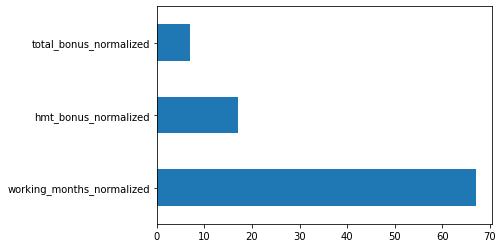

In [300]:
importances_cb = pd.Series(cb_tuned.feature_importances_, index=x.columns)
importances_cb.nlargest(3).plot(kind='barh')

### Light GBM

In [301]:
lg= LGBMClassifier()
lg.fit(x_train, y_train)

lg_predicts= lg.predict(x_test)
lg_cm= confusion_matrix(y_test, lg_predicts)
print("\nLight GBM Confusion Matrix:\n")
print(lg_cm)

print(classification_report(y_test, lg_predicts, target_names=target_names))


Light GBM Confusion Matrix:

[[243  12]
 [  7 378]]
              precision    recall  f1-score   support

           0       0.97      0.95      0.96       255
           1       0.97      0.98      0.98       385

    accuracy                           0.97       640
   macro avg       0.97      0.97      0.97       640
weighted avg       0.97      0.97      0.97       640



In [302]:
# Eğitim ve test setlerindeki doğrulukları karşılaştırma
train_acc = lg.score(x_train, y_train)
test_acc = lg.score(x_test, y_test)

print(f"Eğitim seti doğruluğu: {train_acc}")
print(f"Test seti doğruluğu: {test_acc}")

Eğitim seti doğruluğu: 0.9992301770592764
Test seti doğruluğu: 0.9703125


In [303]:
lg_f1 = cross_val_score(lg, x, y, cv=cv, scoring='f1').mean()
print("Light GBM doğrulanmış f1 skoru:", lg_f1)

#---------------------------------


lg_accuracy = cross_val_score(lg, x, y, cv=cv, scoring='accuracy').mean()
print("\nLight GBM doğrulanmış accuracy skoru:", lg_accuracy)

#---------------------------------

lg_brier = -1*cross_val_score(lg, x, y, cv=cv, scoring='neg_brier_score').mean()
print("\nLight GBM doğrulanmış brier skoru:", lg_brier)

#---------------------------------



lg_roc_auc = cross_val_score(lg, x, y, cv=cv, scoring=make_scorer(roc_auc_score, greater_is_better=True)).mean()
print("\nLight GBM doğrulanmış roc-auc skoru:", lg_roc_auc)

Light GBM doğrulanmış f1 skoru: 0.9496778326933972

Light GBM doğrulanmış accuracy skoru: 0.9376222062388451

Light GBM doğrulanmış brier skoru: 0.052522180233721114

Light GBM doğrulanmış roc-auc skoru: 0.930467250371709


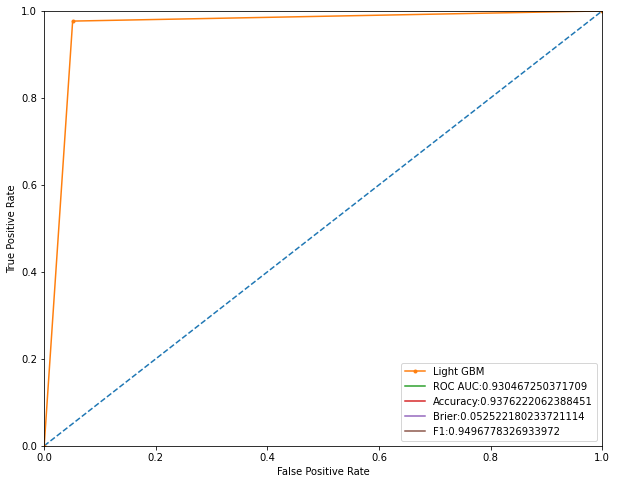

In [304]:
lg_class1_probs = lg.predict_proba(x_test)[:,1]
n_probs = [0 for _ in range(len(y_test))]
n_fpr, n_tpr, thresholds = roc_curve(y_test, n_probs)
plt.figure(figsize=(10,8))
fpr, tpr, thresholds = roc_curve(y_test, cb_predicts)
plt.plot(n_fpr, n_tpr, linestyle='--')
plt.plot(fpr, tpr, marker='.', label='Light GBM')
plt.plot(0, label = 'ROC AUC:'+str(lg_roc_auc))
plt.plot(0, label = 'Accuracy:'+str(lg_accuracy))
plt.plot(0, label = 'Brier:'+str(lg_brier))
plt.plot(0, label = 'F1:'+str(lg_f1))

plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.ylim([0.0, 1.0])
plt.xlim([0.0, 1.0])
plt.legend(loc=4)
plt.show()

#### Hyperparameter Tuning

In [305]:
lg_params = {'num_leaves': [3, 4, 5],
              'learning_rate': [0.01, 0.05, 0.1],
              'n_estimators': [50, 100, 200],
              'min_data_in_leaf': [15, 20, 25],
              'max_depth': [1,2,3, 4, 5],
              'feature_fraction': [0.1,0.3,0.6,]}
              
              



    
    
             
            

lg_tuned = GridSearchCV(lg, 
                           lg_params, 
                           cv = cv,
                           
                           scoring = 'accuracy',   
                           n_jobs = -1, 
                           verbose = 2) 


lg_tuned.fit(x_train, y_train)
print("En iyi parametreler: " + str(lg_tuned.best_params_))

lg_tuned= LGBMClassifier(**lg_tuned.best_params_
                        
              
                     )
                              

lg_tuned.fit(x_train, y_train)

lg_tuned_predicts= lg_tuned.predict(x_test)

lg_tuned_class1_probs =lg_tuned.predict_proba(x_test)[:, 1]

lg_tuned_cm= confusion_matrix(y_test, lg_tuned_predicts)
print("\nlight GBM Confusion Matrix:\n")
print(lg_tuned_cm)

print(classification_report(y_test, lg_tuned_predicts, target_names=target_names))

Fitting 5 folds for each of 1215 candidates, totalling 6075 fits
[LightGBM] [Warning] feature_fraction is set=0.6, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6
[LightGBM] [Warning] min_data_in_leaf is set=15, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=15
En iyi parametreler: {'feature_fraction': 0.6, 'learning_rate': 0.1, 'max_depth': 3, 'min_data_in_leaf': 15, 'n_estimators': 200, 'num_leaves': 4}

light GBM Confusion Matrix:

[[239  16]
 [  8 377]]
              precision    recall  f1-score   support

           0       0.97      0.94      0.95       255
           1       0.96      0.98      0.97       385

    accuracy                           0.96       640
   macro avg       0.96      0.96      0.96       640
weighted avg       0.96      0.96      0.96       640



In [306]:
# Eğitim ve test setlerindeki doğrulukları karşılaştırma
train_acc = lg_tuned.score(x_train, y_train)
test_acc = lg_tuned.score(x_test, y_test)

print(f"Eğitim seti doğruluğu: {train_acc}")
print(f"Test seti doğruluğu: {test_acc}")

Eğitim seti doğruluğu: 0.9946112394149346
Test seti doğruluğu: 0.9625


In [307]:
lg_tuned_f1 = cross_val_score(lg_tuned, x, y, cv=cv, scoring='f1').mean()
print("Light GBM doğrulanmış f1 skoru:", lg_tuned_f1)

#---------------------------------


lg_tuned_accuracy = cross_val_score(lg_tuned, x, y, cv=cv, scoring='accuracy').mean()
print("\nLight GBM doğrulanmış accuracy skoru:", lg_tuned_accuracy)

#---------------------------------

lg_tuned_brier = -1*cross_val_score(lg_tuned, x, y, cv=cv, scoring='neg_brier_score').mean()
print("\nLight GBM doğrulanmış brier skoru:", lg_tuned_brier)

#---------------------------------


lg_tuned_roc_auc = cross_val_score(lg_tuned, x, y, cv=cv, scoring=make_scorer(roc_auc_score, greater_is_better=True)).mean()
print("\nLight GBM doğrulanmış roc-auc skoru:", lg_tuned_roc_auc)

[LightGBM] [Warning] feature_fraction is set=0.6, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6
[LightGBM] [Warning] min_data_in_leaf is set=15, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=15
[LightGBM] [Warning] feature_fraction is set=0.6, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6
[LightGBM] [Warning] min_data_in_leaf is set=15, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=15
[LightGBM] [Warning] feature_fraction is set=0.6, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6
[LightGBM] [Warning] min_data_in_leaf is set=15, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=15
[LightGBM] [Warning] feature_fraction is set=0.6, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6
[LightGBM] [Warning] min_data_in_leaf is set=15, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=15
[LightGBM] [Warn

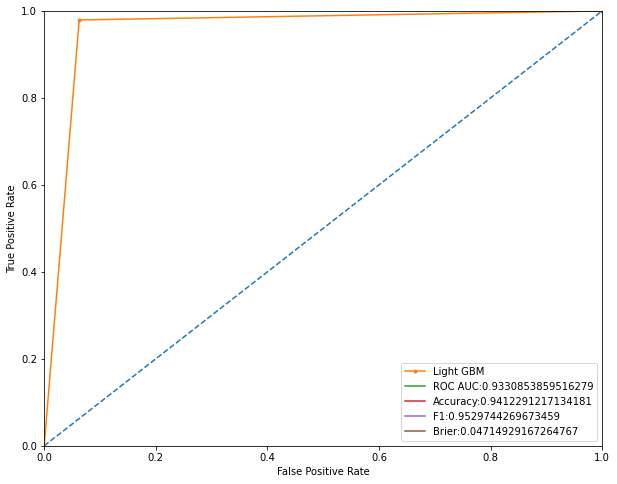

In [308]:
n_probs = [0 for _ in range(len(y_test))]
n_fpr, n_tpr, thresholds = roc_curve(y_test, n_probs)
plt.figure(figsize=(10,8))
fpr, tpr, thresholds = roc_curve(y_test, lg_tuned_predicts)
plt.plot(n_fpr, n_tpr, linestyle='--')
plt.plot(fpr, tpr, marker='.', label='Light GBM')
plt.plot(0, label = 'ROC AUC:'+str(lg_tuned_roc_auc))
plt.plot(0, label = 'Accuracy:'+str(lg_tuned_accuracy))
plt.plot(0, label = 'F1:'+str(lg_tuned_f1))
plt.plot(0, label = 'Brier:'+str(lg_tuned_brier))
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')
plt.ylim([0.0, 1.0])
plt.xlim([0.0, 1.0])
plt.legend(loc=4)
plt.show()

<AxesSubplot:>

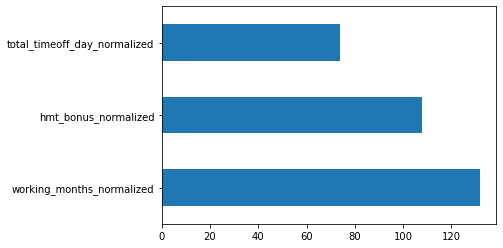

In [309]:
importances_lg = pd.Series(lg_tuned.feature_importances_, index=x.columns)
importances_lg.nlargest(3).plot(kind='barh')

### Model Compare

In [310]:
model_names = ['Light GBM', 'Random Forest','GBM', 'Ada Boost','KNN', 'XG Boost', 
               'Cat Boost']

accuracy = [lg_accuracy, rf_accuracy, gbc_accuracy, ada_accuracy,  knn_accuracy, xg_accuracy, 
            cb_accuracy]



tuned_accuracy = [lg_tuned_accuracy, rf_tuned_accuracy,  gbc_tuned_accuracy, ada_tuned_accuracy, 
                  knn_tuned_accuracy, xg_tuned_accuracy, cb_tuned_accuracy]



brier = [lg_brier, rf_brier,  gbc_brier, ada_brier,  knn_brier, xg_brier, cb_brier]

tuned_brier =[lg_tuned_brier, rf_tuned_brier,  gbc_tuned_brier, ada_tuned_brier, 
              knn_tuned_brier, xg_tuned_brier, cb_tuned_brier]

f1 = [lg_f1, rf_f1,  gbc_f1, ada_f1,  knn_f1, xg_f1, cb_f1]


tuned_f1 = [lg_tuned_f1, rf_tuned_f1,  gbc_tuned_f1, ada_tuned_f1,  knn_tuned_f1, xg_tuned_f1, 
            cb_tuned_f1]


roc_auc = [lg_roc_auc, rf_roc_auc,gbc_roc_auc, ada_roc_auc,  knn_roc_auc, xg_roc_auc, cb_roc_auc]



tuned_roc_auc = [lg_tuned_roc_auc, rf_tuned_roc_auc, gbc_tuned_roc_auc, ada_tuned_roc_auc, 
                 knn_tuned_roc_auc, xg_tuned_roc_auc, cb_tuned_roc_auc]



In [311]:
model_compare = pd.DataFrame({'Model': model_names, 'Accuracy': accuracy,  'Tuned Accuracy': tuned_accuracy,
              'Brier': brier,'Tuned Brier': tuned_brier, 'F1': f1,
             'Tuned F1': tuned_f1,  'Roc Auc': roc_auc,  'Tuned Roc Auc': tuned_roc_auc
             })

In [312]:
model_compare.sort_values(by='Tuned Roc Auc', ascending=False)

,Model,Accuracy,Tuned Accuracy,Brier,Tuned Brier,F1,Tuned F1,Roc Auc,Tuned Roc Auc
6,Cat Boost,0.951022,0.940193,0.038354,0.094093,0.961218,0.948981,0.905664,0.936700
0,Light GBM,0.937622,0.941229,0.052522,0.047149,0.949678,0.952974,0.930467,0.933085
2,GBM,0.941739,0.913903,0.048278,0.131894,0.952679,0.929145,0.934714,0.905849
5,XG Boost,0.931433,0.918546,0.055265,0.060663,0.942464,0.937599,0.927305,0.905664
3,Ada Boost,0.919556,0.895822,0.210654,0.168031,0.931829,0.913576,0.913398,0.884025
1,Random Forest,0.927819,0.899444,0.056868,0.073732,0.948025,-0.936654,0.911017,0.871518
4,KNN,0.784925,0.788529,0.162674,0.174617,0.834022,0.835187,0.760063,0.766779


## Validation

In [313]:
df_valid['total_notice'] = df_valid['total_notice'].astype(int)
'''x_valid = df_valid.drop(["target", "employee_id",'year', 'month','military_status','title','employment_type','department_code', 'location',"education",
                  "age","working_months","hmt_bonus","total_bonus","hmt_timeoff","total_timeoff_day", 'first_manager_id',df.columns[26],
                  df.columns[33],'Ankara','Istanbul'], axis=1)'''

'''x_valid = df_valid.drop(["target", "employee_id",'year', 'month','military_status','title','employment_type','department_code', 'location',"education",
                  "age","working_months","hmt_bonus","total_bonus","hmt_timeoff","total_timeoff_day"], axis=1)'''

x_valid = df_valid.drop(["target", "employee_id",'year', 'month','military_status','title','employment_type','department_code', 'location',"education",
                  "age","working_months","hmt_bonus","total_bonus","hmt_timeoff","total_timeoff_day"], axis=1)

y_valid = df_valid["target"]

C:\Users\Mehmet\AppData\Local\Temp\ipykernel_19120\3776106206.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_valid['total_notice'] = df_valid['total_notice'].astype(int)


In [314]:
x_valid

,gender,marital_status,first_manager_id,number_of_children,total_notice,Muaf,Tamamlamis,Tecilli,Asistan,Dis Kaynak,Kursiyer,Uzman,Uzman Yardimcisi,Yetkili,Yonetmen,Belirli Sureli Sozlesmeli,Dis Kaynak,Is-Kur,Kadrolu,Part-Time Kadrolu,IM,MS,TS,Ankara,Istanbul,Izmir,education_values,1. Derece Akrabanın Ağır Hastalığı Veya Vefatı,Diğer,Doğum İzni,Evlilik İzni,Sağlık Raporu,Yıllık Ücretli İzin,izin_yok,Ücretsiz İzin,İdari İzin,age_normalized,working_months_normalized,hmt_bonus_normalized,total_bonus_normalized,hmt_timeoff_normalized,total_timeoff_day_normalized
0,1,1,0.038415,0.0,1,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,1,0,2.0,1,0,1,0,1,1,0,1,0,0.368421,0.331551,0.704545,0.315328,0.353488,0.753608
1,1,1,0.038415,0.0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,1,0,2.0,0,0,0,0,1,1,0,0,0,0.263158,0.310160,0.977273,0.146729,0.176744,0.141237
2,1,1,0.038415,0.0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,1,0,0,0,1,0,2.0,0,1,0,1,1,1,0,0,0,0.184211,0.235294,1.000000,0.203062,0.288372,0.344330
3,1,1,0.143944,0.0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,1,0,0,3.0,1,1,1,1,1,1,0,1,0,0.263158,0.208556,0.727273,0.085845,0.316279,0.658763
4,1,1,0.038415,0.0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,1,0,3.0,1,1,1,1,1,1,0,1,0,0.342105,0.192513,0.659091,0.370876,0.241860,0.702062
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2746,0,0,0.038415,0.0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,2.0,0,0,0,0,0,0,1,0,0,0.026316,0.000000,0.068182,0.006906,0.000000,0.000000
2747,0,0,0.038415,0.0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,2.0,0,0,0,0,0,0,1,0,0,0.131579,0.000000,0.068182,0.011216,0.000000,0.000000
2748,1,0,0.038415,0.0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,2.0,0,0,0,0,0,0,1,0,0,0.157895,0.000000,0.068182,0.025297,0.000000,0.000000
2749,1,0,0.038415,0.0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,1,0,3.0,0,0,0,0,0,1,0,0,0,0.263158,0.000000,0.068182,0.016673,0.004651,0.001031


### Random Forest

In [315]:
rf_predicts= rf.predict(x_valid)

In [316]:
rf_cm= confusion_matrix(y_valid, rf_predicts)
print("\nRandom Forest Confusion Matrix:\n")
print(rf_cm)


Random Forest Confusion Matrix:

[[173 131]
 [ 40 468]]


In [317]:
target_names = ['0', '1']
print(classification_report(y_valid, rf_predicts, target_names=target_names))

              precision    recall  f1-score   support

           0       0.81      0.57      0.67       304
           1       0.78      0.92      0.85       508

    accuracy                           0.79       812
   macro avg       0.80      0.75      0.76       812
weighted avg       0.79      0.79      0.78       812



In [318]:
rf_f1=f1_score(y_valid, rf_predicts)

In [319]:
rf_roc_auc=roc_auc_score(y_valid, rf.predict_proba(x_valid)[:, 1])

In [320]:
rf_accuracy=accuracy_score(y_valid, rf.predict(x_valid))

In [321]:
rf_brier=brier_score_loss(y_valid, rf.predict_proba(x_valid)[:, 1])

**Tuned**

In [322]:
rf_tuned_predicts= rf_tuned.predict(x_valid)

In [323]:
rf_cm= confusion_matrix(y_valid, rf_tuned_predicts)
print("\nRandom Forest Confusion Matrix:\n")
print(rf_cm)


Random Forest Confusion Matrix:

[[183 121]
 [ 38 470]]


In [324]:
target_names = ['0', '1']
print(classification_report(y_valid, rf_tuned_predicts, target_names=target_names))

              precision    recall  f1-score   support

           0       0.83      0.60      0.70       304
           1       0.80      0.93      0.86       508

    accuracy                           0.80       812
   macro avg       0.81      0.76      0.78       812
weighted avg       0.81      0.80      0.80       812



In [325]:
rf_tuned_f1=f1_score(y_valid, rf_tuned_predicts)

In [326]:

rf_tuned_roc_auc=roc_auc_score(y_valid, rf_tuned.predict_proba(x_valid)[:, 1])

In [327]:

rf_tuned_accuracy=accuracy_score(y_valid, rf_tuned.predict(x_valid))

In [328]:

rf_tuned_brier=brier_score_loss(y_valid, rf_tuned.predict_proba(x_valid)[:, 1])

### Gradient Boosting

In [329]:
gbc_predicts= gbc.predict(x_valid)
gbc_cm= confusion_matrix(y_valid, gbc_predicts)
print("\nGradient Boosting Confusion Matrix:\n")
print(gbc_cm)


Gradient Boosting Confusion Matrix:

[[262  42]
 [ 43 465]]


In [330]:
print(classification_report(y_valid, gbc_predicts, target_names=target_names))

              precision    recall  f1-score   support

           0       0.86      0.86      0.86       304
           1       0.92      0.92      0.92       508

    accuracy                           0.90       812
   macro avg       0.89      0.89      0.89       812
weighted avg       0.90      0.90      0.90       812



In [331]:
gbc_f1=f1_score(y_valid, gbc_predicts)
gbc_roc_auc=roc_auc_score(y_valid, gbc.predict_proba(x_valid)[:, 1])
gbc_accuracy=accuracy_score(y_valid, gbc.predict(x_valid))
gbc_brier=brier_score_loss(y_valid, gbc.predict_proba(x_valid)[:, 1])

**Tuned**

In [332]:
gbc_tuned_predicts= gbc_tuned.predict(x_valid)

In [333]:
gbc_cm= confusion_matrix(y_valid, gbc_tuned_predicts)
print("\nRandom Forest Confusion Matrix:\n")
print(gbc_cm)


Random Forest Confusion Matrix:

[[245  59]
 [ 34 474]]


In [334]:
target_names = ['0', '1']
print(classification_report(y_valid, gbc_tuned_predicts, target_names=target_names))

              precision    recall  f1-score   support

           0       0.88      0.81      0.84       304
           1       0.89      0.93      0.91       508

    accuracy                           0.89       812
   macro avg       0.88      0.87      0.88       812
weighted avg       0.89      0.89      0.88       812



In [335]:
gbc_tuned_f1=f1_score(y_valid, gbc_tuned_predicts)

In [336]:

gbc_tuned_roc_auc=roc_auc_score(y_valid, gbc_tuned.predict_proba(x_valid)[:, 1])

In [337]:

gbc_tuned_accuracy=accuracy_score(y_valid, gbc_tuned.predict(x_valid))

In [338]:

gbc_tuned_brier=brier_score_loss(y_valid, gbc_tuned.predict_proba(x_valid)[:, 1])

### Ada Boost

In [339]:
ada_predicts= ada.predict(x_valid)
ada_cm= confusion_matrix(y_valid, ada_predicts)
print("\nAda Boost Confusion Matrix:\n")
print(ada_cm)


Ada Boost Confusion Matrix:

[[227  77]
 [ 51 457]]


In [340]:
print(classification_report(y_valid, ada_predicts, target_names=target_names))

              precision    recall  f1-score   support

           0       0.82      0.75      0.78       304
           1       0.86      0.90      0.88       508

    accuracy                           0.84       812
   macro avg       0.84      0.82      0.83       812
weighted avg       0.84      0.84      0.84       812



In [341]:
ada_f1=f1_score(y_valid, ada_predicts)
ada_roc_auc=roc_auc_score(y_valid, ada.predict_proba(x_valid)[:, 1])
ada_accuracy=accuracy_score(y_valid, ada.predict(x_valid))
ada_brier=brier_score_loss(y_valid, ada.predict_proba(x_valid)[:, 1])

**Tuned**

In [342]:
ada_tuned_predicts= ada_tuned.predict(x_valid)

In [343]:
ada_cm= confusion_matrix(y_valid, ada_tuned_predicts)
print("\nAda Boost Confusion Matrix:\n")
print(ada_cm)


Ada Boost Confusion Matrix:

[[304   0]
 [ 88 420]]


In [344]:
target_names = ['0', '1']
print(classification_report(y_valid, ada_tuned_predicts, target_names=target_names))

              precision    recall  f1-score   support

           0       0.78      1.00      0.87       304
           1       1.00      0.83      0.91       508

    accuracy                           0.89       812
   macro avg       0.89      0.91      0.89       812
weighted avg       0.92      0.89      0.89       812



In [345]:
ada_tuned_f1=f1_score(y_valid, ada_tuned_predicts)

In [346]:
ada_tuned_roc_auc=roc_auc_score(y_valid, ada_tuned.predict_proba(x_valid)[:, 1])

In [347]:

ada_tuned_accuracy=accuracy_score(y_valid, ada_tuned.predict(x_valid))

In [348]:

ada_tuned_brier=brier_score_loss(y_valid, ada_tuned.predict_proba(x_valid)[:, 1])

### KNN

In [349]:
knn_predicts= knn.predict(x_valid)
knn_cm= confusion_matrix(y_valid, knn_predicts)
print("\nKNN Confusion Matrix:\n")
print(knn_cm)

print(classification_report(y_valid, knn_predicts, target_names=target_names))


KNN Confusion Matrix:

[[ 61 243]
 [ 46 462]]
              precision    recall  f1-score   support

           0       0.57      0.20      0.30       304
           1       0.66      0.91      0.76       508

    accuracy                           0.64       812
   macro avg       0.61      0.56      0.53       812
weighted avg       0.62      0.64      0.59       812



In [350]:
knn_f1=f1_score(y_valid, knn_predicts)
knn_roc_auc=roc_auc_score(y_valid, knn.predict_proba(x_valid)[:, 1])
knn_accuracy=accuracy_score(y_valid, knn.predict(x_valid))
knn_brier=brier_score_loss(y_valid, knn.predict_proba(x_valid)[:, 1])

**Tuned**

In [351]:
knn_tuned_predicts= knn_tuned.predict(x_valid)

In [352]:
knn_cm= confusion_matrix(y_valid, knn_tuned_predicts)
print("\nAda Boost Confusion Matrix:\n")
print(knn_cm)


Ada Boost Confusion Matrix:

[[ 60 244]
 [ 48 460]]


In [353]:
target_names = ['0', '1']
print(classification_report(y_valid, knn_tuned_predicts, target_names=target_names))

              precision    recall  f1-score   support

           0       0.56      0.20      0.29       304
           1       0.65      0.91      0.76       508

    accuracy                           0.64       812
   macro avg       0.60      0.55      0.53       812
weighted avg       0.62      0.64      0.58       812



In [354]:
knn_tuned_f1=f1_score(y_valid, knn_tuned_predicts)
knn_tuned_roc_auc=roc_auc_score(y_valid, knn_tuned.predict_proba(x_valid)[:, 1])
knn_tuned_accuracy=accuracy_score(y_valid, knn_tuned.predict(x_valid))
knn_tuned_brier=brier_score_loss(y_valid, knn_tuned.predict_proba(x_valid)[:, 1])

### XG Boost

In [355]:
xg_predicts= xg.predict(x_valid)
xg_cm= confusion_matrix(y_valid, xg_predicts)
print("\nXG Boost Confusion Matrix:\n")
print(xg_cm)

print(classification_report(y_valid, xg_predicts, target_names=target_names))


XG Boost Confusion Matrix:

[[279  25]
 [ 43 465]]
              precision    recall  f1-score   support

           0       0.87      0.92      0.89       304
           1       0.95      0.92      0.93       508

    accuracy                           0.92       812
   macro avg       0.91      0.92      0.91       812
weighted avg       0.92      0.92      0.92       812



In [356]:
xg_f1=f1_score(y_valid, xg_predicts)
xg_roc_auc=roc_auc_score(y_valid, xg.predict_proba(x_valid)[:, 1])
xg_accuracy=accuracy_score(y_valid, xg.predict(x_valid))
xg_brier=brier_score_loss(y_valid, xg.predict_proba(x_valid)[:, 1])

**Tuned**

In [357]:
xg_tuned_predicts= xg_tuned.predict(x_valid)

In [358]:
xg_cm= confusion_matrix(y_valid, xg_tuned_predicts)
print("\nXG Boost Confusion Matrix:\n")
print(xg_cm)


XG Boost Confusion Matrix:

[[263  41]
 [ 43 465]]


In [359]:
target_names = ['0', '1']
print(classification_report(y_valid, xg_tuned_predicts, target_names=target_names))

              precision    recall  f1-score   support

           0       0.86      0.87      0.86       304
           1       0.92      0.92      0.92       508

    accuracy                           0.90       812
   macro avg       0.89      0.89      0.89       812
weighted avg       0.90      0.90      0.90       812



In [360]:
xg_tuned_f1=f1_score(y_valid, xg_tuned_predicts)
xg_tuned_roc_auc=roc_auc_score(y_valid, xg_tuned.predict_proba(x_valid)[:, 1])
xg_tuned_accuracy=accuracy_score(y_valid, xg_tuned.predict(x_valid))
xg_tuned_brier=brier_score_loss(y_valid, xg_tuned.predict_proba(x_valid)[:, 1])

### Cat Boost

In [361]:
cb_predicts= cb.predict(x_valid)
cb_cm= confusion_matrix(y_valid, cb_predicts)
print("\nCat Boost Confusion Matrix:\n")
print(cb_cm)

print(classification_report(y_valid, cb_predicts, target_names=target_names))


Cat Boost Confusion Matrix:

[[272  32]
 [ 39 469]]
              precision    recall  f1-score   support

           0       0.87      0.89      0.88       304
           1       0.94      0.92      0.93       508

    accuracy                           0.91       812
   macro avg       0.91      0.91      0.91       812
weighted avg       0.91      0.91      0.91       812



C:\Users\Mehmet\anaconda3\lib\site-packages\catboost\core.py:1419: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  self._init_pool(data, label, cat_features, text_features, embedding_features, embedding_features_data, pairs, weight,


In [362]:
cb_f1=f1_score(y_valid, cb_predicts)
cb_roc_auc=roc_auc_score(y_valid, cb.predict_proba(x_valid)[:, 1])
cb_accuracy=accuracy_score(y_valid, cb.predict(x_valid))
cb_brier=brier_score_loss(y_valid, cb.predict_proba(x_valid)[:, 1])

C:\Users\Mehmet\anaconda3\lib\site-packages\catboost\core.py:1419: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  self._init_pool(data, label, cat_features, text_features, embedding_features, embedding_features_data, pairs, weight,
C:\Users\Mehmet\anaconda3\lib\site-packages\catboost\core.py:1419: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  self._init_pool(data, label, cat_features, text_features, embedding_features, embedding_features_data, pairs, weight,
C:\Users\Mehmet\anaconda3\lib\site-packages\catboost\core.py:1419: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  self._init_pool(data, label, cat_features, text_features, embedding_features, embedding_features_data, pairs, weight,


**Tuned**

In [363]:
cb_tuned_predicts= cb_tuned.predict(x_valid)

C:\Users\Mehmet\anaconda3\lib\site-packages\catboost\core.py:1419: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  self._init_pool(data, label, cat_features, text_features, embedding_features, embedding_features_data, pairs, weight,


In [364]:
cb_cm= confusion_matrix(y_valid, cb_tuned_predicts)
print("\nAda Boost Confusion Matrix:\n")
print(cb_cm)


Ada Boost Confusion Matrix:

[[261  43]
 [ 40 468]]


In [365]:
target_names = ['0', '1']
print(classification_report(y_valid, cb_tuned_predicts, target_names=target_names))

              precision    recall  f1-score   support

           0       0.87      0.86      0.86       304
           1       0.92      0.92      0.92       508

    accuracy                           0.90       812
   macro avg       0.89      0.89      0.89       812
weighted avg       0.90      0.90      0.90       812



In [366]:
cb_tuned_f1=f1_score(y_valid, cb_tuned_predicts)
cb_tuned_roc_auc=roc_auc_score(y_valid, cb_tuned.predict_proba(x_valid)[:, 1])
cb_tuned_accuracy=accuracy_score(y_valid, cb_tuned.predict(x_valid))
cb_tuned_brier=brier_score_loss(y_valid, cb_tuned.predict_proba(x_valid)[:, 1])

C:\Users\Mehmet\anaconda3\lib\site-packages\catboost\core.py:1419: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  self._init_pool(data, label, cat_features, text_features, embedding_features, embedding_features_data, pairs, weight,
C:\Users\Mehmet\anaconda3\lib\site-packages\catboost\core.py:1419: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  self._init_pool(data, label, cat_features, text_features, embedding_features, embedding_features_data, pairs, weight,
C:\Users\Mehmet\anaconda3\lib\site-packages\catboost\core.py:1419: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  self._init_pool(data, label, cat_features, text_features, embedding_features, embedding_features_data, pairs, weight,


### Light GBM

In [367]:
lg_predicts= lg.predict(x_valid)
lg_cm= confusion_matrix(y_valid, lg_predicts)
print("\nLight GBM Confusion Matrix:\n")
print(lg_cm)

print(classification_report(y_valid, lg_predicts, target_names=target_names))


Light GBM Confusion Matrix:

[[268  36]
 [ 43 465]]
              precision    recall  f1-score   support

           0       0.86      0.88      0.87       304
           1       0.93      0.92      0.92       508

    accuracy                           0.90       812
   macro avg       0.89      0.90      0.90       812
weighted avg       0.90      0.90      0.90       812



In [368]:
lg_f1=f1_score(y_valid, lg_predicts)
lg_roc_auc=roc_auc_score(y_valid, lg.predict_proba(x_valid)[:, 1])
lg_accuracy=accuracy_score(y_valid, lg.predict(x_valid))
lg_brier=brier_score_loss(y_valid, lg.predict_proba(x_valid)[:, 1])

**Tuned**

In [369]:
lg_tuned_predicts= lg_tuned.predict(x_valid)

In [370]:
lg_cm= confusion_matrix(y_valid, lg_tuned_predicts)
print("\XG Boost Confusion Matrix:\n")
print(lg_cm)

\XG Boost Confusion Matrix:

[[266  38]
 [ 42 466]]


In [371]:
target_names = ['0', '1']
print(classification_report(y_valid, lg_tuned_predicts, target_names=target_names))

              precision    recall  f1-score   support

           0       0.86      0.88      0.87       304
           1       0.92      0.92      0.92       508

    accuracy                           0.90       812
   macro avg       0.89      0.90      0.90       812
weighted avg       0.90      0.90      0.90       812



In [372]:
lg_tuned_f1=f1_score(y_valid, lg_tuned_predicts)
lg_tuned_roc_auc=roc_auc_score(y_valid, lg_tuned.predict_proba(x_valid)[:, 1])
lg_tuned_accuracy=accuracy_score(y_valid, lg_tuned.predict(x_valid))
lg_tuned_brier=brier_score_loss(y_valid, lg_tuned.predict_proba(x_valid)[:, 1])

### Model Compare

In [373]:
model_names = ['Light GBM', 'Random Forest','GBM', 'Ada Boost','KNN', 'XG Boost', 
               'Cat Boost']

accuracy = [lg_accuracy, rf_accuracy, gbc_accuracy, ada_accuracy,  knn_accuracy, xg_accuracy, 
            cb_accuracy]



tuned_accuracy = [lg_tuned_accuracy, rf_tuned_accuracy,  gbc_tuned_accuracy, ada_tuned_accuracy, 
                  knn_tuned_accuracy, xg_tuned_accuracy, cb_tuned_accuracy]



brier = [lg_brier, rf_brier,  gbc_brier, ada_brier,  knn_brier, xg_brier, cb_brier]

tuned_brier =[lg_tuned_brier, rf_tuned_brier,  gbc_tuned_brier, ada_tuned_brier, 
              knn_tuned_brier, xg_tuned_brier, cb_tuned_brier]

f1 = [lg_f1, rf_f1,  gbc_f1, ada_f1,  knn_f1, xg_f1, cb_f1]


tuned_f1 = [lg_tuned_f1, rf_tuned_f1,  gbc_tuned_f1, ada_tuned_f1,  knn_tuned_f1, xg_tuned_f1, 
            cb_tuned_f1]


roc_auc = [lg_roc_auc, rf_roc_auc,gbc_roc_auc, ada_roc_auc,  knn_roc_auc, xg_roc_auc, cb_roc_auc]



tuned_roc_auc = [lg_tuned_roc_auc, rf_tuned_roc_auc, gbc_tuned_roc_auc, ada_tuned_roc_auc, 
                 knn_tuned_roc_auc, xg_tuned_roc_auc, cb_tuned_roc_auc]



In [374]:
model_compare = pd.DataFrame({'Model': model_names, 'Accuracy': accuracy,  'Tuned Accuracy': tuned_accuracy,
              'Brier': brier,'Tuned Brier': tuned_brier, 'F1': f1,
             'Tuned F1': tuned_f1,  'Roc Auc': roc_auc,  'Tuned Roc Auc': tuned_roc_auc
             })

In [375]:
model_compare.sort_values(by='Tuned Roc Auc', ascending=False)

,Model,Accuracy,Tuned Accuracy,Brier,Tuned Brier,F1,Tuned F1,Roc Auc,Tuned Roc Auc
6,Cat Boost,0.912562,0.897783,0.057997,0.096971,0.929633,0.918548,0.980370,0.978923
2,GBM,0.895320,0.885468,0.071004,0.136517,0.916256,0.910663,0.971091,0.975018
5,XG Boost,0.916256,0.896552,0.068843,0.069374,0.931864,0.917160,0.975967,0.969161
0,Light GBM,0.902709,0.901478,0.089875,0.077327,0.921705,0.920949,0.966118,0.958406
1,Random Forest,0.789409,0.804187,0.124355,0.127209,0.845528,0.855323,0.924161,0.923918
3,Ada Boost,0.842365,0.891626,0.229748,0.172351,0.877159,0.905172,0.911573,0.905460
4,KNN,0.644089,0.640394,0.287586,0.316092,0.761748,0.759076,0.583215,0.567978


In [376]:
df_valid["probs"]=cb_tuned.predict_proba(x_valid)[:,1]

C:\Users\Mehmet\anaconda3\lib\site-packages\catboost\core.py:1419: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  self._init_pool(data, label, cat_features, text_features, embedding_features, embedding_features_data, pairs, weight,
C:\Users\Mehmet\AppData\Local\Temp\ipykernel_19120\3829566423.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_valid["probs"]=cb_tuned.predict_proba(x_valid)[:,1]


In [377]:
df_valid["probs"]=df_valid.probs*100

C:\Users\Mehmet\AppData\Local\Temp\ipykernel_19120\2969481118.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_valid["probs"]=df_valid.probs*100


In [378]:
df_valid["preds"]=cb_tuned.predict(x_valid)

C:\Users\Mehmet\anaconda3\lib\site-packages\catboost\core.py:1419: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  self._init_pool(data, label, cat_features, text_features, embedding_features, embedding_features_data, pairs, weight,
C:\Users\Mehmet\AppData\Local\Temp\ipykernel_19120\2835499370.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_valid["preds"]=cb_tuned.predict(x_valid)


In [379]:
#Ayrılma olasılığı en yüksek olan 20 profil
df_valid[["employee_id","target",'preds','probs']].sort_values(by='probs', ascending = False)[0:20]

,employee_id,target,preds,probs
406,87587,1,1,79.853167
135,72596,1,1,79.853167
294,85574,1,1,79.853167
292,85589,1,1,79.853167
291,85598,1,1,79.853167
117,98360,1,1,79.853167
290,85604,1,1,79.853167
119,98342,1,1,79.853167
289,85613,1,1,79.853167
287,85619,1,1,79.853167
